In [2]:
from config import *
from functions import *
from sim_new import *
from read_ramses import *

from types import SimpleNamespace

# plotting
from matplotlib.transforms import Affine2D
import mpl_toolkits.axisartist.floating_axes as floating_axes
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from scipy.ndimage import gaussian_filter

# math
import numpy as np
from scipy.interpolate import interp1d
from scipy.integrate import trapz, cumtrapz
from scipy.fft import fftn, fftfreq, fftshift
from scipy.signal.windows import blackman
from scipy.optimize import curve_fit, minimize, leastsq
from scipy.signal import welch

# cosmology
from colossus.cosmology import cosmology
from colossus.lss import peaks
from colossus.lss import mass_function
cosmo = cosmology.setCosmology('planck18');
import const

# yt
import yt
from yt.visualization.fixed_resolution import FixedResolutionBuffer


In [3]:
data = np.load('/home/za9132/analysis/proj_highphot.npz')
sim = Sim(9, "fiducial", "data_d52_l1_b5.npz")
im_gas_face = data['im_gas_face']
im_gas_edge = data['im_gas_edge']
im_star_face = data['im_star_face']
im_star_edge = data['im_star_edge']
scale1d = data['scale1d']
psd1d_gas = data['psd1d_gas']
psd1d_star = data['psd1d_star']
v1_face = data['v1_face']
v2_face = data['v2_face']
v1_edge = data['v1_edge']
v2_edge = data['v2_edge']
v1_star_face = data['v1_star_face']
v2_star_face = data['v2_star_face']
v1_star_edge = data['v1_star_edge']
v2_star_edge = data['v2_star_edge']
j_disk = data['j_disk']
v_bulk = data['v_bulk']
coord_center = data['coord_center']


Moving to directory '/home/za9132/scratch/romain/round9/fiducial'.


In [5]:
# compute wavenumber array
freq = fftshift(fftfreq(int(sim.N), d=sim.dx))
kx = freq.reshape(sim.N, 1, 1)
ky = freq.reshape(1, sim.N, 1)
kz = freq.reshape(1, 1, sim.N)
k = np.sqrt(kx**2 + ky**2 + kz**2)

# compute window function
blackman3d = blackman(sim.N)[:, None, None] * blackman(sim.N)[None, :, None] * blackman(sim.N)[None, None, :]
blackman3d /= np.sum(blackman3d)

# compute the PSD
psd_gas = fftshift(np.abs(fftn(sim.density * blackman3d))**2)
psd_star = fftshift(np.abs(fftn(sim.density_star * blackman3d))**2)
scale1d, psd1d_gas  = calc_hist1d(1/k, weight=psd_gas, vmin=(10*const.pc), vmax=(1000*const.pc), nbin=128, do_pdf=False)
scale1d, psd1d_star = calc_hist1d(1/k, weight=psd_star, vmin=(10*const.pc), vmax=(1000*const.pc), nbin=128, do_pdf=False)


/tmp/ipykernel_3999797/2978674401.py:15: RuntimeWarning: divide by zero encountered in divide
  scale1d, psd1d_gas  = calc_hist1d(1/k, weight=psd_gas, vmin=(10*const.pc), vmax=(1000*const.pc), nbin=128, do_pdf=False)
/tmp/ipykernel_3999797/2978674401.py:16: RuntimeWarning: divide by zero encountered in divide
  scale1d, psd1d_star = calc_hist1d(1/k, weight=psd_star, vmin=(10*const.pc), vmax=(1000*const.pc), nbin=128, do_pdf=False)


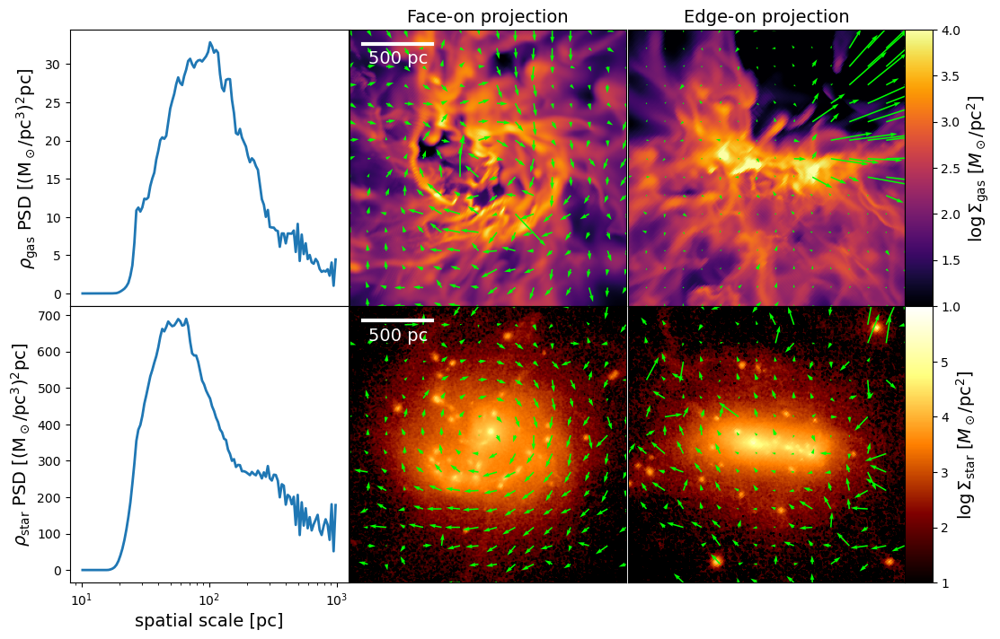

In [4]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(12, 8))
plt.subplots_adjust(hspace=1e-3, wspace=1e-3)

size_img = 2*const.kpc

im_gas = sim.plot_img(im_gas_face/(const.M_sol/const.pc**2), size_img, ax=axs[0, 1], cmap='inferno', do_log=True, vmin=1e1, vmax=1e4)
im_gas = sim.plot_img(im_gas_edge/(const.M_sol/const.pc**2), size_img, ax=axs[0, 2], cmap='inferno', do_log=True, vmin=1e1, vmax=1e4)
im_star = sim.plot_img(im_star_face/(const.M_sol/const.pc**2)+1e-30, size_img, ax=axs[1, 1], cmap='afmhot', do_log=True, vmin=1e1, vmax=1e6)
im_star = sim.plot_img(im_star_edge/(const.M_sol/const.pc**2)+1e-30, size_img, ax=axs[1, 2], cmap='afmhot', do_log=True, vmin=1e1, vmax=1e6)

for i in range(2):
    for j in range(1,3):
        ax = axs[i, j]
        ax.set_xticks([])
        ax.set_yticks([])

dis = 500*const.pc
axs[0, 1].plot([-0.9*size_img/const.kpc/2, (-0.9*size_img/2 + dis)/const.kpc], [0.9*size_img/const.kpc/2, 0.9*size_img/const.kpc/2], lw=3, color='white')
axs[0, 1].annotate('%.3g %s' % (dis/const.pc, 'pc'), ((-0.9*size_img + dis)/const.kpc/2, 0.85*size_img/2/const.kpc), color='white', horizontalalignment='center', verticalalignment='top', fontsize=14)
axs[1, 1].plot([-0.9*size_img/const.kpc/2, (-0.9*size_img/2 + dis)/const.kpc], [0.9*size_img/const.kpc/2, 0.9*size_img/const.kpc/2], lw=3, color='white')
axs[1, 1].annotate('%.3g %s' % (dis/const.pc, 'pc'), ((-0.9*size_img + dis)/const.kpc/2, 0.85*size_img/2/const.kpc), color='white', horizontalalignment='center', verticalalignment='top', fontsize=14)

cax = axs[0, 2].inset_axes([1, 0, 0.1, 1])
cbar = plt.colorbar(im_gas, cax=cax)
cbar.set_label(r'$\log \Sigma_{\rm gas}$ [$M_\odot/{\rm pc}^2$]', fontsize=14)

cax = axs[1, 2].inset_axes([1, 0, 0.1, 1])
cbar = plt.colorbar(im_star, cax=cax, ticks=[1, 2, 3, 4, 5])
cbar.set_label(r'$\log \Sigma_{\rm star}$ [$M_\odot/{\rm pc}^2$]', fontsize=14)

axs[0, 0].plot(scale1d/const.pc, psd1d_gas/(const.M_sol/const.pc**3)**2, lw=2)
axs[0, 0].set_xscale('log')
axs[0, 0].set_xlabel('spatial scale [pc]', fontsize=14)
axs[0, 0].set_ylabel(r'$\rho_{\rm gas}$ PSD [${\rm (M_\odot/pc^3)^2 pc}$]', fontsize=14)

axs[1, 0].plot(scale1d/const.pc, psd1d_star/(const.M_sol/const.pc**3)**2, lw=2)
axs[1, 0].set_xscale('log')
axs[1, 0].set_xlabel('spatial scale [pc]', fontsize=14)
axs[1, 0].set_ylabel(r'$\rho_{\rm star}$ PSD [${\rm (M_\odot/pc^3)^2 pc}$]', fontsize=14)

axs[0, 1].set_title('Face-on projection', fontsize=14)
axs[0, 2].set_title('Edge-on projection', fontsize=14)

coord1_1d = np.linspace(-const.pc, const.pc, 16)
coord2_1d = np.linspace(-const.pc, const.pc, 16)
coord1_2d, coord2_2d = np.meshgrid(coord1_1d, coord2_1d, indexing='ij')
axs[0, 1].quiver(coord1_2d/const.pc, coord2_2d/const.pc, v1_face, v2_face, color='lime', width=0.005)
axs[0, 2].quiver(coord1_2d/const.pc, coord2_2d/const.pc, v1_edge, v2_edge, color='lime', width=0.005)
axs[1, 1].quiver(coord1_2d/const.pc, coord2_2d/const.pc, v1_star_face, v2_star_face, color='lime', width=0.005)
axs[1, 2].quiver(coord1_2d/const.pc, coord2_2d/const.pc, v1_star_edge, v2_star_edge, color='lime', width=0.005)

#save_fig('proj')


In [7]:
v3 = j_disk
v_north = np.array([1, 0, 0])
v2 = np.cross(v3, v_north)
v2 = v2 / np.sqrt(np.sum(v2**2))
v1 = np.cross(v2, v3)
v1 = v1 / np.sqrt(np.sum(v1**2))


In [8]:
coord = sim.coord - coord_center[:, None, None, None]
x1 = np.sum(coord * v1[:, None, None, None], axis=0)
x2 = np.sum(coord * v2[:, None, None, None], axis=0)
x3 = np.sum(coord * v3[:, None, None, None], axis=0)
s = np.sqrt(x1**2 + x2**2)
r = np.sqrt(x1**2 + x2**2 + x3**2)

vel_vec = sim.vel_vec - v_bulk[:, None, None, None]
vel_1 = np.sum(vel_vec * v1[:, None, None, None], axis=0)
vel_2 = np.sum(vel_vec * v2[:, None, None, None], axis=0)
vel_3 = np.sum(vel_vec * v3[:, None, None, None], axis=0)

v_phi = (x1 * vel_2 - x2 * vel_1) / s
v_r = (x1 * vel_1 + x2 * vel_2) / s


In [ ]:
cond = (np.abs(x3) < const.kpc) * (np.abs(x1) < const.kpc) * (np.abs(x2) < const.kpc)
cond_temp = sim.temp < 10000
a_gas = np.sqrt(np.sum(x3**2 * sim.density * cond * cond_temp) / np.sum(sim.density * cond * cond_temp))
a_star = np.sqrt(np.sum(x3**2 * sim.density_star * cond) / np.sum(sim.density_star * cond))
b_gas = np.sqrt(np.sum(x1**2 * sim.density * cond * cond_temp) / np.sum(sim.density * cond * cond_temp))
b_star = np.sqrt(np.sum(x1**2 * sim.density_star * cond) / np.sum(sim.density_star * cond))
c_gas = np.sqrt(np.sum(x2**2 * sim.density * cond * cond_temp) / np.sum(sim.density * cond * cond_temp))
c_star = np.sqrt(np.sum(x2**2 * sim.density_star * cond) / np.sum(sim.density_star * cond))
s_gas = np.sqrt(np.sum((x1**2 + x2**2) * sim.density * cond * cond_temp) / np.sum(sim.density * cond * cond_temp))
s_star = np.sqrt(np.sum((x1**2 + x2**2) * sim.density_star * cond) / np.sum(sim.density_star * cond))

print("Gas")
print("a/c: %.3g" % (a_gas / c_gas))
print("b/c: %.3g" % (b_gas / c_gas))
print("H/R: %.3g" % (a_gas / s_gas))
print()
print("Star")
print("a/c: %.3g" % (a_star / c_star))
print("b/c: %.3g" % (b_star / c_star))
print("H/R: %.3g" % (a_star / s_star))


R(gas): 627 pc
R(star): 191 pc


Text(0.95, 0.72, '$R_{\\rm star} = 191~{\\rm pc}$')

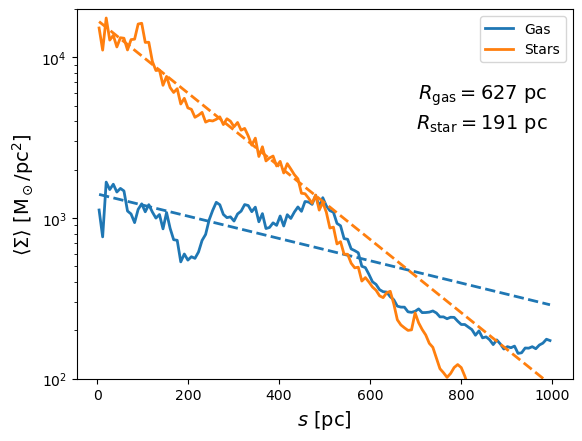

In [9]:
num = 256
dx = 2 * const.kpc / (num - 1)
dA = dx**2

xp, yp = np.meshgrid(np.linspace(-1, 1, num) * const.kpc, np.linspace(-1, 1, num) * const.kpc)
sp = np.sqrt(xp**2 + yp**2)

Sigma_gas_1d, sp_1d = np.histogram(sp, range=(0, 1*const.kpc), weights=(im_gas_face * dA), bins=128)
Sigma_star_1d, _ = np.histogram(sp, range=(0, 1*const.kpc), weights=(im_star_face * dA), bins=128)
dsp_1d = np.diff(sp_1d)
sp_1d = (sp_1d[1:] + sp_1d[:-1]) / 2
Sigma_gas_1d /= 2 * np.pi * sp_1d * dsp_1d
Sigma_star_1d /= 2 * np.pi * sp_1d * dsp_1d

exp = lambda x, a, b: a * np.exp(-x / b)
popt_gas, _ = curve_fit(exp, sp_1d, Sigma_gas_1d, p0=[Sigma_gas_1d[0], sp_1d[-1]])
popt_star, _ = curve_fit(exp, sp_1d, Sigma_star_1d, p0=[Sigma_star_1d[0], sp_1d[-1]])
R_gas = popt_gas[1]
R_star = popt_star[1]

plt.plot(sp_1d / const.pc, Sigma_gas_1d / (const.M_sol / const.pc**2), lw=2, label='Gas')
plt.plot(sp_1d / const.pc, exp(sp_1d, *popt_gas) / (const.M_sol / const.pc**2), lw=2, color='C0', linestyle='--')
plt.plot(sp_1d / const.pc, Sigma_star_1d / (const.M_sol / const.pc**2), lw=2, label='Stars')
plt.plot(sp_1d / const.pc, exp(sp_1d, *popt_star) / (const.M_sol / const.pc**2), lw=2, color='C1', linestyle='--')

plt.xlabel(r'$s$ [${\rm pc}$]', fontsize=14)
plt.ylabel(r'$\langle \Sigma \rangle$ [${\rm M_\odot/pc^2}$]', fontsize=14)

plt.ylim(1e2, 2e4)
plt.yscale('log')

print("R(gas): %.3g pc" % (R_gas / const.pc))
print("R(star): %.3g pc" % (R_star / const.pc))
plt.legend()

plt.annotate(r"$R_{\rm gas} = %.3g~{\rm pc}$" % (R_gas / const.pc), (0.95, 0.8), xycoords="axes fraction", ha='right', va='top', fontsize=14)
plt.annotate(r"$R_{\rm star} = %.3g~{\rm pc}$" % (R_star / const.pc), (0.95, 0.72), xycoords="axes fraction", ha='right', va='top', fontsize=14)

#save_fig('r_exp_fit')


H(gas): 677 pc
H(star): 273 pc


Text(0.95, 0.72, '$H_{\\rm star} = 273~{\\rm pc}$')

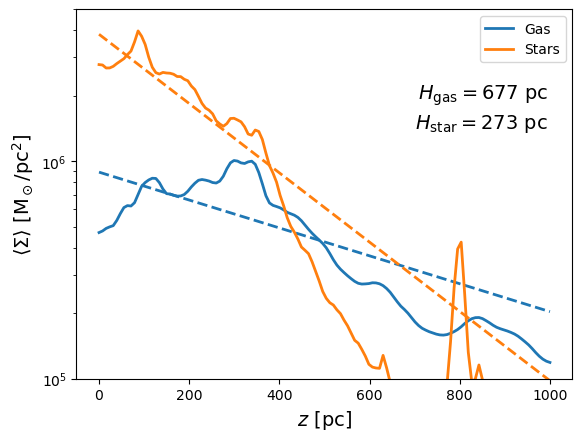

In [10]:
num = 256
dx = 2 * const.kpc / (num - 1)
dA = dx**2

zp_1d = np.linspace(0, 1, num//2) * const.kpc
Sigma_gas_1d = np.sum(im_gas_edge * dA, axis=0) / (2 * const.pc * dx)
Sigma_star_1d = np.sum(im_star_edge * dA, axis=0) / (2 * const.pc * dx)
Sigma_gas_1d = (Sigma_gas_1d[:num//2][::-1] + Sigma_gas_1d[num//2:]) / 2
Sigma_star_1d = (Sigma_star_1d[:num//2][::-1] + Sigma_star_1d[num//2:]) / 2

exp = lambda x, a, b: a * np.exp(-x / b)
popt_gas, _ = curve_fit(exp, zp_1d, Sigma_gas_1d, p0=[Sigma_gas_1d[0], zp_1d[-1]])
popt_star, _ = curve_fit(exp, zp_1d, Sigma_star_1d, p0=[Sigma_star_1d[0], zp_1d[-1]])
H_gas = popt_gas[1]
H_star = popt_star[1]

plt.plot(zp_1d / const.pc, Sigma_gas_1d / (const.M_sol / const.pc**2), lw=2, label='Gas')
plt.plot(zp_1d / const.pc, exp(zp_1d, *popt_gas) / (const.M_sol / const.pc**2), lw=2, color='C0', linestyle='--')
plt.plot(zp_1d / const.pc, Sigma_star_1d / (const.M_sol / const.pc**2), lw=2, label='Stars')
plt.plot(zp_1d / const.pc, exp(zp_1d, *popt_star) / (const.M_sol / const.pc**2), lw=2, color='C1', linestyle='--')

plt.xlabel(r'$z$ [${\rm pc}$]', fontsize=14)
plt.ylabel(r'$\langle \Sigma \rangle$ [${\rm M_\odot/pc^2}$]', fontsize=14)

plt.ylim(1e5, 5e6)
plt.yscale('log')

print("H(gas): %.3g pc" % (H_gas / const.pc))
print("H(star): %.3g pc" % (H_star / const.pc))
plt.legend()

plt.annotate(r"$H_{\rm gas} = %.3g~{\rm pc}$" % (H_gas / const.pc), (0.95, 0.8), xycoords="axes fraction", ha='right', va='top', fontsize=14)
plt.annotate(r"$H_{\rm star} = %.3g~{\rm pc}$" % (H_star / const.pc), (0.95, 0.72), xycoords="axes fraction", ha='right', va='top', fontsize=14)

#save_fig('z_exp_fit')


In [11]:
# compute gas coordinates
density = sim.density_star
coord = sim.coord - coord_center[:, None, None, None]
r = np.sqrt(np.sum(coord**2, axis=0))
cond = (r < 2 * const.kpc)

# moment of inertia tensor
iner = np.zeros((3, 3))

# add gas contributions
iner[X, X] += np.sum(density * coord[X]**2 * cond)
iner[Y, Y] += np.sum(density * coord[Y]**2 * cond)
iner[Z, Z] += np.sum(density * coord[Z]**2 * cond)
iner[X, Y] += np.sum(density * coord[X] * coord[Y] * cond)
iner[X, Z] += np.sum(density * coord[X] * coord[Z] * cond)
iner[Y, Z] += np.sum(density * coord[Y] * coord[Z] * cond)

# enforce symmetry
iner[Y, X] += iner[X, Y]
iner[Z, X] += iner[X, Z]
iner[Z, Y] += iner[Y, Z]

# compute ratios
eigenvalues, eigenvectors = np.linalg.eigh(iner)
ratio1 = np.sqrt(eigenvalues[0] / eigenvalues[2])
ratio2 = np.sqrt(eigenvalues[1] / eigenvalues[2])

print(np.sum(eigenvectors[0] * j_disk))
print("a/c = %.3g" % (ratio1))
print("b/c = %.3g" % (ratio2))


0.3585880119686957
a/c = 0.752
b/c = 0.849


In [2]:
sim_list  = [(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (12, "nofeed")]
npz_list  = ["data_d47_l1_b5.npz", "data_d52_l1_b5.npz", "data_d45_l1_b5.npz", "data_d53_l1_b5.npz", "data_d18_l1_b5.npz"]

num = 512
hist_list = np.empty((5, 5), dtype=object)
bin1_list = np.empty((5, 5), dtype=object)
bin2_list = np.empty((5, 5), dtype=object)

for i in range(5):
    
    sim_round, sim_name = sim_list[i]
    sim = Sim(sim_round, sim_name, npz_list[i])
    sim_dir = move_to_sim_dir(sim_round, sim_name, do_print=False)
    data = SimpleNamespace(**np.load('starcat/data.npz'))
    
    idx_star = np.zeros_like(sim.coord_star, dtype=int)
    for j in [X, Y, Z]: idx_star[j] = np.searchsorted(sim.coord1d[j], sim.coord_star[j])
    idx_star[idx_star==sim.N] = sim.N-1
    nH_star, temp_star = sim.n_H[tuple(idx_star)], sim.temp[tuple(idx_star)]
    
    bin1_list[i, 0], bin2_list[i, 0], hist_list[i, 0] = calc_hist2d(sim.n_H, sim.temp, 1e-3, 3e4, 3e1, 7e8, nbin=num)
    #bin1_list[i, 1], bin2_list[i, 1], hist_list[i, 1] = calc_hist2d(sim.n_H, sim.temp, 1e-3, 3e4, 3e1, 7e8, weight=sim.dV, nbin=num)
    bin1_list[i, 2], bin2_list[i, 2], hist_list[i, 2] = data.nH2d, data.temp2d, data.nH_temp_hist2d
    bin1_list[i, 3], bin2_list[i, 3], hist_list[i, 3] = data.nH2d_death, data.temp2d_death, data.nH_temp_hist2d_death
    #bin1_list[i, 4], bin2_list[i, 4], hist_list[i, 4] = calc_hist2d(nH_star, temp_star, 1e-3, 3e4, 3e1, 7e8, weight=sim.mass_star, nbin=num)
    
#np.savez('/home/za9132/analysis/phaseall_vol', hist_list=hist_list, bin1_list=bin1_list, bin2_list=bin2_list)


Moving to directory '/home/za9132/scratch/romain/round9/mstar0p2'.
Moving to directory '/home/za9132/scratch/romain/round9/fiducial'.
Moving to directory '/home/za9132/scratch/romain/round9/mstar5p0'.
Moving to directory '/home/za9132/scratch/romain/round12/nophot'.
Moving to directory '/home/za9132/scratch/romain/round12/nofeed'.


/tmp/ipykernel_2376850/1706962270.py:26: RuntimeWarning: divide by zero encountered in log10
  im = ax.pcolormesh(bin1_list[i, 0], bin2_list[i, 0], np.log10(hist_list[i, 0]*sim.dV/(const.pc**3)).T, vmin=7, vmax=11, cmap=custom_cmp)


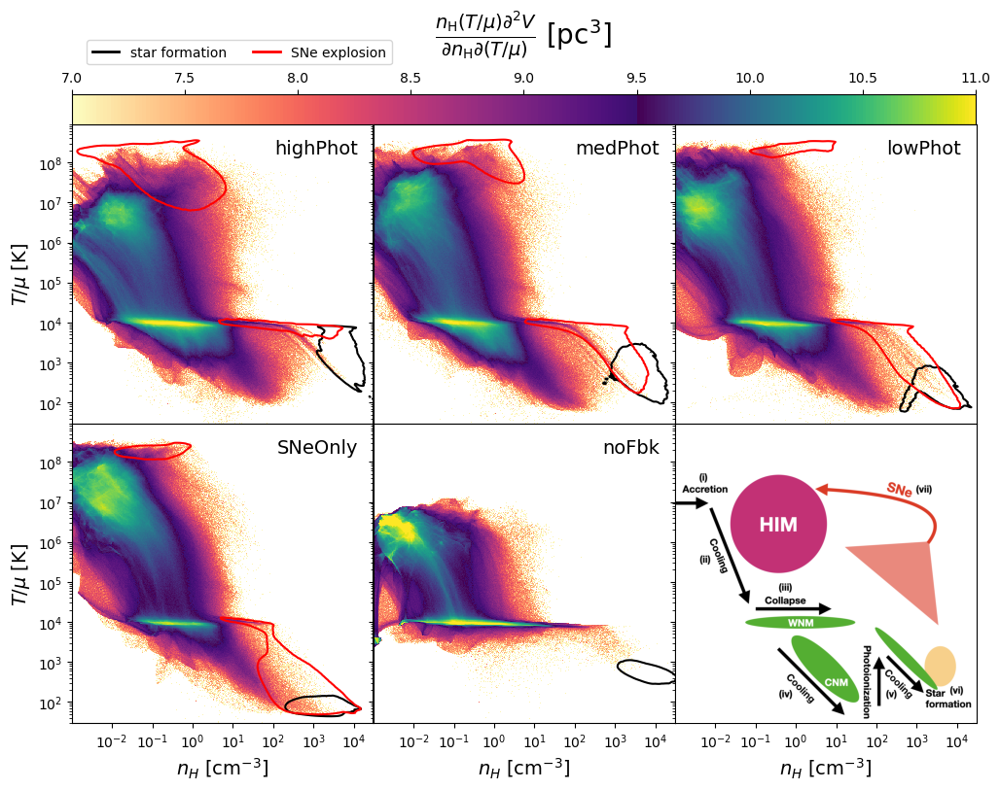

In [3]:
dx = 10 * const.pc

bottom, top = plt.colormaps['magma_r'], plt.colormaps['viridis']
custom_colors = np.vstack((bottom(np.linspace(0, 0.8, 10*16)), top(np.linspace(0, 1, 6*16))))
custom_cmp = ListedColormap(custom_colors, name='custom')

label_list = ['highPhot', 'medPhot', 'lowPhot', 'SNeOnly', 'noFbk']
sne_list = [True, True, True, True, False]

frac = 0.75
sigma_list = [2, 1, 0, 3]
color_list = ['orange', 'black', 'red', 'orange']

E_SNe = 1e51
m_SNe = 10*const.M_sol

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(12, 8), sharex=True, sharey=True)
plt.subplots_adjust(wspace=1e-3, hspace=1e-3)

for i in range(5):
    
    ax = axs.flatten()[i]
    ax.set_xscale('log')
    ax.set_yscale('log')

    im = ax.pcolormesh(bin1_list[i, 0], bin2_list[i, 0], np.log10(hist_list[i, 0]*sim.dV/(const.pc**3)).T, vmin=7, vmax=11, cmap=custom_cmp)

    for j in [1, 2]:
    
        hist_sm = gaussian_filter(hist_list[i, j+1], sigma_list[j])
        field = hist_sm.flatten()
        idx_sorted = np.argsort(field)
        cumsum = np.cumsum(field[idx_sorted])
        level = field[idx_sorted[np.searchsorted(cumsum, (1-frac)*cumsum[-1])]]/const.M_sol
        ax.contour(bin1_list[i, j+1], bin2_list[i, j+1], hist_sm.T/const.M_sol, levels=[level], colors=color_list[j])

    if sne_list[i]:
        rho1d = bin1_list[i, 0]*const.m_p/const.X_cosmo+m_SNe/dx**3
        temp_SNe = const.m_p/const.k_B * (E_SNe/dx**3)/rho1d
        nH_crit = 100*(dx/(3*const.pc))**(0.42)
        
    ax.annotate(label_list[i], xy=(0.95, 0.95), xycoords='axes fraction', horizontalalignment='right', verticalalignment='top', fontsize=14)
        
axs[0, 0].set_xlim(1e-3, 3e4)
axs[0, 0].set_ylim(3e1, 9e8)
axs[0, 0].set_xticks([1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3, 1e4])
for i in range(3): axs[1, i].set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
for j in range(2): axs[j, 0].set_ylabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
    
ax_schem = axs[1, 2].inset_axes([0, 0, 0.99, 0.99])
schem = plt.imread('/home/za9132/analysis/figures/schematic.png')
ax_schem.imshow(schem)
ax_schem.axis('off')
    
cax = axs[0, 0].inset_axes([0, 1, 3, 0.1])
cbar = plt.colorbar(im, cax=cax, orientation='horizontal')
cbar.set_label(r'$\frac{n_{\rm H} (T/\mu) \partial^2 V}{\partial n_{\rm H} \partial (T/\mu)}$ [${\rm pc^3}$]', fontsize=20, labelpad=20)
cax.xaxis.set_ticks_position("top")
cax.xaxis.set_label_position("top")

cust_lines = [Line2D([0], [0], color=color, lw=2, linestyle='-') for color in ['black', 'red']]
axs[0, 0].legend(cust_lines, [r'star formation', r'SNe explosion'], ncol=3, fontsize=10, loc=[0.05, 1.2])
    
#save_fig('phaseall_vol')
    

Text(0.5, 0.92, '$\\Delta x = 10~{\\rm pc}$, solenoidal forcing')

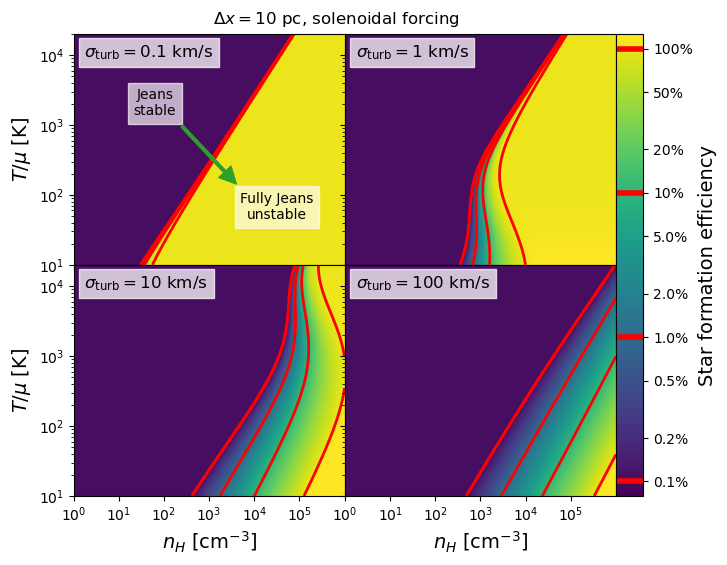

In [2]:
num = 512
dx = 10*const.pc
vel_turb = 100*const.km
b_turb = 0.3

nH_extrema = (1e0, 1e6)
temp_extrema = (1e1, 2e4)

nH_1d = np.logspace(*np.log10(nH_extrema), num)
temp_1d = np.logspace(*np.log10(temp_extrema), num)
nH, temp = np.meshgrid(nH_1d, temp_1d)
rho = nH*const.m_p

fig, axs = plt.subplots(ncols=2, nrows=2, sharex=True, sharey=True, figsize=(7, 6))
plt.subplots_adjust(hspace=1e-3, wspace=1e-3)
axs[0, 0].set_xscale('log')
axs[0, 0].set_yscale('log')

eps_sf_levels = np.array([0.001, 0.002, 0.005, 0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 1])
eps_sf_nodisp = calc_eps_sf2(rho, 1e-5*const.km, temp, dx, b_turb=1.0)

vel_turb_list = np.array([1e-1, 1e0, 1e1, 1e2]) * const.km
for i, vel_turb in enumerate(vel_turb_list):
    ax = axs.flatten()[i]
    eps_sf = calc_eps_sf2(rho, 3/2 * vel_turb**2, temp, dx, b_turb=b_turb)
    eps_sf[eps_sf < 1e-3] = 1e-3
    #ax.contour(nH, temp, eps_sf_nodisp, levels=[1e0], colors='grey', linewidths=2, linestyles='-')
    ax.contour(nH, temp, eps_sf, levels=[1e-3, 1e-2, 1e-1, 1e0], linewidths=2, colors='red')
    im = ax.pcolormesh(nH, temp, np.log10(eps_sf), vmin=-3.1, vmax=0.1, cmap='viridis')
    ax.annotate(r'$\sigma_{\rm turb} = %.3g~{\rm km/s}$'%(vel_turb/const.km), fontsize=12, xy=(0.04, 0.9), xycoords='axes fraction', backgroundcolor=(1, 1, 1, 0.75))

cax = axs[1, 1].inset_axes([1, 0, 0.1, 2])
cbar = plt.colorbar(im, cax=cax, ticks=np.log10(eps_sf_levels))
cbar.set_ticklabels(["0.1%", "0.2%", "0.5%", "1.0%", "2.0%", "5.0%", "10%", "20%", "50%", "100%"])
cbar.set_label(r'Star formation efficiency', fontsize=14)
for i in [-3, -2, -1, 0]: cax.axhline(y=i, color='red', lw=4)

axs[0, 0].set_ylabel(r"$T/\mu$ [${\rm K}$]", fontsize=14)
axs[1, 0].set_ylabel(r"$T/\mu$ [${\rm K}$]", fontsize=14)
axs[1, 0].set_xlabel(r"$n_H$ [${\rm cm^{-3}}$]", fontsize=14)
axs[1, 1].set_xlabel(r"$n_H$ [${\rm cm^{-3}}$]", fontsize=14)
axs[1, 0].set_xticks([1e0, 1e1, 1e2, 1e3, 1e4, 1e5])
axs[1, 1].set_xticks([1e0, 1e1, 1e2, 1e3, 1e4, 1e5])

epssf_lines = [Line2D([0], [0], color='C0', lw=2), Line2D([0], [0], color='C1', lw=2), Line2D([0], [0], color='C2', lw=2), Line2D([0], [0], color='C3', lw=2)]
bturb_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]
sigma_lines = [Line2D([0], [0], color='grey', lw=2, linestyle='-')]

pos1 = (0.3, 0.7)
pos2 = (0.75, 0.25)
axs[0, 0].annotate("Jeans\nstable", xy=pos1, xycoords='axes fraction', color='black', backgroundcolor=(1, 1, 1, 2/3), verticalalignment='center', horizontalalignment='center')
axs[0, 0].annotate("Fully Jeans\nunstable", xy=pos2, xycoords='axes fraction', color='black', backgroundcolor=(1, 1, 1, 2/3), verticalalignment='center', horizontalalignment='center')
axs[0, 0].annotate("", xy=(0.6, 0.35), xytext=(0.4, 0.6), xycoords="axes fraction", arrowprops=dict(width=2, color='C2'))

plt.suptitle(r'$\Delta x = 10~{\rm pc}$, solenoidal forcing', y=0.92, fontsize=12)

# save_fig("mff_bturb0p3")


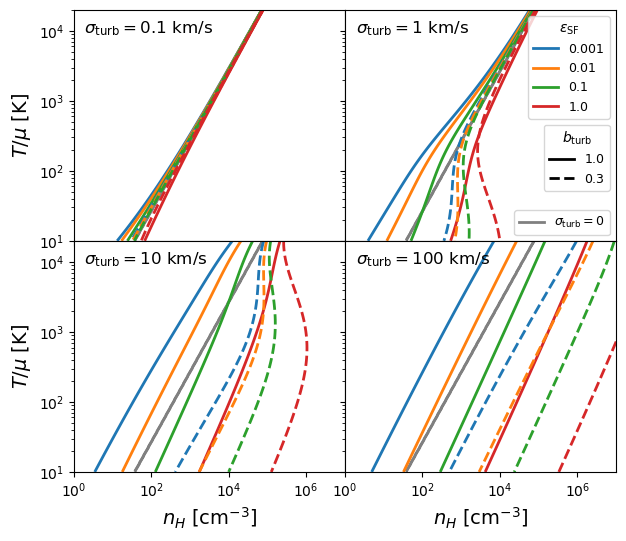

In [2]:
num = 512
dx = 10*const.pc
vel_turb = 100*const.km

nH_extrema = (1e0, 1e7)
temp_extrema = (1e1, 2e4)

nH_1d = np.logspace(*np.log10(nH_extrema), num)
temp_1d = np.logspace(*np.log10(temp_extrema), num)
nH, temp = np.meshgrid(nH_1d, temp_1d)
rho = nH*const.m_p

fig, axs = plt.subplots(ncols=2, nrows=2, sharex=True, sharey=True, figsize=(7, 6))
plt.subplots_adjust(hspace=1e-3, wspace=1e-3)
axs[0, 0].set_xscale('log')
axs[0, 0].set_yscale('log')

eps_sf_nodisp = calc_eps_sf2(rho, 1e-5*const.km, temp, dx, b_turb=1.0)

for i, vel_turb, color in zip(range(4), np.array([1e-1, 1e0, 1e1, 1e2]) * const.km, ['C0', 'C1', 'C2', 'C3']):
    ax = axs.flatten()[i]
    eps_sf_bturb0p3 = calc_eps_sf2(rho, 3/2 * vel_turb**2, temp, dx, b_turb=0.3)
    eps_sf_bturb1p0 = calc_eps_sf2(rho, 3/2 * vel_turb**2, temp, dx, b_turb=1.0)
    ax.contour(nH, temp, eps_sf_nodisp, levels=[1e0], colors='grey', linewidths=2, linestyles='-')
    ax.contour(nH, temp, eps_sf_bturb1p0, levels=[1e-3, 1e-2, 1e-1, 1e0], colors=['C0', 'C1', 'C2', 'C3'], linewidths=2, linestyles='-')
    ax.contour(nH, temp, eps_sf_bturb0p3, levels=[1e-3, 1e-2, 1e-1, 1e0], colors=['C0', 'C1', 'C2', 'C3'], linewidths=2, linestyles='--')
    ax.annotate(r'$\sigma_{\rm turb} = %.3g~{\rm km/s}$'%(vel_turb/const.km), fontsize=12, xy=(0.04, 0.9), xycoords='axes fraction')

axs[0, 0].set_ylabel(r"$T/\mu$ [${\rm K}$]", fontsize=14)
axs[1, 0].set_ylabel(r"$T/\mu$ [${\rm K}$]", fontsize=14)
axs[1, 0].set_xlabel(r"$n_H$ [${\rm cm^{-3}}$]", fontsize=14)
axs[1, 1].set_xlabel(r"$n_H$ [${\rm cm^{-3}}$]", fontsize=14)

epssf_lines = [Line2D([0], [0], color='C0', lw=2), Line2D([0], [0], color='C1', lw=2), Line2D([0], [0], color='C2', lw=2), Line2D([0], [0], color='C3', lw=2)]
bturb_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]
sigma_lines = [Line2D([0], [0], color='grey', lw=2, linestyle='-')]
legend1 = axs[0, 1].legend(epssf_lines, [r'$0.001$', r'$0.01$', r'$0.1$', r'$1.0$'], title=r'$\varepsilon_{\rm SF}$', bbox_to_anchor=[1, 1, 0, 0], fontsize=9)
legend2 = axs[0, 1].legend(bturb_lines, [r'$1.0$', r'$0.3$'], title=r'$b_{\rm turb}$', bbox_to_anchor=[1, 0.53, 0, 0], fontsize=9)
legend3 = axs[0, 1].legend(sigma_lines, [r'$\sigma_{\rm turb} = 0$'], bbox_to_anchor=[1, 0.16, 0, 0], fontsize=9)
axs[0, 1].add_artist(legend1)
axs[0, 1].add_artist(legend2)

# save_fig("mff")


In [ ]:
sim_list_list = [[(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")], [(9, "instantfeedback"), (9, "fastfeedback"), (9, "fiducial")], [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]]
npz_list_list = [["data_d47_l1_b5.npz", "data_d52_l1_b5.npz", "data_d45_l1_b5.npz", "data_d53_l1_b5.npz", "data_d51_l1_b5.npz", "data_d51_l1_b5.npz", "data_d49_l1_b5.npz"], ["data_d48_l1_b5.npz", "data_d52_l1_b5.npz", "data_d52_l1_b5.npz"], ["data_d45_l1_b5.npz", "data_d47_l1_b5.npz", "data_d52_l1_b5.npz"]]
bound_list = [(1e-4, 1e2), (1e3, 1e9), (1e0*const.km, 1e3*const.km), (1e-2*const.Z_sol, 1e1*const.Z_sol), (1/3, 1.0)]
do_log_list = [True, True, True, True, False]

nvar = 5
num = 64

bin_list = [[np.zeros((nvar, num)), np.zeros((nvar, num)), np.zeros((nvar, num)), np.zeros((nvar, num)), np.zeros((nvar, num)), np.zeros((nvar, num)), np.zeros((nvar, num))], [np.zeros((nvar, num)), np.zeros((nvar, num)), np.zeros((nvar, num))], [np.zeros((nvar, num)), np.zeros((nvar, num)), np.zeros((nvar, num))]]
hist_list = [[np.zeros((nvar, num)), np.zeros((nvar, num)), np.zeros((nvar, num)), np.zeros((nvar, num)), np.zeros((nvar, num)), np.zeros((nvar, num)), np.zeros((nvar, num))], [np.zeros((nvar, num)), np.zeros((nvar, num)), np.zeros((nvar, num))], [np.zeros((nvar, num)), np.zeros((nvar, num)), np.zeros((nvar, num))]]

for i in range(3):
    
    sim_list, npz_list = sim_list_list[i], npz_list_list[i]
    nsim = len(sim_list)
    
    for j in range(nsim):
        
        sim_round, sim_name = sim_list[j]
        sim = Sim(sim_round, sim_name, npz_list[j])
        var_list = [sim.n_H, sim.temp, sim.vel_turb, sim.metallicity, sim.b_turb]
        for k in range(nvar):
            bin_list[i][j][k], hist_list[i][j][k] = calc_hist1d(var_list[k], bound_list[k][0], bound_list[k][1], nbin=num, do_pdf=True)

np.savez('/home/za9132/analysis/gasvol_pdf1d', bin_list=bin_list, hist_list=hist_list)


In [2]:
data = np.load('/home/za9132/analysis/gasvol_pdf1d.npz', allow_pickle=True)
bin_list = data['bin_list']
hist_list = data['hist_list']


Moving to directory '/home/za9132/scratch/romain/round9/bturbfunc'.
Saved figure as 'mgasvolhist-091220240954.png'


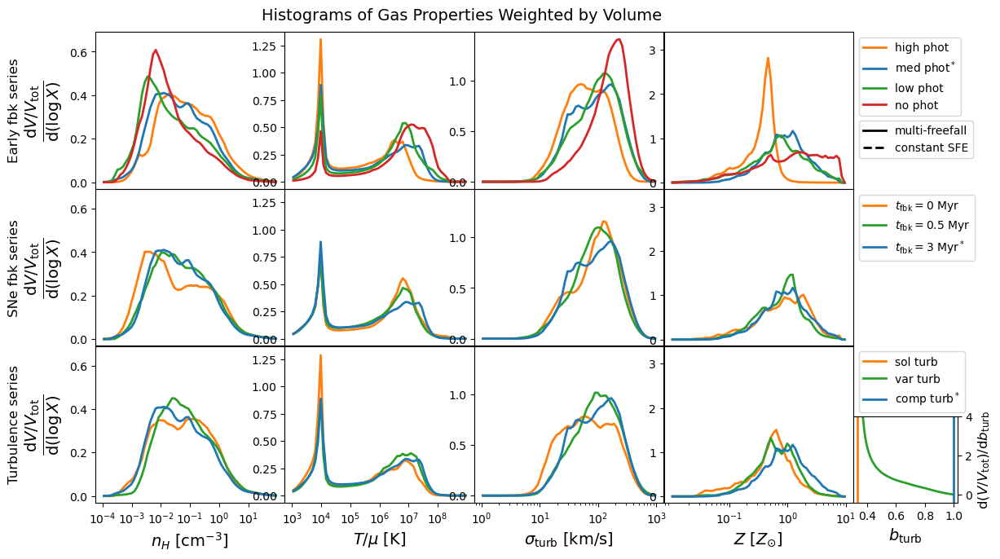

In [4]:
fig, axs = plt.subplots(figsize=(12, 7.5), nrows=3, ncols=4, sharex='col', sharey='col')
plt.subplots_adjust(wspace=1e-3, hspace=1e-3)

sim_list_list = [[(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot")], [(9, "instantfeedback"), (9, "fastfeedback"), (9, "fiducial")], [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]]
label_list_list = [[r"high phot", r"med phot$^*$", r"low phot", "no phot"], [r"$t_{\rm fbk} = 0~{\rm Myr}$", r"$t_{\rm fbk} = 0.5~{\rm Myr}$", r"$t_{\rm fbk} = 3~{\rm Myr}^*$"], [r"sol turb", r"var turb", r"comp turb$^*$"]]
color_list_list = [["C1", "C0", "C2", "C3"], ["C1", "C2", "C0"], ["C1", "C2", "C0"]]
linestyle_list_list = [["-"]*4, ["-"]*3, ["-"]*3]
unit_list = [1, 1, const.km, const.Z_sol]

for i in range(3):
    
    sim_list, label_list, color_list, linestyle_list = sim_list_list[i], label_list_list[i], color_list_list[i], linestyle_list_list[i]
    
    for j in range(4):
        
        ax = axs[i, j]
        ax.set_xscale('log')
        if j==0: ax.set_ylabel(r'$\frac{{\rm d} V/V_{\rm tot}}{{\rm d}(\log X)}$', fontsize=20)
        #ax.set_yticks([0]) if j==0 else ax.set_yticks([])
        
    for j in range(len(label_list)):
        
        for k in range(4):
            
            axs[i, k].plot(bin_list[i][j][k]/unit_list[k], hist_list[i][j][k], color=color_list[j], linestyle=linestyle_list[j], lw=2)

axs[2, 0].set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
axs[2, 1].set_xlabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
axs[2, 2].set_xlabel(r'$\sigma_{\rm turb}$ [${\rm km/s}$]', fontsize=14)
axs[2, 3].set_xlabel(r'$Z$ [$Z_{\odot}$]', fontsize=14)
        
axs[0, 0].set_ylim(None, 0.69);
axs[0, 3].set_ylim(None, 3.4);
axs[2, 0].set_xticks([1e-4, 1e-3, 1e-2, 1e-1, 1e0, 1e1]);
axs[2, 1].set_xticks([1e3, 1e4, 1e5, 1e6, 1e7, 1e8]);
axs[2, 2].set_xticks([1e0, 1e1, 1e2, 1e3]);
axs[2, 3].set_xticks([1e-1, 1e0, 1e1]);

axs[0, 0].annotate('Early fbk series', (-0.46, 0.5), xycoords='axes fraction', fontsize=12, rotation=90, verticalalignment='center')
axs[1, 0].annotate('SNe fbk series', (-0.46, 0.5), xycoords='axes fraction', fontsize=12, rotation=90, verticalalignment='center')
axs[2, 0].annotate('Turbulence series', (-0.46, 0.5), xycoords='axes fraction', fontsize=12, rotation=90, verticalalignment='center')

for i in range(3):
    cust_lines = [Line2D([0], [0], color=color, lw=2) for color in color_list_list[i]][:4]
    axs[i, 3].legend(cust_lines, label_list_list[i], fontsize=10, loc=2, bbox_to_anchor=(1, 1))
cust_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]
axs[0, 2].legend(cust_lines, ['multi-freefall', 'constant SFE'], fontsize=10, loc=2, bbox_to_anchor=(2, 0.47))

sim_dir = move_to_sim_dir(9, "bturbfunc")
data = SimpleNamespace(**np.load('starcat/data.npz'))
axin = axs[2, 3].inset_axes([1., 0., 0.55, 0.55], xticks=[0.4, 0.6, 0.8, 1.0])
axin.plot(bin_list[1][1][4], hist_list[1][1][4], lw=2, color='C2')
axin.axvline(x=1., color='C0', lw=2)
axin.axvline(x=1/3, color='C1', lw=2)
axin.set_xlabel(r"$b_{\rm turb}$", fontsize=14)
axin.yaxis.tick_right()
axin.yaxis.set_label_position('right')
axin.set_ylabel(r'${\rm d}(V/V_{\rm tot})/{\rm d}b_{\rm turb}$', fontsize=12)
axin.set_ylim(-0.4, 4)

plt.suptitle('Histograms of Gas Properties Weighted by Volume', fontsize=14, y=0.92)

save_fig('mgasvolhist')


In [10]:
# sim_list = [(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot")]
# npz_list = ["data_d47_l1_b5.npz", "data_d52_l1_b5.npz", "data_d45_l1_b5.npz", "data_d53_l1_b5.npz"]

sim_list = [(9, "bturbfunc"), (9, "fiducial")]
npz_list = ["data_d47_l1_b5.npz", "data_d52_l1_b5.npz"]

num = 128
scale_list = [np.zeros(num), np.zeros(num), np.zeros(num), np.zeros(num)]
psdgas_list = [np.zeros(num), np.zeros(num), np.zeros(num), np.zeros(num)]
psdstar_list = [np.zeros(num), np.zeros(num), np.zeros(num), np.zeros(num)]
mgas_list = np.zeros(4)
mstar_list = np.zeros(4)
    
for i in range(2):

    sim_round, sim_name = sim_list[i]
    sim = Sim(sim_round, sim_name, npz_list[i])
    
    # compute wavenumber array
    freq = fftshift(fftfreq(int(sim.N), d=sim.dx))
    kx = freq.reshape(sim.N, 1, 1)
    ky = freq.reshape(1, sim.N, 1)
    kz = freq.reshape(1, 1, sim.N)
    k = np.sqrt(kx**2 + ky**2 + kz**2)

    # compute window function
    blackman3d = blackman(sim.N)[:, None, None] * blackman(sim.N)[None, :, None] * blackman(sim.N)[None, None, :]
    blackman3d /= np.sum(blackman3d)

    # compute the PSD
    psd_gas = fftshift(np.abs(fftn(sim.density * blackman3d))**2)
    psd_star = fftshift(np.abs(fftn(sim.density_star * blackman3d))**2)
    scale_list[i], psdgas_list[i]  = calc_hist1d(1/k, weight=psd_gas, vmin=(10*const.pc), vmax=(3000*const.pc), nbin=128, do_pdf=False)
    _            , psdstar_list[i] = calc_hist1d(1/k, weight=psd_star, vmin=(10*const.pc), vmax=(3000*const.pc), nbin=128, do_pdf=False)
    mgas_list[i] = np.sum(sim.density*sim.dx**2)
    mstar_list[i] = np.sum(sim.mass_star)


Moving to directory '/home/za9132/scratch/romain/round9/bturbfunc'.


/tmp/ipykernel_443642/2600803114.py:33: RuntimeWarning: divide by zero encountered in divide
  scale_list[i], psdgas_list[i]  = calc_hist1d(1/k, weight=psd_gas, vmin=(10*const.pc), vmax=(3000*const.pc), nbin=128, do_pdf=False)
/tmp/ipykernel_443642/2600803114.py:34: RuntimeWarning: divide by zero encountered in divide
  _            , psdstar_list[i] = calc_hist1d(1/k, weight=psd_star, vmin=(10*const.pc), vmax=(3000*const.pc), nbin=128, do_pdf=False)


Moving to directory '/home/za9132/scratch/romain/round9/fiducial'.


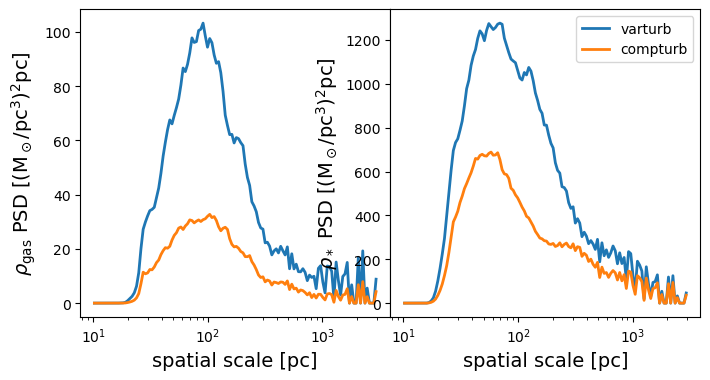

In [11]:
fig, axs = plt.subplots(ncols=2, figsize=(8, 4))
plt.subplots_adjust(hspace=1e-3, wspace=1e-3)

# label_list = ['high phot', 'med phot', 'low phot', 'no phot']
label_list = ['varturb', 'compturb']

for i in range(2):
    axs[0].plot(scale_list[i]/const.pc, psdgas_list[i]/(const.M_sol/const.pc**3)**2, lw=2, label=label_list[i])
    axs[1].plot(scale_list[i]/const.pc, psdstar_list[i]/(const.M_sol/const.pc**3)**2, lw=2, label=label_list[i])
    
for i in range(2):
    axs[i].set_xscale('log')
    axs[i].set_xlabel('spatial scale [pc]', fontsize=14)
axs[0].set_ylabel(r'$\rho_{\rm gas}$ PSD [${\rm (M_\odot/pc^3)^2 pc}$]', fontsize=14)
axs[1].set_ylabel(r'$\rho_*$ PSD [${\rm (M_\odot/pc^3)^2 pc}$]', fontsize=14)
axs[1].legend()


In [3]:
sim = Sim(9, "fiducial", "data_d52_l1_b5.npz")
sim_dir = move_to_sim_dir(9, 'fiducial')
data = SimpleNamespace(**np.load('starcat/data.npz'))


Moving to directory '/home/za9132/scratch/romain/round9/fiducial'.
Moving to directory '/home/za9132/scratch/romain/round9/fiducial'.


/tmp/ipykernel_443642/3944351970.py:28: RuntimeWarning: divide by zero encountered in log10
  im = ax1.pcolormesh(bin1, bin2, np.log10(hist/const.M_sol).T, vmin=5.5, vmax=9.5, cmap=custom_cmp)


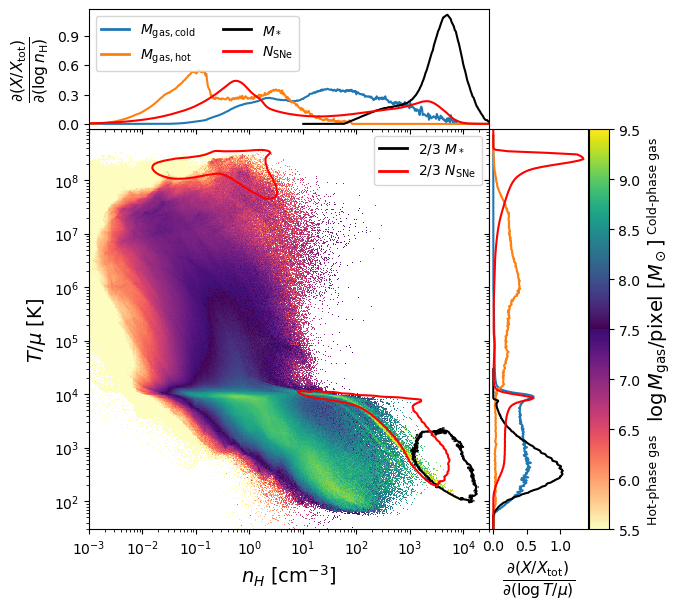

In [4]:
bottom = plt.colormaps['magma_r']
top = plt.colormaps['viridis']
custom_colors = np.vstack((bottom(np.linspace(0, 0.8, 128)), top(np.linspace(0, 1, 128))))
custom_cmp = ListedColormap(custom_colors, name='custom')

fig = plt.figure(figsize=(4, 4))
ax1 = fig.add_axes([0, 0, 1, 1])
ax2 = fig.add_axes([0, 1, 1, 0.3], sharex=ax1)
ax3 = fig.add_axes([1, 0, 0.3, 1], sharey=ax1)

plt.setp(ax2.get_xticklabels(), visible=False)
plt.setp(ax3.get_yticklabels(), visible=False)
ax2.set_yticks([0, 0.3, 0.6, 0.9])
ax3.set_xticks([0, 0.5, 1.0])

ax1.set_xscale('log')
ax1.set_yscale('log')

num = 512
bin1, bin2, hist = calc_hist2d(sim.n_H, sim.temp, 1e-3, 3e4, 3e1, 7e8, weight=sim.density*sim.dV, nbin=num)
bin_width1, bin_width2 = np.log10(bin1[1]/bin1[0]), np.log10(bin2[1]/bin2[0])
cond = hist>(10**7.5*const.M_sol)
pdf1_top = np.sum(hist*cond, axis=1)/np.sum(hist*cond)/bin_width2
pdf2_top = np.sum(hist*cond, axis=0)/np.sum(hist*cond)/bin_width1
pdf1_bottom = np.sum(hist*(1-cond), axis=1)/np.sum(hist*(1-cond))/bin_width2
pdf2_bottom = np.sum(hist*(1-cond), axis=0)/np.sum(hist*(1-cond))/bin_width1

im = ax1.pcolormesh(bin1, bin2, np.log10(hist/const.M_sol).T, vmin=5.5, vmax=9.5, cmap=custom_cmp)
cbar = add_cbar_to_ax(im, ax=ax3, size='20%', pad=0.01)
cbar.set_label(r'$\log M_{\rm gas} / {\rm pixel}$ [$M_\odot$]', fontsize=14)
ax3.annotate('Cold-phase gas', xy=(1.6, 0.98), rotation=90, xycoords='axes fraction', fontsize=9, verticalalignment='top')
ax3.annotate('Hot-phase gas', xy=(1.6, 0.02), rotation=90, xycoords='axes fraction', fontsize=9)

field = data.nH_temp_hist2d.flatten()
idx_sorted = np.argsort(field)
cumsum = np.cumsum(field[idx_sorted])
mass_halfstar = field[idx_sorted[np.searchsorted(cumsum, 1/3*cumsum[-1])]]/const.M_sol
ax1.contour(data.nH2d, data.temp2d, data.nH_temp_hist2d.T/const.M_sol, levels=[mass_halfstar], colors='black')

field = data.nH_temp_hist2d_death.flatten()
idx_sorted = np.argsort(field)
cumsum = np.cumsum(field[idx_sorted])
mass_halfstar = field[idx_sorted[np.searchsorted(cumsum, 1/3*cumsum[-1])]]/const.M_sol
ax1.contour(data.nH2d_death, data.temp2d_death, data.nH_temp_hist2d_death.T/const.M_sol, levels=[mass_halfstar], colors='red')

ax2.plot(bin1, pdf1_top, color='C0')
ax2.plot(bin1, pdf1_bottom, color='C1')
ax2.plot(data.nH1d, data.nH_pdf1d, color='black')
ax2.plot(data.nH1d_death, data.nH_pdf1d_death, color='red')

ax3.plot(pdf2_top, bin2, color='C0')
ax3.plot(pdf2_bottom, bin2, color='C1')
ax3.plot(data.temp_pdf1d, data.temp1d, color='black')
ax3.plot(data.temp_pdf1d_death, data.temp1d_death, color='red')

ax1.set_xlim(1e-3, 3e4)
ax1.set_ylim(3e1, 9e8)
ax1.set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
ax1.set_ylabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
ax2.set_ylabel(r'$\frac{\partial (X/X_{\rm tot})}{\partial (\log n_{\rm H})}$', fontsize=16)
ax3.set_xlabel(r'$\frac{\partial (X/X_{\rm tot})}{\partial (\log T/\mu)}$', fontsize=16)

cust_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='red', lw=2, linestyle='-')]
ax1.legend(cust_lines, [r'2/3 $M_*$', r'2/3 $N_{\rm SNe}$'], fontsize=10, loc=1)

cust_lines = [Line2D([0], [0], color='C0', lw=2, linestyle='-'), Line2D([0], [0], color='C1', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='red', lw=2, linestyle='-')]
ax2.legend(cust_lines, [r'$M_{\rm gas, cold}$', r'$M_{\rm gas, hot}$', r'$M_*$', r'$N_{\rm SNe}$'], fontsize=10, loc=2, ncol=2)

#save_fig('phase_lowphotconst')


In [3]:
dt = 0.1*const.Myr
nstep = 5583
eta = 0.2
data = np.load('/home/za9132/analysis/SFR.npz', allow_pickle=True)
time = data['time']
SFR_list = data['SFR_list']
Mstar_list = data['Mstar_list']


/tmp/ipykernel_3282546/2966504800.py:44: RuntimeWarning: divide by zero encountered in log10
  log_SFR = np.log10(SFR)
/tmp/ipykernel_3282546/2966504800.py:46: RuntimeWarning: divide by zero encountered in divide
  axs[2, j].plot(1/freq/const.Myr, psd/const.Myr, lw=2, color=color_list[i], linestyle=linestyle_list[i])


Text(0.5, 1.0, 'Turbulence series')

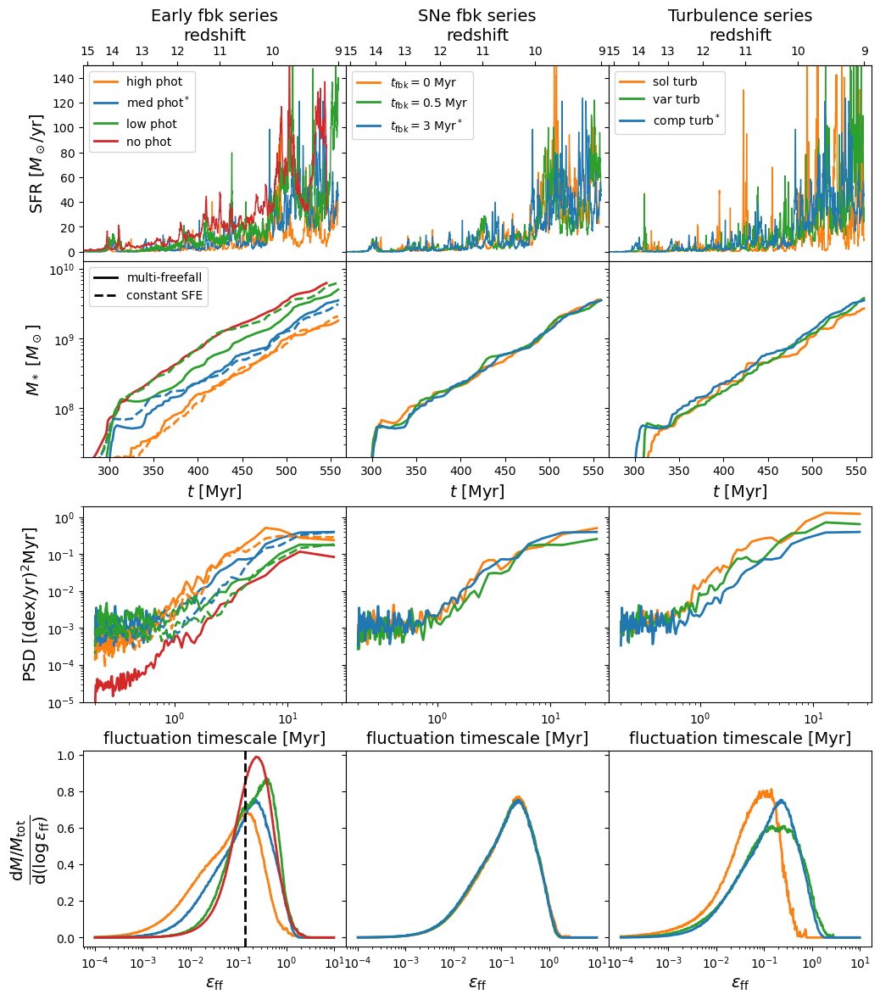

In [4]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(12, 6), sharey='row')
plt.subplots_adjust(hspace=1e-3, wspace=1e-3)

axs_new = np.zeros((4, 3), dtype=plt.Axes)
axs_new[:2, :] = axs
axs = axs_new

for i in range(3):
    axs[2, i] = axs[1, i].inset_axes([0, -1.25, 1, 1])
    axs[3, i] = axs[1, i].inset_axes([0, -2.5, 1, 1])

z_min = 15.2
z_max = 8.9
tick_z = [15, 14, 13, 12, 11, 10, 9]

aexp_list = np.linspace(1e-3, 1., 2**10)
time_list = np.array([aexp_to_proper_time(aexp_list[i]) for i in range(len(aexp_list))])
proper_time_to_z_interp = interp1d(time_list/const.Myr, 1/aexp_list-1, fill_value='extrapolate')
z_to_proper_time_interp = interp1d(1/aexp_list-1, time_list/const.Myr, fill_value='extrapolate')

sim_list_list = [[(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")], [(9, "instantfeedback"), (9, "fastfeedback"), (9, "fiducial")], [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]]
label_list_list = [[r"high phot", r"med phot$^*$", r"low phot", "no phot", None, None, None], [r"$t_{\rm fbk} = 0~{\rm Myr}$", r"$t_{\rm fbk} = 0.5~{\rm Myr}$", r"$t_{\rm fbk} = 3~{\rm Myr}^*$"], [r"sol turb", r"var turb", r"comp turb$^*$"]]
color_list_list = [["C1", "C0", "C2", "C3", "C1", "C0", "C2"], ["C1", "C2", "C0"], ["C1", "C2", "C0"]]
linestyle_list_list = [["-"]*4+["--"]*3, ["-"]*3, ["-"]*3]
is_mff_list_list = [[True]*4+[False]*3, [True]*3, [True]*3]

for j in range(3):
    
    sim_list, label_list, color_list, linestyle_list, is_mff_list = sim_list_list[j], label_list_list[j], color_list_list[j], linestyle_list_list[j], is_mff_list_list[j]
    
    for i in range(len(label_list)):
        
        sim_round, sim_name = sim_list[i]
        move_to_sim_dir(sim_round, sim_name, do_print=False)
        data = SimpleNamespace(**np.load('starcat/data.npz'))

        SFR, Mstar = SFR_list[j][i], Mstar_list[j][i]
        cond = (SFR > 0)
        if is_mff_list[i]: axs[0, j].plot(time[cond]/const.Myr, SFR[cond]/(const.M_sol/const.yr), lw=1., label=label_list[i], color=color_list[i], linestyle=linestyle_list[i])
        axs[1, j].plot(time[cond]/const.Myr, Mstar[cond]/const.M_sol, lw=2., color=color_list[i], linestyle=linestyle_list[i])
        if is_mff_list[i]: axs[3, j].plot(data.eps_sf1d, data.eps_sf_pdf1d, lw=2, color=color_list[i])
            
        cond_psd = (time>300*const.Myr) * (SFR>0)
        log_SFR = np.log10(SFR)
        freq, psd = welch(log_SFR[cond_psd], 1/dt, detrend='linear')
        axs[2, j].plot(1/freq/const.Myr, psd/const.Myr, lw=2, color=color_list[i], linestyle=linestyle_list[i])
        
for i in range(3):
    
    axtop = axs[0, i].secondary_xaxis('top', functions=(proper_time_to_z_interp, z_to_proper_time_interp))
    axtop.set_xticks(tick_z)
    axtop.set_xlabel(r'redshift', fontsize=14)
    
    axs[1, i].set_xlabel(r"$t$ [Myr]", fontsize=14)
    axs[1, i].set_yscale('log')
    axs[3, i].set_xscale('log')
    axs[3, i].set_xlabel(r"$\epsilon_{\rm ff}$", fontsize=14)
    axs[3, i].set_ylim(-0.05, 1.02)
    if i>0: axs[3, i].set_yticklabels([])
    
    axs[2, i].set_xlabel(r'fluctuation timescale [Myr]', fontsize=14)
    axs[2, i].set_xscale('log')
    axs[2, i].set_yscale('log')
    axs[2, i].set_ylim(1e-5, 2e0)
    if i>0: axs[2, i].set_yticklabels([])
    
    axs[0, i].set_xlim(z_to_proper_time_interp(z_min), z_to_proper_time_interp(z_max))
    axs[0, i].set_ylim(-7.5, 150)
    axs[1, i].set_xlim(z_to_proper_time_interp(z_min), z_to_proper_time_interp(z_max))
    axs[1, i].set_ylim(2e7)
    
axs[0, 0].set_ylabel(r"SFR [$M_\odot / {\rm yr}$]", fontsize=14)
axs[1, 0].set_ylabel(r"$M_*$ [$M_\odot$]", fontsize=14)
axs[2, 0].set_ylabel(r'PSD [${\rm (dex/yr)^2 Myr}$]', fontsize=14)
axs[3, 0].set_ylabel(r'$\frac{{\rm d} M/M_{\rm tot}}{{\rm d}(\log \epsilon_{\rm ff})}$', fontsize=20)
axs[3, 0].axvline(x=0.1371535430985907, color='black', linestyle='--', lw=2)

cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C0", "C2", "C3"]]
axs[0, 0].legend(cust_lines, label_list_list[0], fontsize=10)
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[0, 1].legend(cust_lines, label_list_list[1], fontsize=10)
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[0, 2].legend(cust_lines, label_list_list[2], fontsize=10)
cust_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]
axs[1, 0].legend(cust_lines, ['multi-freefall', 'constant SFE'])

axs[0, 0].set_title('Early fbk series', fontsize=14)
axs[0, 1].set_title('SNe fbk series', fontsize=14)
axs[0, 2].set_title('Turbulence series', fontsize=14)

#save_fig("SFR")


Text(0, 0.5, '$\\rho_{\\rm SFR}$ [${\\rm M_\\odot/yr/Mpc^3}$]')

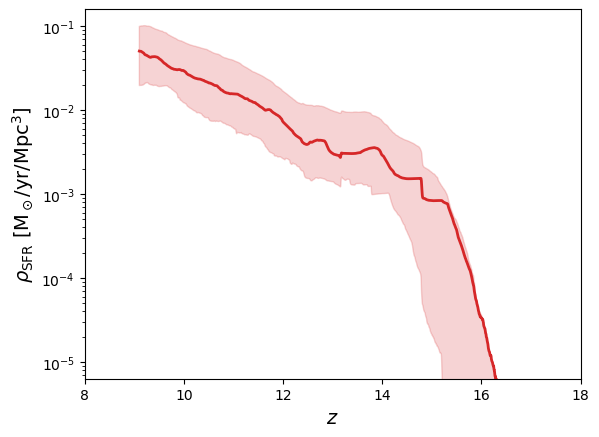

In [282]:
sim_list = [(9, "fiducial"), (9, "mstar0p2"), (9, "mstar5p0"), (9, "bturbfunc"), (9, "bturb0p3")]

dt = 0.1*const.Myr
sigma_idx = int(50*const.Myr/dt)
window = np.zeros(2*sigma_idx-1)
window[sigma_idx:] = 1/sigma_idx

SFR_list = []
for sim_round, sim_name in sim_list:
    move_to_sim_dir(sim_round, sim_name, do_print=False)
    data = SimpleNamespace(**np.load('starcat/data.npz'))
    SFR_sm = np.convolve(data.starmass_hist1d, window, mode='same')
    SFR_list.append(SFR_sm)

SFR_fid = SFR_list[0]
SFR_min = np.minimum.reduce(SFR_list)
SFR_max = np.maximum.reduce(SFR_list)

aexp_list = np.linspace(1e-3, 1., 2**10)
time_list = np.array([aexp_to_proper_time(aexp_list[i]) for i in range(len(aexp_list))])
proper_time_to_aexp_interp = interp1d(time_list, aexp_list, fill_value='extrapolate')

aexp = proper_time_to_aexp_interp(data.time1d)
redshift = 1/aexp-1

boxsize = aexp*100*const.Mpc/const.h0
rho_SFR_fid = SFR_fid/boxsize**3
rho_SFR_min = SFR_min/boxsize**3
rho_SFR_max = SFR_max/boxsize**3

plt.plot(redshift, rho_SFR_fid/(const.M_sol/const.yr/const.Mpc**3), color='C3', lw=2)
plt.fill_between(redshift, rho_SFR_min/(const.M_sol/const.yr/const.Mpc**3), rho_SFR_max/(const.M_sol/const.yr/const.Mpc**3), color='C3', alpha=0.2)

plt.yscale('log')
plt.xlim(8, 18)
plt.ylim(10**(-5.2), 10**(-0.8))

plt.xlabel(r'$z$', fontsize=14)
plt.ylabel(r'$\rho_{\rm SFR}$ [${\rm M_\odot/yr/Mpc^3}$]', fontsize=14)

    

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 3), sharey='row')
plt.subplots_adjust(hspace=1e-3, wspace=1e-3)

axs_new = np.zeros((2, 3), dtype=plt.Axes)
axs_new[:1, :] = axs
axs = axs_new

for i in range(3):
    axs[1, i] = axs[0, i].inset_axes([0, -1.25, 1, 1])

z_min = 15.2
z_max = 8.9
tick_z = [15, 14, 13, 12, 11, 10, 9]

aexp_list = np.linspace(1e-3, 1., 2**10)
time_list = np.array([aexp_to_proper_time(aexp_list[i]) for i in range(len(aexp_list))])
proper_time_to_z_interp = interp1d(time_list/const.Myr, 1/aexp_list-1, fill_value='extrapolate')
z_to_proper_time_interp = interp1d(1/aexp_list-1, time_list/const.Myr, fill_value='extrapolate')

sim_list_list = [[(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")], [(9, "instantfeedback"), (9, "fastfeedback"), (9, "fiducial")], [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]]
label_list_list = [[r"high phot", r"med phot$^*$", r"low phot", "no phot", None, None, None], [r"$t_{\rm fbk} = 0~{\rm Myr}$", r"$t_{\rm fbk} = 0.5~{\rm Myr}$", r"$t_{\rm fbk} = 3~{\rm Myr}^*$"], [r"sol turb", r"var turb", r"comp turb$^*$"]]
color_list_list = [["C1", "C0", "C2", "C3", "C1", "C0", "C2"], ["C1", "C2", "C0"], ["C1", "C2", "C0"]]
linestyle_list_list = [["-"]*4+["--"]*3, ["-"]*3, ["-"]*3]
is_mff_list_list = [[True]*4+[False]*3, [True]*3, [True]*3]

for j in range(3):
    
    sim_list, label_list, color_list, linestyle_list, is_mff_list = sim_list_list[j], label_list_list[j], color_list_list[j], linestyle_list_list[j], is_mff_list_list[j]
    
    for i in range(len(label_list)):
        
        sim_round, sim_name = sim_list[i]
        move_to_sim_dir(sim_round, sim_name, do_print=False)
        data = SimpleNamespace(**np.load('starcat/data.npz'))

        SFR, Mstar = SFR_list[j][i], Mstar_list[j][i]
        cond = (SFR > 0)
        axs[0, j].plot(time[cond]/const.Myr, Mstar[cond]/const.M_sol, lw=2., color=color_list[i], linestyle=linestyle_list[i])
        if is_mff_list[i]: axs[1, j].plot(data.eps_sf1d, data.eps_sf_pdf1d, lw=2, color=color_list[i])

for i in range(3):
    
    axtop = axs[0, i].secondary_xaxis('top', functions=(proper_time_to_z_interp, z_to_proper_time_interp))
    axtop.set_xticks(tick_z)
    axtop.set_xlabel(r'redshift', fontsize=14)
    
    axs[0, i].set_xlabel(r"$t$ [Myr]", fontsize=14)
    axs[0, i].set_yscale('log')
    axs[1, i].set_xscale('log')
    axs[1, i].set_xlabel(r"$\epsilon_{\rm ff}$", fontsize=14)
    axs[1, i].set_ylim(-0.05, 1.02)
    if i>0: axs[1, i].set_yticklabels([])
    
    axs[0, i].set_xlim(z_to_proper_time_interp(z_min), z_to_proper_time_interp(z_max))
    axs[0, i].set_ylim(2e7)
    
axs[0, 0].set_ylabel(r"$M_*$ [$M_\odot$]", fontsize=14)
axs[1, 0].set_ylabel(r'$\frac{{\rm d} M/M_{\rm tot}}{{\rm d}(\log \epsilon_{\rm ff})}$', fontsize=20)
axs[1, 0].axvline(x=0.1371535430985907, color='black', linestyle='--', lw=2)

cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C0", "C2", "C3"]]
axs[0, 0].legend(cust_lines, label_list_list[0], fontsize=10)
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[0, 1].legend(cust_lines, label_list_list[1], fontsize=10)
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[0, 2].legend(cust_lines, label_list_list[2], fontsize=10)
cust_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]
axs[1, 0].legend(cust_lines, ['multi-freefall', 'constant SFE'])

axs[0, 0].set_title('Early fbk series', fontsize=14)
axs[0, 1].set_title('SNe fbk series', fontsize=14)
axs[0, 2].set_title('Turbulence series', fontsize=14)

#save_fig("starmass")


In [ ]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(12, 6), sharey='row')
plt.subplots_adjust(hspace=1e-3, wspace=1e-3)

axs_new = np.zeros((3, 3), dtype=plt.Axes)
axs_new[:2, :] = axs
axs = axs_new

for i in range(3):
    axs[2, i] = axs[1, i].inset_axes([0, -1.25, 1, 1])

z_min = 15.2
z_max = 8.9
tick_z = [15, 14, 13, 12, 11, 10, 9]

aexp_list = np.linspace(1e-3, 1., 2**10)
time_list = np.array([aexp_to_proper_time(aexp_list[i]) for i in range(len(aexp_list))])
proper_time_to_z_interp = interp1d(time_list/const.Myr, 1/aexp_list-1, fill_value='extrapolate')
z_to_proper_time_interp = interp1d(1/aexp_list-1, time_list/const.Myr, fill_value='extrapolate')

sim_list_list = [[(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")], [(9, "instantfeedback"), (9, "fastfeedback"), (9, "fiducial")], [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]]
label_list_list = [[r"high phot", r"med phot$^*$", r"low phot", "no phot"], [r"$t_{\rm fbk} = 0~{\rm Myr}$", r"$t_{\rm fbk} = 0.5~{\rm Myr}$", r"$t_{\rm fbk} = 3~{\rm Myr}^*$"], [r"sol turb", r"var turb", r"comp turb$^*$"]]
color_list_list = [["C1", "C0", "C2", "C3"], ["C1", "C2", "C0"], ["C1", "C2", "C0"]]
linestyle_list_list = [["-"]*4, ["-"]*3, ["-"]*3]

for j in range(3):
    
    sim_list, label_list, color_list, linestyle_list = sim_list_list[j], label_list_list[j], color_list_list[j], linestyle_list_list[j]
    
    for i in range(len(label_list)):
        
        sim_round, sim_name = sim_list[i]
        move_to_sim_dir(sim_round, sim_name, do_print=False)
        data = SimpleNamespace(**np.load('starcat/data.npz'))

        SFR, Mstar = SFR_list[j][i], Mstar_list[j][i]
        cond = (SFR > 0)
        axs[0, j].plot(time[cond]/const.Myr, SFR[cond]/(const.M_sol/const.yr), lw=1., label=label_list[i], color=color_list[i], linestyle=linestyle_list[i])
         
        cond_psd = (time>350*const.Myr) * (SFR>0)
        log_SFR = np.log10(SFR)
        popt, _ = curve_fit(affine, time[cond_psd], log_SFR[cond_psd])
        res = log_SFR - affine(time, *popt)
        axs[1, j].plot(time/const.Myr, res, lw=1, color=color_list[i], linestyle=linestyle_list[i])
        
        freq, psd = welch(log_SFR[cond_psd], 1/dt, detrend='linear')
        axs[2, j].plot(1/freq/const.Myr, psd/const.Myr, lw=2, color=color_list[i], linestyle=linestyle_list[i])
        
for i in range(3):
    
    axtop = axs[0, i].secondary_xaxis('top', functions=(proper_time_to_z_interp, z_to_proper_time_interp))
    axtop.set_xticks(tick_z)
    axtop.set_xlabel(r'redshift', fontsize=14)
    
    axs[1, i].set_xlabel(r"$t$ [Myr]", fontsize=14)
    axs[2, i].set_xlabel(r'fluctuation timescale [Myr]', fontsize=14)
    axs[2, i].set_xscale('log')
    axs[2, i].set_yscale('log')
    axs[2, i].set_ylim(1e-5, 2e0)
    axs[1, i].set_ylim(-1.9, 1.9)
    if i>0: axs[2, i].set_yticklabels([])
    
    axs[0, i].set_xlim(z_to_proper_time_interp(z_min), z_to_proper_time_interp(z_max))
    axs[0, i].set_ylim(-7.5, 150)
    axs[1, i].set_xlim(z_to_proper_time_interp(z_min), z_to_proper_time_interp(z_max))
    
axs[0, 0].set_ylabel(r"SFR [$M_\odot / {\rm yr}$]", fontsize=14)
axs[1, 0].set_ylabel(r"$\log {\rm SFR}$ res [${\rm dex}$]", fontsize=14)
axs[2, 0].set_ylabel(r'PSD [${\rm dex^2 Myr}$]', fontsize=14)

cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C0", "C2", "C3"]]
axs[0, 0].legend(cust_lines, label_list_list[0], fontsize=10)
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[0, 1].legend(cust_lines, label_list_list[1], fontsize=10)
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[0, 2].legend(cust_lines, label_list_list[2], fontsize=10)

axs[0, 0].set_title('Early fbk series', fontsize=14)
axs[0, 1].set_title('SNe fbk series', fontsize=14)
axs[0, 2].set_title('Turbulence series', fontsize=14)

save_fig("variability")


/tmp/ipykernel_2380779/3625320004.py:55: RuntimeWarning: divide by zero encountered in log10
  log_SFR = np.log10(data.SFR)
/tmp/ipykernel_2380779/3625320004.py:57: RuntimeWarning: divide by zero encountered in divide
  axs[2, j].plot(1/freq/const.Myr, psd/const.Myr, lw=2, color=color_list[i], linestyle=linestyle_list[i])


Text(0.5, 1.0, 'Turbulence series')

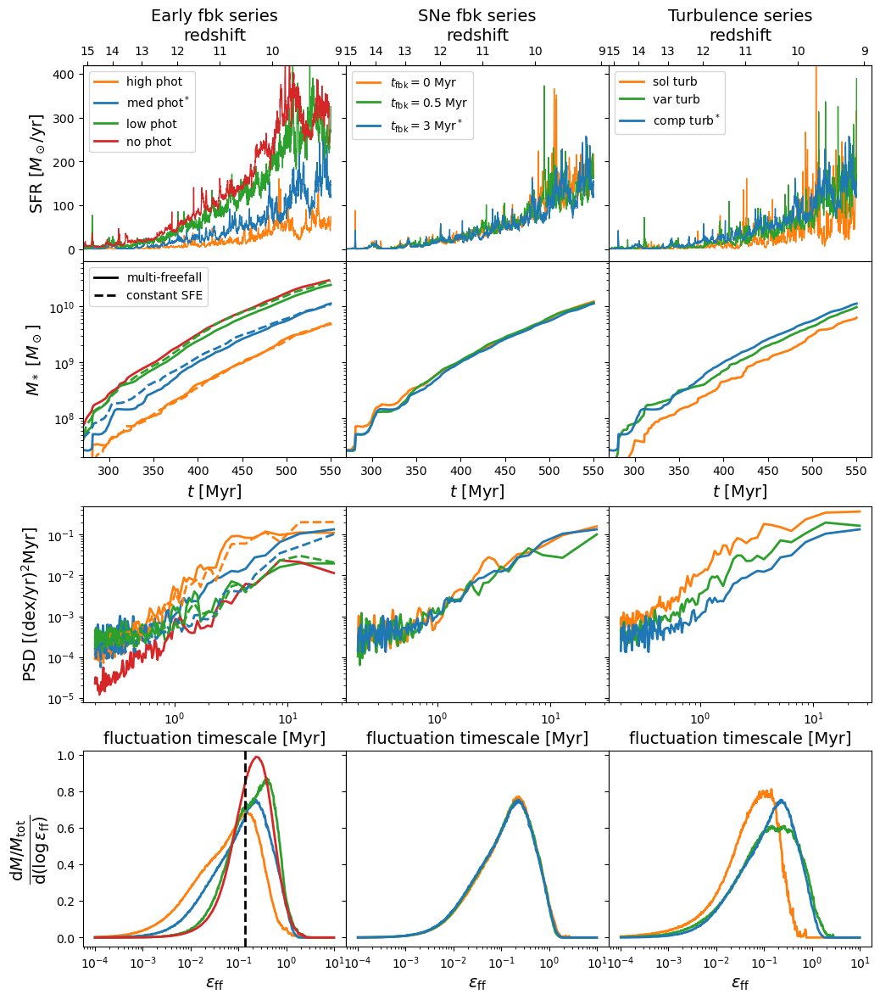

In [247]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(12, 6), sharey='row')
plt.subplots_adjust(hspace=1e-3, wspace=1e-3)

axs_new = np.zeros((4, 3), dtype=plt.Axes)
axs_new[:2, :] = axs
axs = axs_new

for i in range(3):
    axs[2, i] = axs[1, i].inset_axes([0, -1.25, 1, 1])
    axs[3, i] = axs[1, i].inset_axes([0, -2.5, 1, 1])

z_min = 15.2
z_max = 8.9
tick_z = [15, 14, 13, 12, 11, 10, 9]

aexp_list = np.linspace(1e-3, 1., 2**10)
time_list = np.array([aexp_to_proper_time(aexp_list[i]) for i in range(len(aexp_list))])
proper_time_to_z_interp = interp1d(time_list/const.Myr, 1/aexp_list-1, fill_value='extrapolate')
z_to_proper_time_interp = interp1d(1/aexp_list-1, time_list/const.Myr, fill_value='extrapolate')

dt = 0.1*const.Myr
nstep = 5500
eta = 0.2
tstart_idx = int(3*const.Myr/dt)
tend_idx = int(20*const.Myr/dt)
window_Mstar = np.zeros(2*nstep-1)
window_Mstar[nstep:nstep+tstart_idx] = 1
window_Mstar[nstep+tstart_idx:nstep+tend_idx] = np.linspace(1, 1-eta, tend_idx-tstart_idx)
window_Mstar[nstep+tend_idx:] = 1-eta
window_Mstar *= dt

sim_list_list = [[(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")], [(9, "instantfeedback"), (9, "fastfeedback"), (9, "fiducial")], [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]]
label_list_list = [[r"high phot", r"med phot$^*$", r"low phot", "no phot", None, None, None], [r"$t_{\rm fbk} = 0~{\rm Myr}$", r"$t_{\rm fbk} = 0.5~{\rm Myr}$", r"$t_{\rm fbk} = 3~{\rm Myr}^*$"], [r"sol turb", r"var turb", r"comp turb$^*$"]]
color_list_list = [["C1", "C0", "C2", "C3", "C1", "C0", "C2"], ["C1", "C2", "C0"], ["C1", "C2", "C0"]]
linestyle_list_list = [["-"]*4+["--"]*3, ["-"]*3, ["-"]*3]
is_mff_list_list = [[True]*4+[False]*3, [True]*3, [True]*3]

for j in range(3):
    
    sim_list, label_list, color_list, linestyle_list, is_mff_list = sim_list_list[j], label_list_list[j], color_list_list[j], linestyle_list_list[j], is_mff_list_list[j]
    
    for i in range(len(label_list)):
        
        sim_round, sim_name = sim_list[i]
        move_to_sim_dir(sim_round, sim_name, do_print=False)
        data = SimpleNamespace(**np.load('starcat/data.npz'))
        data.SFR = data.starmass_hist1d
        data.starmass = np.convolve(data.starmass_hist1d, window_Mstar, mode='valid')
        cond = (data.SFR > 0)
        if is_mff_list[i]: axs[0, j].plot(data.time1d[cond]/const.Myr, data.SFR[cond]/(const.M_sol/const.yr), lw=1., label=label_list[i], color=color_list[i], linestyle=linestyle_list[i])
        axs[1, j].plot(data.time1d[cond]/const.Myr, data.starmass[cond]/const.M_sol, lw=2., color=color_list[i], linestyle=linestyle_list[i])
        if is_mff_list[i]: axs[3, j].plot(data.eps_sf1d, data.eps_sf_pdf1d, lw=2, color=color_list[i])
            
        cond_psd = (data.time1d > 300*const.Myr) * (data.SFR > 0)
        log_SFR = np.log10(data.SFR)
        freq, psd = welch(log_SFR[cond_psd], 1/(data.time1d[1]-data.time1d[0]), detrend='linear')
        axs[2, j].plot(1/freq/const.Myr, psd/const.Myr, lw=2, color=color_list[i], linestyle=linestyle_list[i])
        
for i in range(3):
    
    axtop = axs[0, i].secondary_xaxis('top', functions=(proper_time_to_z_interp, z_to_proper_time_interp))
    axtop.set_xticks(tick_z)
    axtop.set_xlabel(r'redshift', fontsize=14)
    
    axs[1, i].set_xlabel(r"$t$ [Myr]", fontsize=14)
    axs[1, i].set_yscale('log')
    axs[3, i].set_xscale('log')
    axs[3, i].set_xlabel(r"$\epsilon_{\rm ff}$", fontsize=14)
    axs[3, i].set_ylim(-0.05, 1.02)
    if i>0: axs[3, i].set_yticklabels([])
    
    axs[2, i].set_xlabel(r'fluctuation timescale [Myr]', fontsize=14)
    axs[2, i].set_xscale('log')
    axs[2, i].set_yscale('log')
    axs[2, i].set_ylim(8e-6, 5e-1)
    if i>0: axs[2, i].set_yticklabels([])
    
    axs[0, i].set_xlim(z_to_proper_time_interp(z_min), z_to_proper_time_interp(z_max))
    axs[0, i].set_ylim(None, 420)
    axs[1, i].set_xlim(z_to_proper_time_interp(z_min), z_to_proper_time_interp(z_max))
    axs[1, i].set_ylim(2e7)
    
axs[0, 0].set_ylabel(r"SFR [$M_\odot / {\rm yr}$]", fontsize=14)
axs[1, 0].set_ylabel(r"$M_*$ [$M_\odot$]", fontsize=14)
axs[2, 0].set_ylabel(r'PSD [${\rm (dex/yr)^2 Myr}$]', fontsize=14)
axs[3, 0].set_ylabel(r'$\frac{{\rm d} M/M_{\rm tot}}{{\rm d}(\log \epsilon_{\rm ff})}$', fontsize=20)
axs[3, 0].axvline(x=0.1371535430985907, color='black', linestyle='--', lw=2)

cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C0", "C2", "C3"]]
axs[0, 0].legend(cust_lines, label_list_list[0], fontsize=10)
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[0, 1].legend(cust_lines, label_list_list[1], fontsize=10)
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[0, 2].legend(cust_lines, label_list_list[2], fontsize=10)
cust_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]
axs[1, 0].legend(cust_lines, ['multi-freefall', 'constant SFE'])

axs[0, 0].set_title('Early fbk series', fontsize=14)
axs[0, 1].set_title('SNe fbk series', fontsize=14)
axs[0, 2].set_title('Turbulence series', fontsize=14)

#save_fig("SFR")


In [248]:
move_to_sim_dir(9, "fiducial", do_print=False)
data = SimpleNamespace(**np.load('starcat/data.npz'))
data.SFR = data.starmass_hist1d
cond = (data.SFR > 0)

norm_resp_func = lambda resp_func: resp_func / np.sum(resp_func)
data_resp_func = SimpleNamespace(**np.load(os.path.join(analysis_dir, 'resp_func.npz')))

resp_func_list = ['Halpha', 'OIII', 'f200w', 'f277w']
for resp_func_name in resp_func_list:
    
    # interpolate response function to time array
    resp_func_interp = interp1d(data_resp_func.time, getattr(data_resp_func, resp_func_name), fill_value='extrapolate')
    resp_func = norm_resp_func(resp_func_interp(data.time1d))
    
    # convolve response function with SFR
    SFR_conv = np.zeros_like(data.SFR)
    for i in range(SFR_conv.size):
        SFR_conv[i] = np.sum(data.SFR[:i] * resp_func[:i][::-1])
        
    setattr(data, 'SFR_%s' % resp_func_name, SFR_conv)
    
Halpha_cum = cumtrapz(data_resp_func.Halpha, data_resp_func.time, initial=0)
f200w_cum = cumtrapz(data_resp_func.f200w, data_resp_func.time, initial=0)
    

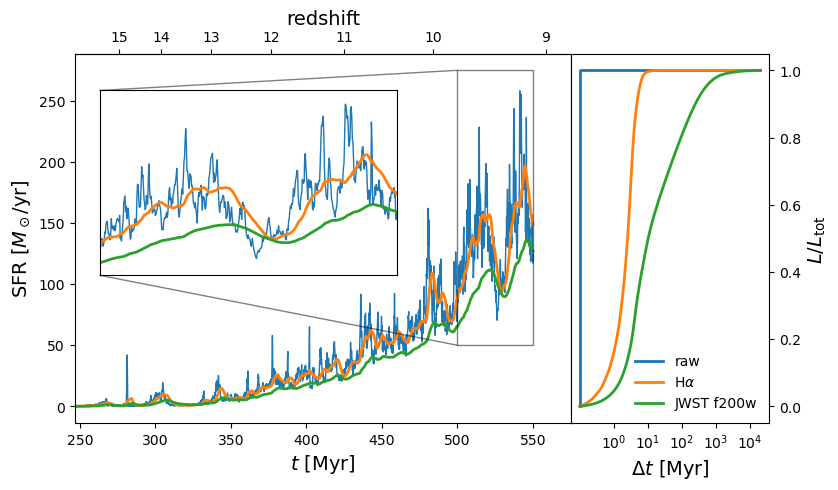

In [250]:
fig, ax1 = plt.subplots(ncols=1)

# define aexp ticks
aexp_min = 0.058
aexp_max = 0.102
tick_aexp = np.arange(0.06, 0.1 + 0.01, 0.01)

z_min = 15.2
z_max = 8.9
tick_z = [15, 14, 13, 12, 11, 10, 9]

aexp_list = np.linspace(1e-3, 1., 2**10)
time_list = np.array([aexp_to_proper_time(aexp_list[i]) for i in range(len(aexp_list))])
proper_time_to_z_interp = interp1d(time_list/const.Myr, 1/aexp_list-1, fill_value='extrapolate')
z_to_proper_time_interp = interp1d(1/aexp_list-1, time_list/const.Myr, fill_value='extrapolate')

# create axes
axtop = ax1.secondary_xaxis('top', functions=(proper_time_to_z_interp, z_to_proper_time_interp))
ax2 = ax1.inset_axes([0.05, 0.4, 0.6, 0.5], xlim=(500, 550), ylim=(50, 275), xticks=[], yticks=[])
ax3 = ax1.inset_axes([1, 0, 0.4, 1])

# plot raw SFR
ax1.plot(data.time1d / const.Myr, data.SFR / (const.M_sol / const.yr), label='raw', lw=1)
ax2.plot(data.time1d / const.Myr, data.SFR / (const.M_sol / const.yr), lw=1)

for resp_func_name in ['Halpha', 'f200w']:

    # plot convolved SFR
    SFR_conv = getattr(data, 'SFR_%s' % resp_func_name)
    ax1.plot(data.time1d / const.Myr, SFR_conv / (const.M_sol / const.yr), lw=2)
    ax2.plot(data.time1d / const.Myr, SFR_conv / (const.M_sol / const.yr), lw=2)

# plot cumulative response functions
ax3.plot(np.array([data_resp_func.time[0], data_resp_func.time[0], data_resp_func.time[-1]])/const.Myr, [0, 1, 1], lw=2, color='C0', label='raw')
ax3.plot(data_resp_func.time/const.Myr, Halpha_cum, lw=2, color='C1', label=r'H$\alpha$')
ax3.plot(data_resp_func.time/const.Myr, f200w_cum, lw=2, color='C2', label='JWST f200w')
    
# set up inset axis
ax1.indicate_inset_zoom(ax2, edgecolor="black")
    
# set up primary axis
ax1.set_ylabel(r"SFR [$M_\odot / {\rm yr}$]", fontsize=14)
ax1.set_xlabel(r"$t$ [Myr]", fontsize=14)
ax1.set_xlim(aexp_to_proper_time(aexp_min) / const.Myr, aexp_to_proper_time(aexp_max) / const.Myr)
ax3.legend(loc=4, frameon=False)
axtop.set_xticks(tick_z)
axtop.set_xlabel(r'redshift', fontsize=14)

# set up secondary axis
ax3.yaxis.tick_right()
ax3.yaxis.set_label_position('right')
ax3.set_xscale('log')
ax3.set_xlabel(r'$\Delta t$ [${\rm Myr}$]', fontsize=14)
ax3.set_ylabel(r'$L/L_{\rm tot}$', fontsize=14)
ax3.set_xticks([1e0, 1e1, 1e2, 1e3, 1e4]);

#save_fig('SFR_conv')


In [13]:
sim = Sim(12, "nofeed", "data_d18_l1_b5.npz")
sim_dir = move_to_sim_dir(9, 'fiducial')
data = SimpleNamespace(**np.load('starcat/data.npz'))


Moving to directory '/home/za9132/scratch/romain/round12/nofeed'.
Moving to directory '/home/za9132/scratch/romain/round9/fiducial'.


In [14]:
num = 512
nH1d, temp1d, hist = calc_hist2d(sim.n_H, sim.temp, 1e-3, 3e4, 3e1, 7e8, weight=sim.density*sim.dV, nbin=num)
nH1d, temp1d, hist_metal = calc_hist2d(sim.n_H, sim.temp, 1e-3, 3e4, 3e1, 7e8, weight=sim.density*sim.dV*sim.metallicity, nbin=num)


In [15]:
m_SNe = 10*const.M_sol
rho1d = nH1d*const.m_p/const.X_cosmo+m_SNe/sim.dx**3
mom_SNe = 1.42e5*const.M_sol*const.km * (nH1d/100)**(-0.16)


In [18]:
idx_star = np.zeros_like(sim.coord_star, dtype=int)
for i in [X, Y, Z]: idx_star[i] = np.searchsorted(sim.coord1d[i], sim.coord_star[i])
idx_star[idx_star==sim.N] = sim.N-1
nH_star = sim.n_H[tuple(idx_star)]
temp_star = sim.temp[tuple(idx_star)]
nH1d, temp1d, hist_star = calc_hist2d(nH_star, temp_star, 1e-3, 3e4, 3e1, 7e8, weight=sim.mass_star, nbin=num)
nH1d, temp1d, hist_star_young = calc_hist2d(nH_star, temp_star, 1e-3, 3e4, 3e1, 7e8, weight=sim.mass_star*(sim.age_star<20*const.Myr), nbin=num)


/tmp/ipykernel_4020939/3503434378.py:11: RuntimeWarning: divide by zero encountered in log10
  im = ax1.pcolormesh(nH1d, temp1d, np.log10(hist/const.M_sol).T, vmin=5.5, vmax=9.5, cmap=custom_cmp)


Text(0.5, 1.0, '$z = 9$')

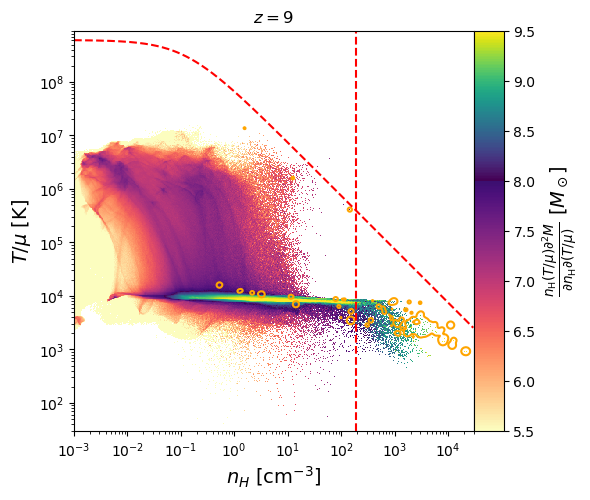

In [21]:
bottom = plt.colormaps['magma_r']
top = plt.colormaps['viridis']
custom_colors = np.vstack((bottom(np.linspace(0, 0.8, 10*16)), top(np.linspace(0, 1, 6*16))))
custom_cmp = ListedColormap(custom_colors, name='custom')

fig = plt.figure(figsize=(4, 4))
ax1 = fig.add_axes([0, 0, 1, 1])
ax1.set_xscale('log')
ax1.set_yscale('log')

im = ax1.pcolormesh(nH1d, temp1d, np.log10(hist/const.M_sol).T, vmin=5.5, vmax=9.5, cmap=custom_cmp)
cax = ax1.inset_axes([1, 0, 0.075, 1])
cbar = plt.colorbar(im, cax=cax)
cbar.set_label(r'$\frac{n_{\rm H} (T/\mu) \partial^2 M}{\partial n_{\rm H} \partial (T/\mu)}$ [$M_\odot$]', fontsize=14)

frac_list = [0.75]
hist_list = [hist_metal, hist_star_young, data.nH_temp_hist2d, data.nH_temp_hist2d_death]
bin1_list = [nH1d, nH1d, data.nH2d, data.nH2d_death]
bin2_list = [temp1d, temp1d, data.temp2d, data.temp2d_death]
sigma_list = [2, 2, 1, 0]
color_list = ['blue', 'orange', 'black', 'red']

for i in range(1, 2):
    
    hist_sm = gaussian_filter(hist_list[i], sigma_list[i])
    field = hist_sm.flatten()
    idx_sorted = np.argsort(field)
    cumsum = np.cumsum(field[idx_sorted])
    levels = [field[idx_sorted[np.searchsorted(cumsum, (1-frac)*cumsum[-1])]]/const.M_sol for frac in frac_list]
    ax1.contour(bin1_list[i], bin2_list[i], hist_sm.T/const.M_sol, levels=levels, colors=color_list[i])

E_SNe = 1e51
m_SNe = 10*const.M_sol
rho1d = nH1d*const.m_p/const.X_cosmo+m_SNe/sim.dx**3
temp_SNe = const.m_p/const.k_B * (E_SNe/sim.dx**3)/rho1d
nH_crit = 100*(sim.dx/(3*const.pc))**(0.42)
ax1.axvline(x=nH_crit, color='red', linestyle='--')
plt.plot(nH1d, temp_SNe, color='red', linestyle='--')

ax1.set_xlim(1e-3, 3e4)
ax1.set_ylim(3e1, 9e8)
ax1.set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
ax1.set_ylabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)

# cust_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='red', lw=2, linestyle='-')]
# ax1.legend(cust_lines, [r'2/3 $M_*$', r'2/3 $N_{\rm SNe}$'], fontsize=10, loc=1)

ax1.set_title(r'$z = %.3g$' % (1/sim.aexp-1))

#save_fig('phase_t5')


In [124]:
sim_round, sim_name = sim_list[0]
sim = Sim(sim_round, sim_name, npz_list[0])
sim_dir = move_to_sim_dir(sim_round, sim_name, do_print=False)
data = SimpleNamespace(**np.load('starcat/data.npz'))


Moving to directory '/home/za9132/scratch/romain/round9/mstar0p2'.


Moving to directory '/home/za9132/scratch/romain/round9/mstar0p2'.
Moving to directory '/home/za9132/scratch/romain/round9/fiducial'.
Moving to directory '/home/za9132/scratch/romain/round9/mstar5p0'.
Moving to directory '/home/za9132/scratch/romain/round12/nophot'.
Moving to directory '/home/za9132/scratch/romain/round12/nofeed'.


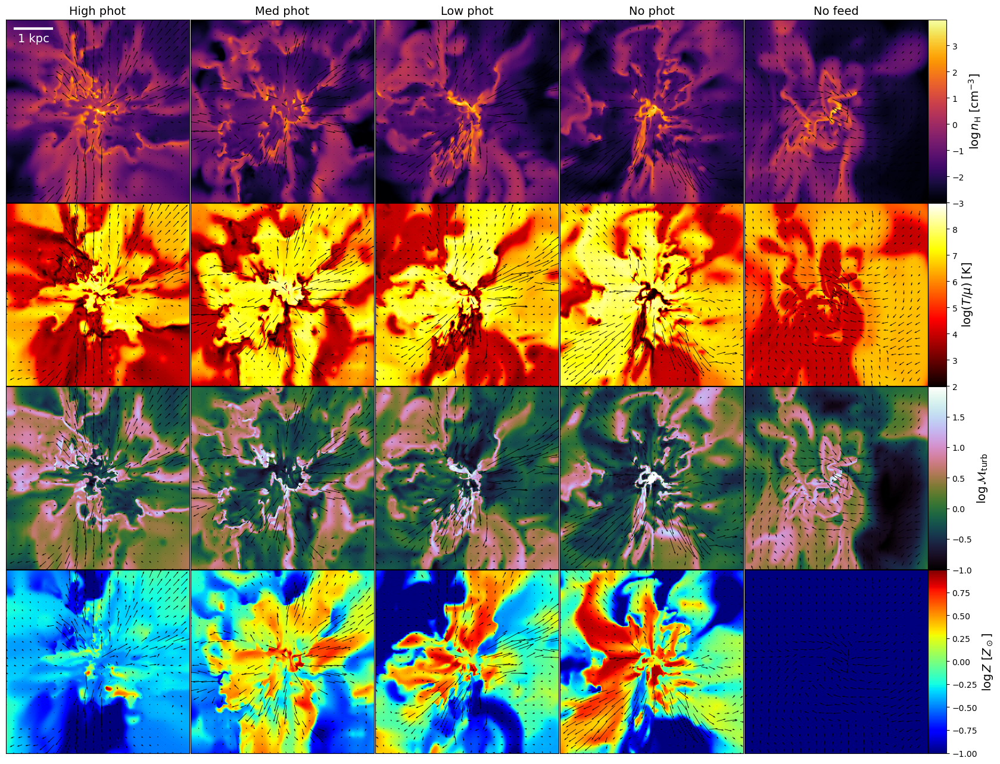

In [13]:
fig, axs = plt.subplots(nrows=4, ncols=5, figsize=(20, 16))
plt.subplots_adjust(wspace=1e-3, hspace=1e-3)
size_img = 5*const.kpc

sim_list  = [(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (12, "nofeed")]
npz_list  = ["data_d47_l1_b5.npz", "data_d52_l1_b5.npz", "data_d45_l1_b5.npz", "data_d53_l1_b5.npz", "data_d18_l1_b5.npz"]
lbl_list  = ['High phot', 'Med phot', 'Low phot', 'No phot', 'No feed']
var_list  = ['n_H', 'temp', 'mach_turb', 'metallicity']
clbl_list = [r'$\log n_{\rm H}$ [${\rm cm^{-3}}$]', r'$\log (T/\mu)$ [${\rm K}$]', r'$\log \mathcal{M}_{\rm turb}$', r'$\log Z$ [$Z_\odot$]']
rng_list  = [(1e-3, 1e4), (1e2, 1e9), (1e-1, 1e2), (1e-1, 1e1)]
cmap_list = ['inferno', 'hot', 'cubehelix', 'jet']
unit_list = [1, 1, 1, const.Z_sol]

for i in range(5):

    sim_round, sim_name = sim_list[i]
    sim = Sim(sim_round, sim_name, npz_list[i])
    axs[0, i].set_title(lbl_list[i], fontsize=14)
    
    skip = 16
    vely_rel_bulk = sim.vel_vec[Y] - np.sum(sim.density*sim.vel_vec[Y])/np.sum(sim.density)
    velz_rel_bulk = sim.vel_vec[Z] - np.sum(sim.density*sim.vel_vec[Z])/np.sum(sim.density)
    img_c1 = sim.slice_axis(sim.coord[Y], idx_axis=X, size_img=size_img)
    img_c2 = sim.slice_axis(sim.coord[Z], idx_axis=X, size_img=size_img)
    img_v1 = sim.slice_axis(vely_rel_bulk, idx_axis=X, size_img=size_img)
    img_v2 = sim.slice_axis(velz_rel_bulk, idx_axis=X, size_img=size_img)
    
    for j in range(4):
        
        var  = var_list[j]
        rng  = rng_list[j]
        cmap = cmap_list[j]
        unit = unit_list[j]
        clbl = clbl_list[j]
        ax = axs[j, i]

        img_var = sim.slice_axis(var, idx_axis=X, size_img=size_img)
        im = sim.plot_img(img_var/unit, ax=ax, do_log=True, cmap=cmap, vmin=rng[0], vmax=rng[1]*0.99, size_img=size_img)
        ax.quiver(img_c1[::skip, ::skip]/const.kpc, img_c2[::skip, ::skip]/const.kpc, img_v1[::skip, ::skip], img_v2[::skip, ::skip])

        ax.set_xticks([])
        ax.set_yticks([])
        
        if i==4:
            cax = ax.inset_axes([1, 0, 0.1, 1])
            cbar = plt.colorbar(im, cax=cax)
            cbar.set_label(clbl, fontsize=14)
        
sim.add_dis_to_ax(axs[0, 0], 1*const.kpc, size_img=size_img)



Moving to directory '/home/za9132/scratch/romain/round9/fiducial'.


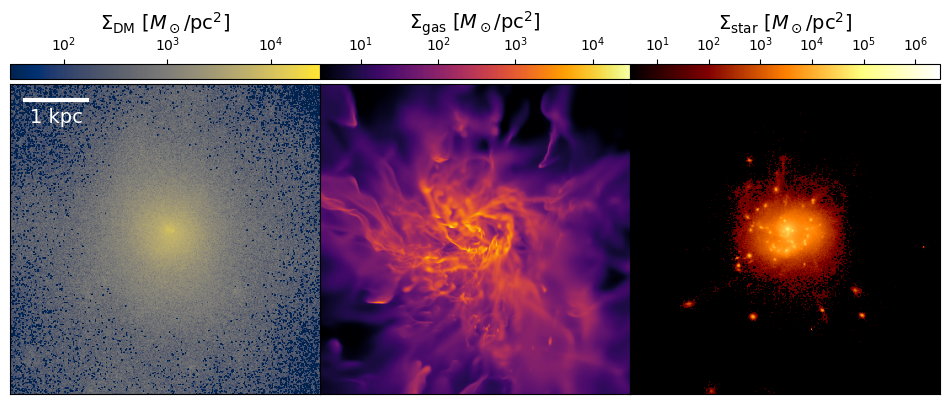

In [2]:
sim = Sim(9, "fiducial", "data_d52_l1_b5.npz")

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 5))
plt.subplots_adjust(hspace=1e-3, wspace=1e-3)

size_img = 5 * const.kpc

img = sim.proj_axis(sim.density_dm+const.small, idx_axis=Y, weight=sim.dx, size_img=size_img, do_avg=False)
im1 = sim.plot_img(img/(const.M_sol/const.pc**2), ax=axs[0], do_log=True, cmap='cividis', vmin=3e1, vmax=3e4, size_img=size_img)
img = sim.proj_axis(sim.density+const.small, idx_axis=Y, weight=sim.dx, size_img=size_img, do_avg=False)
im2 = sim.plot_img(img/(const.M_sol/const.pc**2), ax=axs[1], do_log=True, cmap='inferno', vmin=3e0, vmax=3e4, size_img=size_img)
img = sim.proj_axis(sim.density_star+const.small, idx_axis=Y, weight=sim.dx, size_img=size_img, do_avg=False)
im3 = sim.plot_img(img/(const.M_sol/const.pc**2), ax=axs[2], do_log=True, cmap='afmhot', vmin=3e0, vmax=3e6, size_img=size_img)
im_list = [im1, im2, im3]

for i in range(3):
    
    axs[i].set_xticks([])
    axs[i].set_yticks([])
    
    divider = make_axes_locatable(axs[i])
    cax = divider.append_axes("top", size="5%", pad=0.05)
    cbar = plt.colorbar(im_list[i], cax=cax, orientation='horizontal', ticks=[1, 2, 3, 4, 5, 6])
    cbar.set_ticklabels([r'$10^{1}$', r'$10^{2}$', r'$10^{3}$', r'$10^{4}$', r'$10^{5}$', r'$10^{6}$'])
    cax.xaxis.set_ticks_position("top")
    cax.xaxis.set_label_position("top")
    cbar.set_label(r'$\Sigma_{\rm %s}$ [$M_\odot/{\rm pc^2}$]'%(['DM', 'gas', 'star'][i]), fontsize=14)
    
sim.add_dis_to_ax(axs[0], 1*const.kpc, size_img=size_img)
# save_fig('alldens')


/tmp/ipykernel_2524771/3786732123.py:36: RuntimeWarning: divide by zero encountered in log10
  log_SFR = np.log10(data.SFR)
/tmp/ipykernel_2524771/3786732123.py:48: RuntimeWarning: divide by zero encountered in divide
  axs[1, j].plot(1/freq/const.Myr, psd/const.Myr, lw=2, color=color_list[i], linestyle=linestyle_list[i])
/tmp/ipykernel_2524771/3786732123.py:42: RuntimeWarning: invalid value encountered in subtract
  sig = np.sqrt(np.convolve((delta_log_SFR-mu)**2, np.ones(wsize), 'same')/wsize)
/tmp/ipykernel_2524771/3786732123.py:43: RuntimeWarning: invalid value encountered in divide
  B = (sig/np.abs(mu)-1)/(sig/np.abs(mu)+1)
/tmp/ipykernel_2524771/3786732123.py:61: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axs[1, i].set_ylim(-0.05, 1.02)


Text(0.5, 1.0, 'Turbulence series')

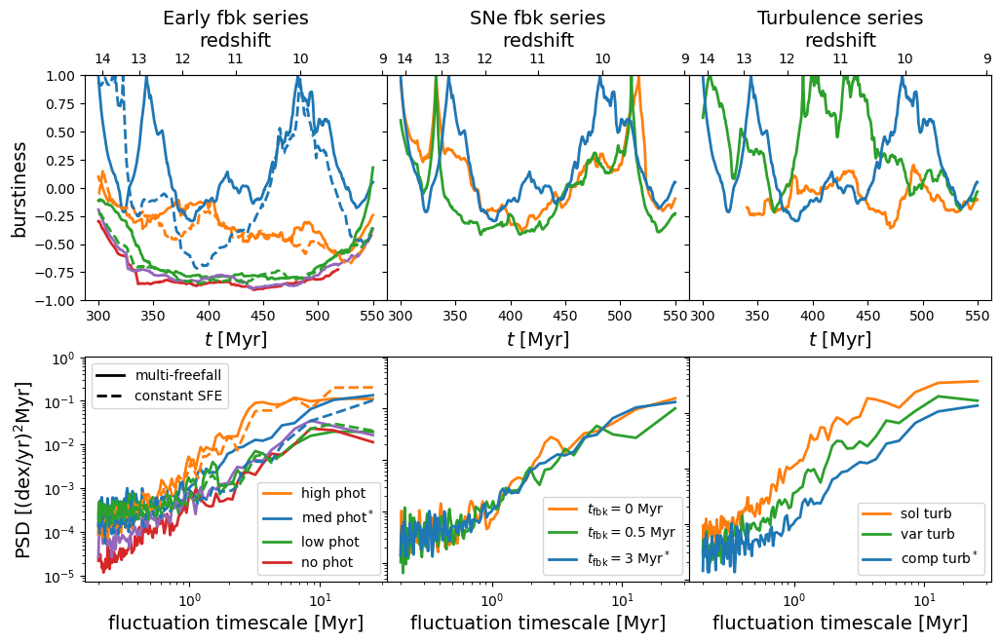

In [57]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 3), sharey='row')
plt.subplots_adjust(hspace=1e-3, wspace=1e-3)

axs_new = np.zeros((2, 3), dtype=plt.Axes)
axs_new[:2, :] = axs
axs = axs_new

for i in range(3):
    axs[1, i] = axs[0, i].inset_axes([0, -1.25, 1, 1])

z_min = 15.2
z_max = 8.9
tick_z = [15, 14, 13, 12, 11, 10, 9]

aexp_list = np.linspace(1e-3, 1., 2**10)
time_list = np.array([aexp_to_proper_time(aexp_list[i]) for i in range(len(aexp_list))])
proper_time_to_z_interp = interp1d(time_list/const.Myr, 1/aexp_list-1, fill_value='extrapolate')
z_to_proper_time_interp = interp1d(1/aexp_list-1, time_list/const.Myr, fill_value='extrapolate')

sim_list_list = [[(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (12, "nofeed"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")], [(9, "instantfeedback"), (9, "fastfeedback"), (9, "fiducial")], [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]]
label_list_list = [[r"high phot", r"med phot$^*$", r"low phot", "no phot", "no feed", None, None, None], [r"$t_{\rm fbk} = 0~{\rm Myr}$", r"$t_{\rm fbk} = 0.5~{\rm Myr}$", r"$t_{\rm fbk} = 3~{\rm Myr}^*$"], [r"sol turb", r"var turb", r"comp turb$^*$"]]
color_list_list = [["C1", "C0", "C2", "C3", "C4", "C1", "C0", "C2"], ["C1", "C2", "C0"], ["C1", "C2", "C0"]]
linestyle_list_list = [["-"]*5+["--"]*3, ["-"]*3, ["-"]*3]
is_mff_list_list = [[True]*5+[False]*3, [True]*3, [True]*3]

for j in range(3):
    
    sim_list, label_list, color_list, linestyle_list, is_mff_list = sim_list_list[j], label_list_list[j], color_list_list[j], linestyle_list_list[j], is_mff_list_list[j]
    
    for i in range(len(label_list)):
        
        sim_round, sim_name = sim_list[i]
        move_to_sim_dir(sim_round, sim_name, do_print=False)
        data = SimpleNamespace(**np.load('starcat/data.npz'))
        data.SFR = data.starmass_hist1d
        log_SFR = np.log10(data.SFR)
        
        window = 30*const.Myr
        wsize = int(window/(data.time1d[1]-data.time1d[0]))
        delta_log_SFR = log_SFR[cond] - affine(data.time1d[cond], *popt)
        mu = np.convolve(delta_log_SFR, np.ones(wsize), 'same')/wsize
        sig = np.sqrt(np.convolve((delta_log_SFR-mu)**2, np.ones(wsize), 'same')/wsize)
        B = (sig/np.abs(mu)-1)/(sig/np.abs(mu)+1)
        axs[0, j].plot(data.time1d[cond]/const.Myr, B, lw=2, color=color_list[i], linestyle=linestyle_list[i])
        
        cond_psd = (data.time1d > 300*const.Myr) * (data.SFR > 0)
        freq, psd = welch(log_SFR[cond_psd], 1/(data.time1d[1]-data.time1d[0]), detrend='linear')
        axs[1, j].plot(1/freq/const.Myr, psd/const.Myr, lw=2, color=color_list[i], linestyle=linestyle_list[i])
        
for i in range(3):
    
    axtop = axs[0, i].secondary_xaxis('top', functions=(proper_time_to_z_interp, z_to_proper_time_interp))
    axtop.set_xticks(tick_z)
    axtop.set_xlabel(r'redshift', fontsize=14)
    
    axs[0, i].set_xlabel(r"$t$ [Myr]", fontsize=14)
    axs[0, i].set_ylim(-1, 1)
    axs[1, i].set_xscale('log')
    axs[1, i].set_yscale('log')
    axs[1, i].set_xlabel(r'fluctuation timescale [Myr]', fontsize=14)
    axs[1, i].set_ylim(-0.05, 1.02)
    if i>0: axs[1, i].set_yticklabels([])
    
axs[0, 0].set_ylabel(r"burstiness", fontsize=14)
axs[1, 0].set_ylabel(r'PSD [${\rm (dex/yr)^2 Myr}$]', fontsize=14)

cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C0", "C2", "C3"]]
leg = axs[1, 0].legend(cust_lines, label_list_list[0], fontsize=10, loc=4)
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[1, 1].legend(cust_lines, label_list_list[1], fontsize=10, loc=4)
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[1, 2].legend(cust_lines, label_list_list[2], fontsize=10, loc=4)
cust_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]
axs[1, 0].legend(cust_lines, ['multi-freefall', 'constant SFE'])
axs[1, 0].add_artist(leg)

axs[0, 0].set_title('Early fbk series', fontsize=14)
axs[0, 1].set_title('SNe fbk series', fontsize=14)
axs[0, 2].set_title('Turbulence series', fontsize=14)

#save_fig("SFR")


In [ ]:
fig, axs = plt.subplots(figsize=(12, 7.5), nrows=3, ncols=4, sharex='col', sharey='col')
plt.subplots_adjust(wspace=1e-3, hspace=1e-3)

sim_list_list = [[(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")], [(9, "instantfeedback"), (9, "fastfeedback"), (9, "fiducial")], [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]]
label_list_list = [[r"high phot", r"med phot$^*$", r"low phot", "no phot"], [r"$t_{\rm fbk} = 0~{\rm Myr}$", r"$t_{\rm fbk} = 0.5~{\rm Myr}$", r"$t_{\rm fbk} = 3~{\rm Myr}^*$"], [r"sol turb", r"var turb", r"comp turb$^*$"]]
color_list_list = [["C1", "C0", "C2", "C3"], ["C1", "C2", "C0"], ["C1", "C2", "C0"]]
linestyle_list_list = [["-"]*4, ["-"]*3, ["-"]*3]

for i in range(3):
    
    sim_list, label_list, color_list, linestyle_list = sim_list_list[i], label_list_list[i], color_list_list[i], linestyle_list_list[i]
    
    for j in range(4):
        
        ax = axs[i, j]
        ax.set_xscale('log')
        if j==0: ax.set_ylabel(r'$\frac{{\rm d} M/M_{\rm tot}}{{\rm d}(\log X)}$', fontsize=20)
        #ax.set_yticks([0, 1]) #if j==0 else ax.set_yticks([])
        
    for j in range(len(label_list)):
    
        sim_round, sim_name = sim_list[j]
        move_to_sim_dir(sim_round, sim_name, do_print=False)
        sim_latex = sim_name_to_latex[sim_name]
        data = SimpleNamespace(**np.load('starcat/data.npz'))

        axs[i, 0].plot(data.nH1d, data.nH_pdf1d, color=color_list[j], linestyle=linestyle_list[j], lw=2)
        axs[i, 1].plot(data.temp1d, data.temp_pdf1d, color=color_list[j], linestyle=linestyle_list[j], lw=2)
        axs[i, 2].plot(data.sig_turb1d/const.km, data.sig_turb_pdf1d, color=color_list[j], linestyle=linestyle_list[j], lw=2)
        axs[i, 3].plot(data.metallicity1d/const.Z_sol, data.metallicity_pdf1d, color=color_list[j], linestyle=linestyle_list[j], lw=2)

axs[2, 0].set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
axs[2, 1].set_xlabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
axs[2, 2].set_xlabel(r'$\sigma_{\rm turb}$ [${\rm km/s}$]', fontsize=14)
axs[2, 3].set_xlabel(r'$Z$ [$Z_{\odot}$]', fontsize=14)
        
axs[0, 0].set_ylim(None, 1.6);
axs[2, 0].set_xticks([1e1, 1e2, 1e3, 1e4, 1e5, 1e6]);
axs[2, 3].set_xticks([1e-1, 1e0, 1e1]);

axs[0, 0].annotate('Early fbk series', (-0.46, 0.5), xycoords='axes fraction', fontsize=12, rotation=90, verticalalignment='center')
axs[1, 0].annotate('SNe fbk series', (-0.46, 0.5), xycoords='axes fraction', fontsize=12, rotation=90, verticalalignment='center')
axs[2, 0].annotate('Turbulence series', (-0.46, 0.5), xycoords='axes fraction', fontsize=12, rotation=90, verticalalignment='center')

for i in range(3):
    cust_lines = [Line2D([0], [0], color=color, lw=2) for color in color_list_list[i]][:4]
    axs[i, 3].legend(cust_lines, label_list_list[i], fontsize=10, loc=2, bbox_to_anchor=(1, 1))
cust_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]

sim_dir = move_to_sim_dir(9, "bturbfunc")
data = SimpleNamespace(**np.load('starcat/data.npz'))
axin = axs[2, 3].inset_axes([1., 0., 0.55, 0.55], xticks=[0.4, 0.6, 0.8, 1.0])
axin.plot(data.b_turb1d, data.b_turb_hist1d/1e10/const.M_sol, lw=2, color='C2')
axin.axvline(x=1., color='C0', lw=2)
axin.axvline(x=1/3, color='C1', lw=2)
axin.set_xlabel(r"$b_{\rm turb}$", fontsize=14)
axin.yaxis.tick_right()
axin.yaxis.set_label_position('right')
axin.set_ylabel(r'${\rm d}(M/M_{\rm tot})/{\rm d}b_{\rm turb}$', fontsize=12)
axin.set_ylim(-0.4, 4)

plt.suptitle('Histograms of Star-forming Cell Properties Weighted by Stellar Mass', fontsize=14, y=0.92)

#save_fig('mstarhist')
        


In [ ]:
fig, axs = plt.subplots(figsize=(12, 7.5), nrows=3, ncols=4, sharex='col', sharey='col')
plt.subplots_adjust(wspace=1e-3, hspace=1e-3)

sim_list_list = [[(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")], [(9, "instantfeedback"), (9, "fastfeedback"), (9, "fiducial")], [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]]
label_list_list = [[r"high phot", r"med phot$^*$", r"low phot", "no phot"], [r"$t_{\rm fbk} = 0~{\rm Myr}$", r"$t_{\rm fbk} = 0.5~{\rm Myr}$", r"$t_{\rm fbk} = 3~{\rm Myr}^*$"], [r"sol turb", r"var turb", r"comp turb$^*$"]]
color_list_list = [["C1", "C0", "C2", "C3"], ["C1", "C2", "C0"], ["C1", "C2", "C0"]]
linestyle_list_list = [["-"]*4, ["-"]*3, ["-"]*3]

for i in range(3):
    
    sim_list, label_list, color_list, linestyle_list = sim_list_list[i], label_list_list[i], color_list_list[i], linestyle_list_list[i]
    
    for j in range(4):
        
        ax = axs[i, j]
        ax.set_xscale('log')
        if j==0: ax.set_ylabel(r'$\frac{{\rm d} N/N_{\rm tot}}{{\rm d}(\log X)}$', fontsize=20)
        #ax.set_yticks([0]) if j==0 else ax.set_yticks([])
        
    for j in range(len(label_list)):
    
        sim_round, sim_name = sim_list[j]
        move_to_sim_dir(sim_round, sim_name, do_print=False)
        sim_latex = sim_name_to_latex[sim_name]
        data = SimpleNamespace(**np.load('starcat/data.npz'))

        axs[i, 0].plot(data.nH1d_death, data.nH_pdf1d_death, color=color_list[j], linestyle=linestyle_list[j], lw=2)
        axs[i, 1].plot(data.temp1d_death, data.temp_pdf1d_death, color=color_list[j], linestyle=linestyle_list[j], lw=2)
        axs[i, 2].plot(data.sig_turb1d_death/const.km, data.sig_turb_pdf1d_death, color=color_list[j], linestyle=linestyle_list[j], lw=2)
        axs[i, 3].plot(data.metallicity1d_death/const.Z_sol, data.metallicity_pdf1d_death, color=color_list[j], linestyle=linestyle_list[j], lw=2)

axs[2, 0].set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
axs[2, 1].set_xlabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
axs[2, 2].set_xlabel(r'$\sigma_{\rm turb}$ [${\rm km/s}$]', fontsize=14)
axs[2, 3].set_xlabel(r'$Z$ [$Z_{\odot}$]', fontsize=14)
        
axs[0, 0].set_ylim(None, 0.67);
axs[0, 1].set_ylim(None, 1.49);
axs[0, 3].set_ylim(-0.075, 1.65);
axs[2, 0].set_xticks([1e-4, 1e-2, 1e0, 1e2, 1e4]);
axs[2, 1].set_xticks([1e2, 1e4, 1e6, 1e8]);
axs[2, 3].set_xticks([1e-1, 1e0, 1e1]);

axs[0, 0].annotate('Early fbk series', (-0.46, 0.5), xycoords='axes fraction', fontsize=12, rotation=90, verticalalignment='center')
axs[1, 0].annotate('SNe fbk series', (-0.46, 0.5), xycoords='axes fraction', fontsize=12, rotation=90, verticalalignment='center')
axs[2, 0].annotate('Turbulence series', (-0.46, 0.5), xycoords='axes fraction', fontsize=12, rotation=90, verticalalignment='center')

for i in range(3):
    cust_lines = [Line2D([0], [0], color=color, lw=2) for color in color_list_list[i]][:4]
    axs[i, 3].legend(cust_lines, label_list_list[i], fontsize=10, loc=2, bbox_to_anchor=(1, 1))
cust_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]

sim_dir = move_to_sim_dir(9, "bturbfunc")
data = SimpleNamespace(**np.load('starcat/data.npz'))
axin = axs[2, 3].inset_axes([1., 0., 0.55, 0.55], xticks=[0.4, 0.6, 0.8, 1.0])
axin.plot(data.b_turb1d_death, data.b_turb_pdf1d_death, lw=2, color='C2')
axin.axvline(x=1., color='C0', lw=2)
axin.axvline(x=1/3, color='C1', lw=2)
axin.set_xlabel(r"$b_{\rm turb}$", fontsize=14)
axin.yaxis.tick_right()
axin.yaxis.set_label_position('right')
axin.set_ylabel(r'${\rm d}(N/N_{\rm tot})/{\rm d}b_{\rm turb}$', fontsize=12)
axin.set_ylim(-0.4, 4)

plt.suptitle('Histograms of SNe-hosting Cell Properties Weighted by SNe Number', fontsize=14, y=0.92)

save_fig('nsnehist')


In [ ]:
fig, axs = plt.subplots(figsize=(12, 7.5), nrows=3, ncols=4, sharex='col', sharey='col')
plt.subplots_adjust(wspace=1e-3, hspace=1e-3)

sim_list_list = [[(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")], [(9, "instantfeedback"), (9, "fastfeedback"), (9, "fiducial")], [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]]
label_list_list = [[r"high phot", r"med phot$^*$", r"low phot", "no phot", None, None, None], [r"$t_{\rm fbk} = 0~{\rm Myr}$", r"$t_{\rm fbk} = 0.5~{\rm Myr}$", r"$t_{\rm fbk} = 3~{\rm Myr}^*$"], [r"sol turb", r"var turb", r"comp turb$^*$"]]
color_list_list = [["C1", "C0", "C2", "C3", "C1", "C0", "C2"], ["C1", "C2", "C0"], ["C1", "C2", "C0"]]
linestyle_list_list = [["-"]*4+["--"]*3, ["-"]*3, ["-"]*3]
unit_list = [1, 1, const.km, const.Z_sol]

for i in range(3):
    
    sim_list, label_list, color_list, linestyle_list = sim_list_list[i], label_list_list[i], color_list_list[i], linestyle_list_list[i]
    
    for j in range(4):
        
        ax = axs[i, j]
        ax.set_xscale('log')
        if j==0: ax.set_ylabel(r'$\frac{{\rm d} M/M_{\rm tot}}{{\rm d}(\log X)}$', fontsize=20)
        #ax.set_yticks([0]) if j==0 else ax.set_yticks([])
        
    for j in range(len(label_list)):
        
        for k in range(4):
            
            axs[i, k].plot(bin_list[i][j][k]/unit_list[k], hist_list[i][j][k], color=color_list[j], linestyle=linestyle_list[j], lw=2)

axs[2, 0].set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
axs[2, 1].set_xlabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
axs[2, 2].set_xlabel(r'$\sigma_{\rm turb}$ [${\rm km/s}$]', fontsize=14)
axs[2, 3].set_xlabel(r'$Z$ [$Z_{\odot}$]', fontsize=14)
        
axs[0, 0].set_ylim(None, 0.59);
axs[0, 3].set_ylim(None, 3.4);
axs[2, 0].set_xticks([1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3, 1e4]);
axs[2, 3].set_xticks([1e-1, 1e0, 1e1]);
axs[0, 2].set_ylim(None, 1.6)

axs[0, 0].annotate('Early fbk series', (-0.46, 0.5), xycoords='axes fraction', fontsize=12, rotation=90, verticalalignment='center')
axs[1, 0].annotate('SNe fbk series', (-0.46, 0.5), xycoords='axes fraction', fontsize=12, rotation=90, verticalalignment='center')
axs[2, 0].annotate('Turbulence series', (-0.46, 0.5), xycoords='axes fraction', fontsize=12, rotation=90, verticalalignment='center')

for i in range(3):
    cust_lines = [Line2D([0], [0], color=color, lw=2) for color in color_list_list[i]][:4]
    axs[i, 3].legend(cust_lines, label_list_list[i], fontsize=10, loc=2, bbox_to_anchor=(1, 1))

sim_dir = move_to_sim_dir(9, "bturbfunc")
data = SimpleNamespace(**np.load('starcat/data.npz'))
axin = axs[2, 3].inset_axes([1., 0., 0.55, 0.55], xticks=[0.4, 0.6, 0.8, 1.0])
axin.plot(bin_list[1][1][4], hist_list[1][1][4], lw=2, color='C2')
axin.axvline(x=1., color='C0', lw=2)
axin.axvline(x=1/3, color='C1', lw=2)
axin.set_xlabel(r"$b_{\rm turb}$", fontsize=14)
axin.yaxis.tick_right()
axin.yaxis.set_label_position('right')
axin.set_ylabel(r'${\rm d}(M/M_{\rm tot})/{\rm d}b_{\rm turb}$', fontsize=12)
axin.set_ylim(-0.4, 4)

plt.suptitle('Histograms of Gas Properties Weighted by Gas Mass', fontsize=14, y=0.92)

save_fig('mgashist')


/tmp/ipykernel_2524771/2913462607.py:6: RuntimeWarning: divide by zero encountered in log10
  log_SFR = np.log10(data.SFR)


Text(0, 0.5, 'SFR [${\\rm M_\\odot/yr}$]')

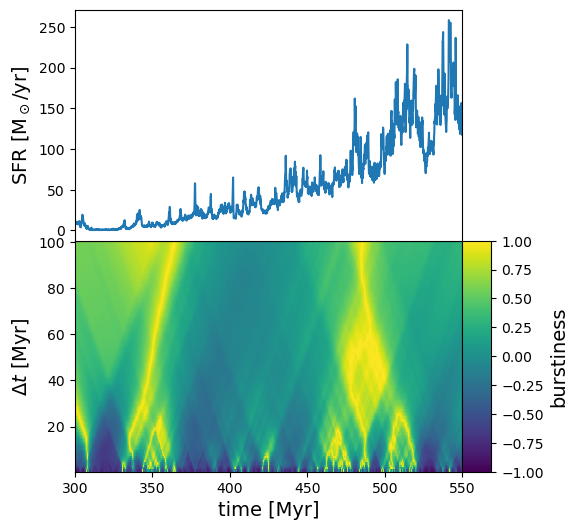

In [54]:
fig, ax1 = plt.subplots(figsize=(5, 3))

move_to_sim_dir(9, "fiducial", do_print=False)
data = SimpleNamespace(**np.load('starcat/data.npz'))
data.SFR = data.starmass_hist1d
log_SFR = np.log10(data.SFR)
cond = (data.SFR > 0) * (data.time1d > 300*const.Myr)

popt, _ = curve_fit(affine, data.time1d[cond], log_SFR[cond])
delta_log_SFR = log_SFR[cond] - affine(data.time1d[cond], *popt)

num = 100
window_list = np.arange(1, num+1)*const.Myr
wsize_list = np.array(window_list/(data.time1d[1]-data.time1d[0]), dtype=int)
B = np.zeros((num, delta_log_SFR.size))
for i, wsize in enumerate(wsize_list):
    mu = np.convolve(delta_log_SFR, np.ones(wsize), 'same')/wsize
    sig = np.sqrt(np.convolve((delta_log_SFR-mu)**2, np.ones(wsize), 'same')/wsize)
    B[i] = (sig/np.abs(mu)-1)/(sig/np.abs(mu)+1)

im = ax1.pcolormesh(data.time1d[cond]/const.Myr, window_list/const.Myr, B, vmin=-1, vmax=1)
ax2 = ax1.inset_axes([0, 1, 1, 1])
ax2.plot(data.time1d[cond]/const.Myr, data.SFR[cond]/(const.M_sol/const.yr))
ax2.set_xlim(300, 550)
ax2.set_xticks([])

cax = ax1.inset_axes([1, 0, 0.075, 1])
cbar = plt.colorbar(im, cax=cax)
cbar.set_label(r'burstiness', fontsize=14)

ax1.set_xlabel('time [Myr]', fontsize=14)
ax1.set_ylabel(r'$\Delta t$ [Myr]', fontsize=14)
ax2.set_ylabel(r'SFR [${\rm M_\odot/yr}$]', fontsize=14)


/tmp/ipykernel_3391087/269377400.py:4: RuntimeWarning: divide by zero encountered in log10
  log_SFR = np.log10(data.SFR)


Text(0.5, 0, 'time [Myr]')

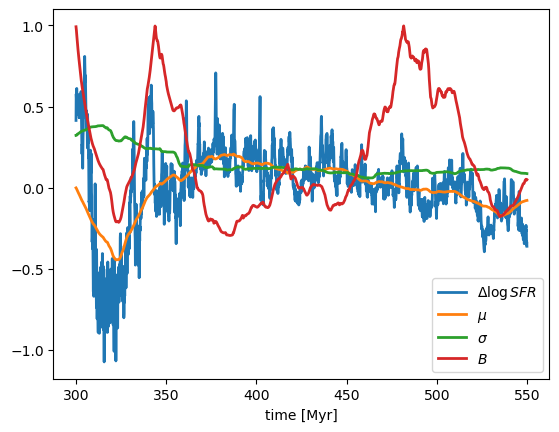

In [6]:
move_to_sim_dir(9, "fiducial", do_print=False)
data = SimpleNamespace(**np.load('starcat/data.npz'))
data.SFR = data.starmass_hist1d
log_SFR = np.log10(data.SFR)
cond = (data.SFR > 0) * (data.time1d > 300*const.Myr)

popt, _ = curve_fit(affine, data.time1d[cond], log_SFR[cond])

delta_log_SFR = log_SFR[cond] - affine(data.time1d[cond], *popt)

window = 30*const.Myr
wsize = int(window/(data.time1d[1]-data.time1d[0]))
mu = np.convolve(delta_log_SFR, np.ones(wsize), 'same')/wsize
sig = np.sqrt(np.convolve((delta_log_SFR-mu)**2, np.ones(wsize), 'same')/wsize)
B = (sig/np.abs(mu)-1)/(sig/np.abs(mu)+1)

plt.plot(data.time1d[cond]/const.Myr, delta_log_SFR, lw=2, label=r'$\Delta \log SFR$')
plt.plot(data.time1d[cond]/const.Myr, mu, lw=2, label=r'$\mu$')
plt.plot(data.time1d[cond]/const.Myr, sig, lw=2, label=r'$\sigma$')
plt.plot(data.time1d[cond]/const.Myr, B, lw=2, label=r'$B$')
plt.legend()

plt.xlabel('time [Myr]')


Text(0.5, 1.0, 'Turbulence series')

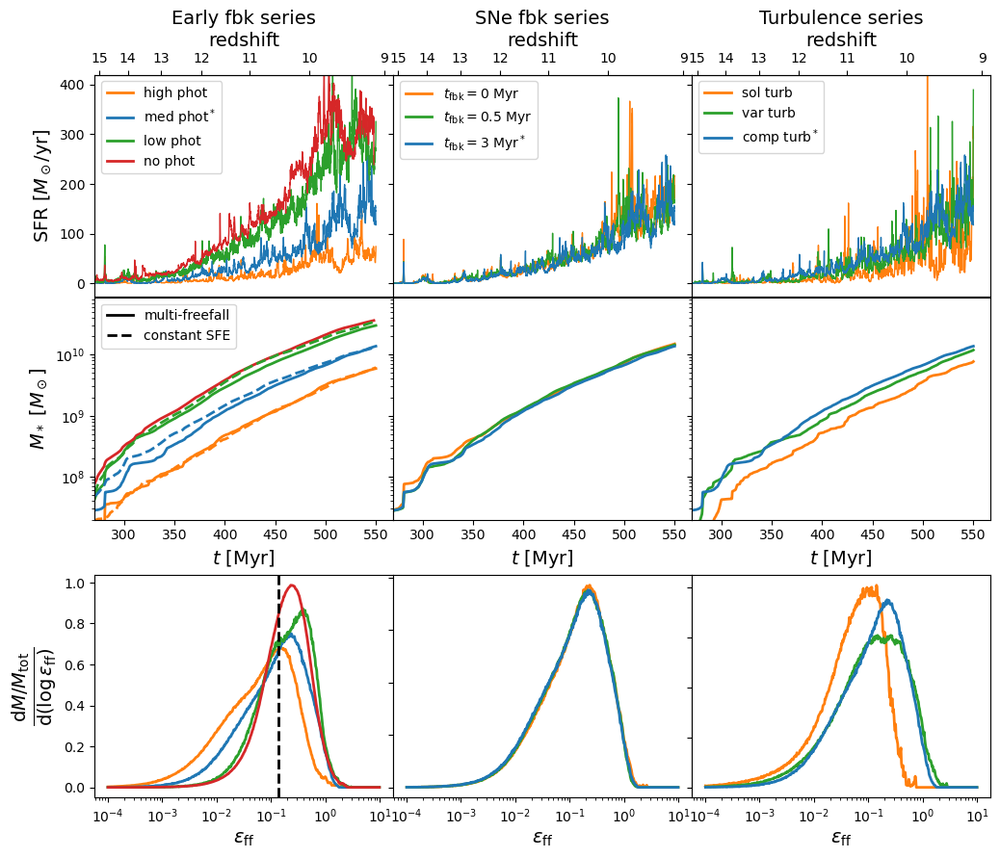

In [2]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(12, 6), sharey='row')
plt.subplots_adjust(hspace=1e-3, wspace=1e-3)

axs_new = np.zeros((3, 3), dtype=plt.Axes)
axs_new[:2, :] = axs
axs = axs_new

for i in range(3):
    axs[2, i] = axs[1, i].inset_axes([0, -1.25, 1, 1])
    if i>0: axs[2, i].set_yticklabels([])

z_min = 15.2
z_max = 8.9
tick_z = [15, 14, 13, 12, 11, 10, 9]

aexp_list = np.linspace(1e-3, 1., 2**10)
time_list = np.array([aexp_to_proper_time(aexp_list[i]) for i in range(len(aexp_list))])
proper_time_to_z_interp = interp1d(time_list/const.Myr, 1/aexp_list-1, fill_value='extrapolate')
z_to_proper_time_interp = interp1d(1/aexp_list-1, time_list/const.Myr, fill_value='extrapolate')

sim_list_list = [[(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")], [(9, "instantfeedback"), (9, "fastfeedback"), (9, "fiducial")], [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]]
label_list_list = [[r"high phot", r"med phot$^*$", r"low phot", "no phot", None, None, None], [r"$t_{\rm fbk} = 0~{\rm Myr}$", r"$t_{\rm fbk} = 0.5~{\rm Myr}$", r"$t_{\rm fbk} = 3~{\rm Myr}^*$"], [r"sol turb", r"var turb", r"comp turb$^*$"]]
color_list_list = [["C1", "C0", "C2", "C3", "C1", "C0", "C2"], ["C1", "C2", "C0"], ["C1", "C2", "C0"]]
linestyle_list_list = [["-"]*4+["--"]*3, ["-"]*3, ["-"]*3]
is_mff_list_list = [[True]*4+[False]*3, [True]*3, [True]*3]

for j in range(3):
    
    sim_list, label_list, color_list, linestyle_list, is_mff_list = sim_list_list[j], label_list_list[j], color_list_list[j], linestyle_list_list[j], is_mff_list_list[j]
    
    for i in range(len(label_list)):
        
        sim_round, sim_name = sim_list[i]
        move_to_sim_dir(sim_round, sim_name, do_print=False)
        data = SimpleNamespace(**np.load('starcat/data.npz'))
        data.SFR = data.starmass_hist1d
        data.starmass = np.cumsum(data.SFR)*np.diff(data.time1d)[0]
        cond = (data.SFR > 0)
        if is_mff_list[i]: axs[0, j].plot(data.time1d[cond]/const.Myr, data.SFR[cond]/(const.M_sol/const.yr), lw=1., label=label_list[i], color=color_list[i], linestyle=linestyle_list[i])
        axs[1, j].plot(data.time1d[cond]/const.Myr, data.starmass[cond]/const.M_sol, lw=2., color=color_list[i], linestyle=linestyle_list[i])
        if is_mff_list[i]: axs[2, j].plot(data.eps_sf1d, data.eps_sf_pdf1d, lw=2, color=color_list[i])
        
for i in range(3):
    
    axtop = axs[0, i].secondary_xaxis('top', functions=(proper_time_to_z_interp, z_to_proper_time_interp))
    axtop.set_xticks(tick_z)
    axtop.set_xlabel(r'redshift', fontsize=14)
    
    axs[1, i].set_xlabel(r"$t$ [Myr]", fontsize=14)
    axs[1, i].set_yscale('log')
    axs[2, i].set_xscale('log')
    axs[2, i].set_xlabel(r"$\epsilon_{\rm ff}$", fontsize=14)
    
    axs[0, i].set_xlim(z_to_proper_time_interp(z_min), z_to_proper_time_interp(z_max))
    axs[0, i].set_ylim(None, 420)
    axs[1, i].set_xlim(z_to_proper_time_interp(z_min), z_to_proper_time_interp(z_max))
    axs[1, i].set_ylim(2e7)
    
axs[0, 0].set_ylabel(r"SFR [$M_\odot / {\rm yr}$]", fontsize=14)
axs[1, 0].set_ylabel(r"$M_*$ [$M_\odot$]", fontsize=14)
axs[2, 0].set_ylabel(r'$\frac{{\rm d} M/M_{\rm tot}}{{\rm d}(\log \epsilon_{\rm ff})}$', fontsize=20)
axs[2, 0].axvline(x=0.1371535430985907, color='black', linestyle='--', lw=2)

cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C0", "C2", "C3"]]
axs[0, 0].legend(cust_lines, label_list_list[0], fontsize=10)
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[0, 1].legend(cust_lines, label_list_list[1], fontsize=10)
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[0, 2].legend(cust_lines, label_list_list[2], fontsize=10)
cust_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]
axs[1, 0].legend(cust_lines, ['multi-freefall', 'constant SFE'])

axs[0, 0].set_title('Early fbk series', fontsize=14)
axs[0, 1].set_title('SNe fbk series', fontsize=14)
axs[0, 2].set_title('Turbulence series', fontsize=14)

#save_fig("SFR")


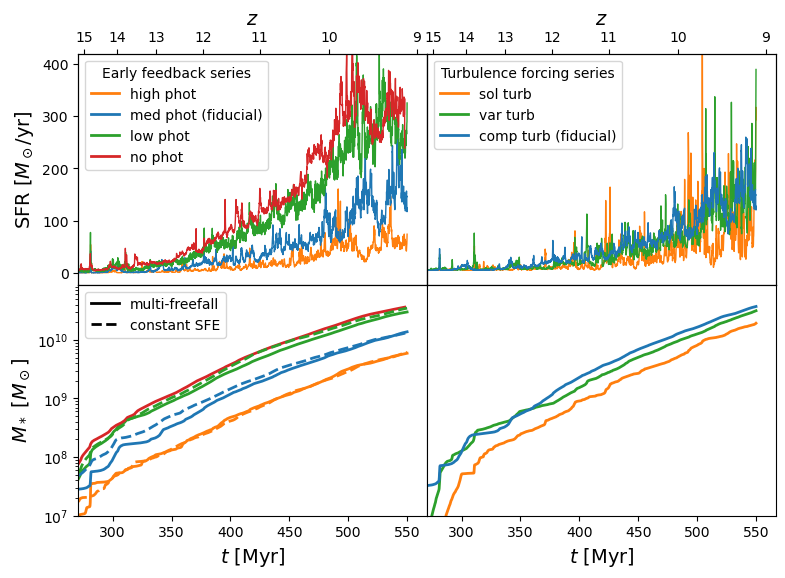

In [2]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(9, 6), sharex=True)
plt.subplots_adjust(hspace=1e-3, wspace=1e-3)

z_min = 15.2
z_max = 8.9
tick_z = [15, 14, 13, 12, 11, 10, 9]

sim_list_list = [[(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")], [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]]
label_list_list = [[r"high phot", r"med phot (fiducial)", r"low phot", "no phot", None, None, None], [r"sol turb", r"var turb", r"comp turb (fiducial)"]]
color_list_list = [["C1", "C0", "C2", "C3", "C1", "C0", "C2"], ["C1", "C2", "C0"]]
linestyle_list_list = [["-"]*4+["--"]*3, ["-"]*3]
do_sfr_plot_list_list = [[True]*4+[False]*3, [True]*3]

for j in range(2):
    sim_list, label_list, color_list, linestyle_list, do_sfr_plot_list = sim_list_list[j], label_list_list[j], color_list_list[j], linestyle_list_list[j], do_sfr_plot_list_list[j]
    for i in range(len(label_list)):
        sim_round, sim_name = sim_list[i]
        move_to_sim_dir(sim_round, sim_name, do_print=False)
        sim_latex = sim_name_to_latex[sim_name]
        data = SimpleNamespace(**np.load('starcat/data.npz'))
        data.SFR = data.starmass_hist1d
        data.starmass = np.cumsum(data.SFR)*np.diff(data.time1d)[0]
        cond = (data.SFR > 0)
        if do_sfr_plot_list[i]: axs[0, j].plot(data.time1d[cond]/const.Myr, data.SFR[cond]/(const.M_sol/const.yr), lw=1., label=label_list[i], color=color_list[i], linestyle=linestyle_list[i])
        axs[1, j].plot(data.time1d[cond]/const.Myr, data.starmass[cond]/const.M_sol, lw=2., color=color_list[i], linestyle=linestyle_list[i])
    
for i in range(2):
    axs[0, i].set_xlim(aexp_to_proper_time(1/(z_min+1))/const.Myr, aexp_to_proper_time(1/(z_max+1))/const.Myr)
    axs[1, i].set_xlabel(r"$t$ [Myr]", fontsize=14)
    axs[1, i].set_yscale('log')
    axs[i, 1].set_yticks([])
    axs[1, i].set_ylim(1e7)
    axs[0, i].set_ylim(None, 420)
    
for i in range(2):
    axtop = axs[0, i].twiny()
    axtop.set_xlim(aexp_to_proper_time(1/(z_min+1))/const.Myr, aexp_to_proper_time(1/(z_max+1))/const.Myr)
    axtop.set_xticks([aexp_to_proper_time(1/(tick+1))/const.Myr for tick in tick_z])
    axtop.set_xticklabels(['%d' % tick for tick in tick_z])
    axtop.set_xlabel(r'$z$', fontsize=14)

axs[1, 1].minorticks_off()
axs[0, 0].set_ylabel(r"SFR [$M_\odot / {\rm yr}$]", fontsize=14)
axs[1, 0].set_ylabel(r"$M_*$ [$M_\odot$]", fontsize=14)

cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C0", "C2", "C3"]]
axs[0, 0].legend(cust_lines, label_list_list[0], title='Early feedback series', fontsize=10)
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[0, 1].legend(cust_lines, label_list_list[1], title='Turbulence forcing series', fontsize=10)
cust_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]
axs[1, 0].legend(cust_lines, ['multi-freefall', 'constant SFE'])

#save_fig("SFR")


Moving to directory '/home/za9132/scratch/romain/round9/bturbfunc'.


Text(0.5, 0.94, 'Histograms of Star-forming Cell Properties Weighted by Stellar Mass')

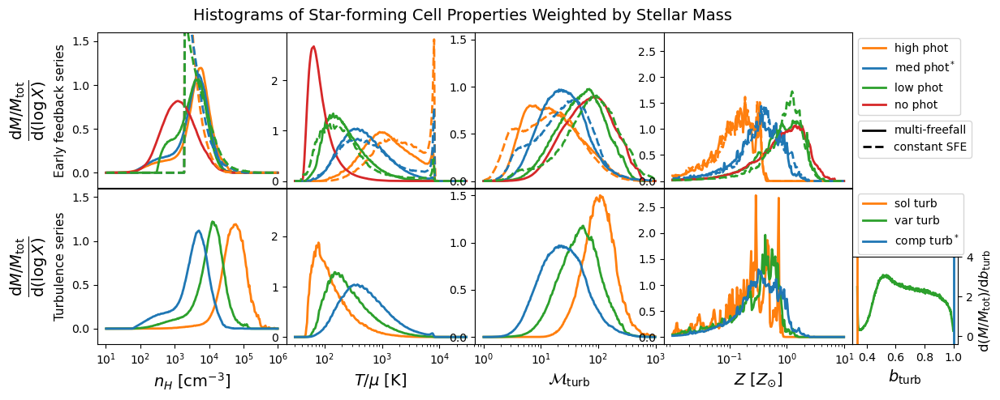

In [3]:
fig, axs = plt.subplots(figsize=(12, 5), nrows=2, ncols=4, sharex='col', sharey='col')
plt.subplots_adjust(wspace=1e-3, hspace=1e-3)

sim_list_list = [[(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")], [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]]
label_list_list = [[r"high phot", r"med phot$^*$", r"low phot", "no phot", None, None, None], [r"sol turb", r"var turb", r"comp turb$^*$"]]
color_list_list = [["C1", "C0", "C2", "C3", "C1", "C0", "C2"], ["C1", "C2", "C0"]]
linestyle_list_list = [["-"]*4+["--"]*3, ["-"]*3]

for i in range(2):
    
    sim_list, label_list, color_list, linestyle_list = sim_list_list[i], label_list_list[i], color_list_list[i], linestyle_list_list[i]
    
    for j in range(4):
        
        ax = axs[i, j]
        ax.set_xscale('log')
        if j==0: ax.set_ylabel(r'$\frac{{\rm d} M/M_{\rm tot}}{{\rm d}(\log X)}$', fontsize=20, labelpad=20)
        #ax.set_yticks([0, 1]) #if j==0 else ax.set_yticks([])
        
    for j in range(len(label_list)):
    
        sim_round, sim_name = sim_list[j]
        move_to_sim_dir(sim_round, sim_name, do_print=False)
        sim_latex = sim_name_to_latex[sim_name]
        data = SimpleNamespace(**np.load('starcat/data.npz'))

        axs[i, 0].plot(data.nH1d, data.nH_pdf1d, color=color_list[j], linestyle=linestyle_list[j], lw=2)
        axs[i, 1].plot(data.temp1d, data.temp_pdf1d, color=color_list[j], linestyle=linestyle_list[j], lw=2)
        axs[i, 2].plot(data.mach_turb1d, data.mach_turb_pdf1d, color=color_list[j], linestyle=linestyle_list[j], lw=2)
        axs[i, 3].plot(data.metallicity1d/const.Z_sol, data.metallicity_pdf1d, color=color_list[j], linestyle=linestyle_list[j], lw=2)

axs[1, 0].set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
axs[1, 1].set_xlabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
axs[1, 2].set_xlabel(r'$\mathcal{M}_{\rm turb}$', fontsize=14)
axs[1, 3].set_xlabel(r'$Z$ [$Z_{\odot}$]', fontsize=14)
        
axs[0, 0].set_ylim(None, 1.6);
# axs[0, 1].set_ylim(None, 3.4);
#axs[0, 3].set_ylim(None, 2.3);
axs[1, 0].set_xticks([1e1, 1e2, 1e3, 1e4, 1e5, 1e6]);
axs[1, 3].set_xticks([1e-1, 1e0, 1e1]);

axs[0, 0].annotate('Early feedback series', (-0.23, 0.5), xycoords='axes fraction', fontsize=11, rotation=90, verticalalignment='center')
axs[1, 0].annotate('Turbulence series', (-0.23, 0.5), xycoords='axes fraction', fontsize=11, rotation=90, verticalalignment='center')

cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C0", "C2", "C3"]]
axs[0, 3].legend(cust_lines, label_list_list[0], fontsize=10, loc=2, bbox_to_anchor=(1, 1))
cust_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]
axs[0, 2].legend(cust_lines, ['multi-freefall', 'constant SFE'], fontsize=10, loc=2, bbox_to_anchor=(2, 0.47))
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[1, 3].legend(cust_lines, label_list_list[1], fontsize=10, loc=2, bbox_to_anchor=(1, 1))

sim_dir = move_to_sim_dir(9, "bturbfunc")
data = SimpleNamespace(**np.load('starcat/data.npz'))
axin = axs[1, 3].inset_axes([1., 0., 0.56, 0.56], xticks=[0.4, 0.6, 0.8, 1.0])
axin.plot(data.b_turb1d, data.b_turb_hist1d/1e10/const.M_sol, lw=2, color='C2')
axin.axvline(x=1., color='C0', lw=2)
axin.axvline(x=1/3, color='C1', lw=2)
axin.set_xlabel(r"$b_{\rm turb}$", fontsize=14)
axin.yaxis.tick_right()
axin.yaxis.set_label_position('right')
axin.set_ylabel(r'${\rm d}(M/M_{\rm tot})/{\rm d}b_{\rm turb}$', fontsize=12)
axin.set_ylim(-0.4, 4)

plt.suptitle('Histograms of Star-forming Cell Properties Weighted by Stellar Mass', fontsize=14, y=0.94)

# save_fig('mstarhist')
        

Moving to directory '/home/za9132/scratch/romain/round9/bturbfunc'.


Text(0.5, 0.94, 'Histograms of SNe-Hosting Cell Properties Weighted by SNe Number')

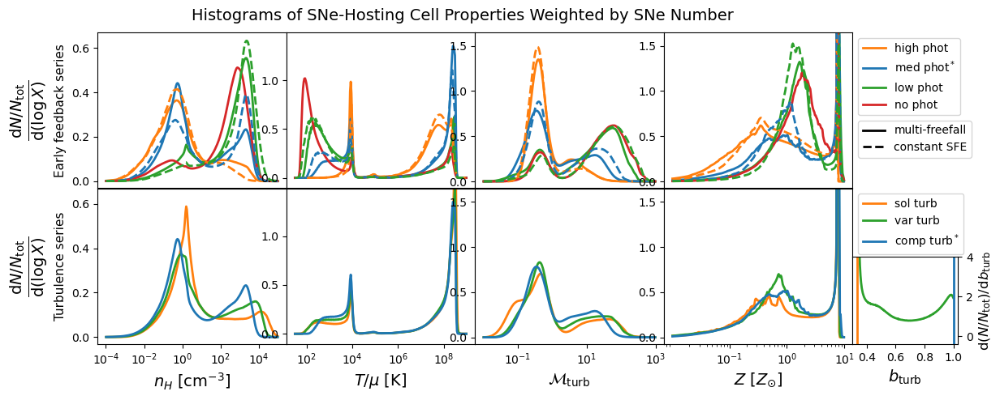

In [4]:
fig, axs = plt.subplots(figsize=(12, 5), nrows=2, ncols=4, sharex='col', sharey='col')
plt.subplots_adjust(wspace=1e-3, hspace=1e-3)

sim_list_list = [[(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")], [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]]
label_list_list = [[r"high phot", r"med phot$^*$", r"low phot", "no phot", None, None, None], [r"sol turb", r"var turb", r"comp turb$^*$"]]
color_list_list = [["C1", "C0", "C2", "C3", "C1", "C0", "C2"], ["C1", "C2", "C0"]]
linestyle_list_list = [["-"]*4+["--"]*3, ["-"]*3]

for i in range(2):
    
    sim_list, label_list, color_list, linestyle_list = sim_list_list[i], label_list_list[i], color_list_list[i], linestyle_list_list[i]
    
    for j in range(4):
        
        ax = axs[i, j]
        ax.set_xscale('log')
        if j==0: ax.set_ylabel(r'$\frac{{\rm d} N/N_{\rm tot}}{{\rm d}(\log X)}$', fontsize=20, labelpad=20)
        #ax.set_yticks([0]) if j==0 else ax.set_yticks([])
        
    for j in range(len(label_list)):
    
        sim_round, sim_name = sim_list[j]
        move_to_sim_dir(sim_round, sim_name, do_print=False)
        sim_latex = sim_name_to_latex[sim_name]
        data = SimpleNamespace(**np.load('starcat/data.npz'))

        axs[i, 0].plot(data.nH1d_death, data.nH_pdf1d_death, color=color_list[j], linestyle=linestyle_list[j], lw=2)
        axs[i, 1].plot(data.temp1d_death, data.temp_pdf1d_death, color=color_list[j], linestyle=linestyle_list[j], lw=2)
        axs[i, 2].plot(data.mach_turb1d_death, data.mach_turb_pdf1d_death, color=color_list[j], linestyle=linestyle_list[j], lw=2)
        axs[i, 3].plot(data.metallicity1d_death/const.Z_sol, data.metallicity_pdf1d_death, color=color_list[j], linestyle=linestyle_list[j], lw=2)

axs[1, 0].set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
axs[1, 1].set_xlabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
axs[1, 2].set_xlabel(r'$\mathcal{M}_{\rm turb}$', fontsize=14)
axs[1, 3].set_xlabel(r'$Z$ [$Z_{\odot}$]', fontsize=14)
        
axs[0, 0].set_ylim(None, 0.67);
axs[0, 1].set_ylim(None, 1.49);
axs[0, 2].set_ylim(None, 1.65);
axs[0, 3].set_ylim(-0.075, 1.65);
axs[1, 0].set_xticks([1e-4, 1e-2, 1e0, 1e2, 1e4]);
axs[1, 1].set_xticks([1e2, 1e4, 1e6, 1e8]);
axs[1, 3].set_xticks([1e-1, 1e0, 1e1]);

axs[0, 0].annotate('Early feedback series', (-0.23, 0.5), xycoords='axes fraction', fontsize=11, rotation=90, verticalalignment='center')
axs[1, 0].annotate('Turbulence series', (-0.23, 0.5), xycoords='axes fraction', fontsize=11, rotation=90, verticalalignment='center')

cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C0", "C2", "C3"]]
axs[0, 3].legend(cust_lines, label_list_list[0], fontsize=10, loc=2, bbox_to_anchor=(1, 1))
cust_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]
axs[0, 2].legend(cust_lines, ['multi-freefall', 'constant SFE'], fontsize=10, loc=2, bbox_to_anchor=(2, 0.47))
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[1, 3].legend(cust_lines, label_list_list[1], fontsize=10, loc=2, bbox_to_anchor=(1, 1))

sim_dir = move_to_sim_dir(9, "bturbfunc")
data = SimpleNamespace(**np.load('starcat/data.npz'))
axin = axs[1, 3].inset_axes([1., 0., 0.56, 0.56], xticks=[0.4, 0.6, 0.8, 1.0])
axin.plot(data.b_turb1d_death, data.b_turb_pdf1d_death, lw=2, color='C2')
axin.axvline(x=1., color='C0', lw=2)
axin.axvline(x=1/3, color='C1', lw=2)
axin.set_xlabel(r"$b_{\rm turb}$", fontsize=14)
axin.yaxis.tick_right()
axin.yaxis.set_label_position('right')
axin.set_ylabel(r'${\rm d}(N/N_{\rm tot})/{\rm d}b_{\rm turb}$', fontsize=12)
axin.set_ylim(-0.4, 4)

plt.suptitle('Histograms of SNe-Hosting Cell Properties Weighted by SNe Number', fontsize=14, y=0.94)

#save_fig('nsnehist')


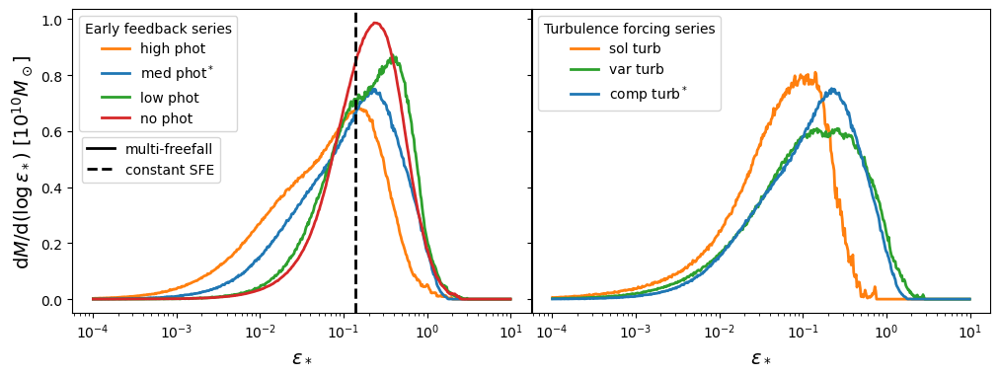

In [5]:
fig, axs = plt.subplots(figsize=(12, 4), ncols=2, sharey=True)
plt.subplots_adjust(hspace=1e-3, wspace=1e-3)

sim_list_list = [[(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot")], [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]]
label_list_list = [[r"high phot", r"med phot$^*$", r"low phot", "no phot"], [r"sol turb", r"var turb", r"comp turb$^*$"]]
color_list_list = [["C1", "C0", "C2", "C3"], ["C1", "C2", "C0"]]

axs[0].set_xscale('log')
axs[1].set_xscale('log')

for i in range(2):
    
    sim_list, label_list, color_list = sim_list_list[i], label_list_list[i], color_list_list[i]
    ax = axs[i]
    
    for j in range(len(label_list)):
    
        sim_round, sim_name = sim_list[j]
        sim_dir = move_to_sim_dir(sim_round, sim_name, do_print=False)
        data = SimpleNamespace(**np.load('starcat/data.npz'))

        ax.plot(data.eps_sf1d, data.eps_sf_pdf1d, lw=2, color=color_list[j])

axs[0].axvline(x=0.1371535430985907, color='black', linestyle='--', lw=2)
axs[0].set_xlabel(r'$\epsilon_*$', fontsize=14)
axs[1].set_xlabel(r'$\epsilon_*$', fontsize=14)
axs[0].set_ylabel(r'${\rm d}M/{\rm d}(\log \epsilon_*)$ [$10^{10} M_\odot$]', fontsize=14)

cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C0", "C2", "C3"]]
legend1 = axs[0].legend(cust_lines, label_list_list[0], fontsize=10, loc=2,  title='Early feedback series')
cust_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]
legend2 = axs[0].legend(cust_lines, ['multi-freefall', 'constant SFE'], fontsize=10, loc=(0.02, 0.43))
axs[0].add_artist(legend1)
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[1].legend(cust_lines, label_list_list[1], fontsize=10, loc=2,  title='Turbulence forcing series')

# save_fig('sfehist')
    

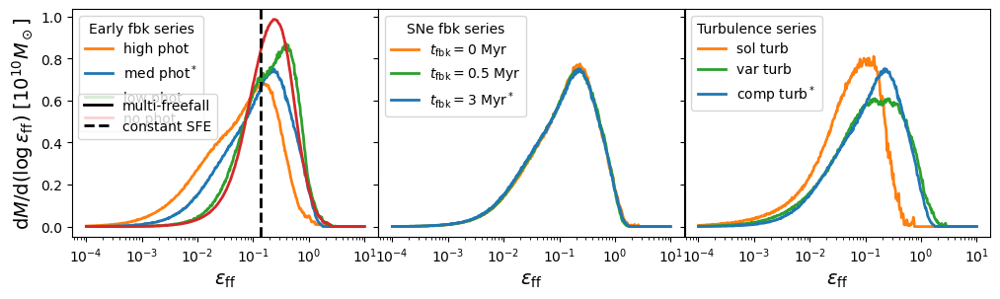

In [6]:
fig, axs = plt.subplots(figsize=(12, 3), ncols=3, sharey=True)
plt.subplots_adjust(hspace=1e-3, wspace=1e-3)

sim_list_list = [[(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot")], [(9, "instantfeedback"), (9, "fastfeedback"), (9, "fiducial")], [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]]
label_list_list = [[r"high phot", r"med phot$^*$", r"low phot", "no phot"], [r"$t_{\rm fbk} = 0~{\rm Myr}$", r"$t_{\rm fbk} = 0.5~{\rm Myr}$", r"$t_{\rm fbk} = 3~{\rm Myr}^*$"], [r"sol turb", r"var turb", r"comp turb$^*$"]]
color_list_list = [["C1", "C0", "C2", "C3"], ["C1", "C2", "C0"], ["C1", "C2", "C0"]]

axs[0].set_xscale('log')
axs[1].set_xscale('log')
axs[2].set_xscale('log')

for i in range(3):
    
    sim_list, label_list, color_list = sim_list_list[i], label_list_list[i], color_list_list[i]
    ax = axs[i]
    
    for j in range(len(label_list)):
    
        sim_round, sim_name = sim_list[j]
        sim_dir = move_to_sim_dir(sim_round, sim_name, do_print=False)
        data = SimpleNamespace(**np.load('starcat/data.npz'))

        ax.plot(data.eps_sf1d, data.eps_sf_pdf1d, lw=2, color=color_list[j])
        axs[i].set_xlabel(r'$\epsilon_{\rm ff}$', fontsize=14)
        
axs[0].set_ylabel(r'${\rm d}M/{\rm d}(\log \epsilon_{\rm ff})$ [$10^{10} M_\odot$]', fontsize=14)
axs[0].axvline(x=0.1371535430985907, color='black', linestyle='--', lw=2)

cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C0", "C2", "C3"]]
legend1 = axs[0].legend(cust_lines, label_list_list[0], fontsize=10, loc=2,  title='Early fbk series')
cust_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]
legend2 = axs[0].legend(cust_lines, ['multi-freefall', 'constant SFE'], fontsize=10, loc=(0.02, 0.43))
axs[0].add_artist(legend1)
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[1].legend(cust_lines, label_list_list[1], fontsize=10, loc=2,  title='SNe fbk series')
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[2].legend(cust_lines, label_list_list[2], fontsize=10, loc=2,  title='Turbulence series')

# save_fig('sfehist')
    

NameError: name 'bin_list' is not defined

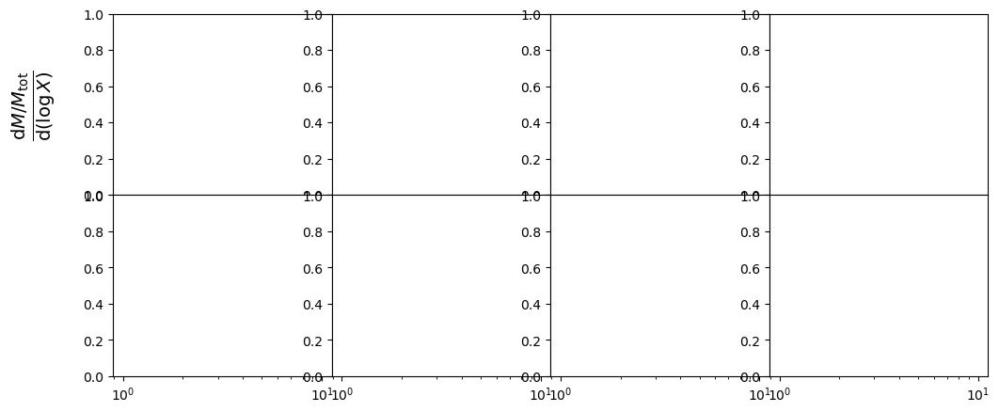

In [8]:
fig, axs = plt.subplots(figsize=(12, 5), nrows=2, ncols=4, sharex='col', sharey='col')
plt.subplots_adjust(wspace=1e-3, hspace=1e-3)

sim_list_list = [[(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")], [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]]
label_list_list = [[r"high phot", r"med phot$^*$", r"low phot", "no phot", None, None, None], [r"sol turb", r"var turb", r"comp turb$^*$"]]
color_list_list = [["C1", "C0", "C2", "C3", "C1", "C0", "C2"], ["C1", "C2", "C0"]]
linestyle_list_list = [["-"]*4+["--"]*3, ["-"]*3]

for i in range(2):
    
    sim_list, label_list, color_list, linestyle_list = sim_list_list[i], label_list_list[i], color_list_list[i], linestyle_list_list[i]
    
    for j in range(4):
        
        ax = axs[i, j]
        ax.set_xscale('log')
        if j==0: ax.set_ylabel(r'$\frac{{\rm d} M/M_{\rm tot}}{{\rm d}(\log X)}$', fontsize=20, labelpad=20)
        #ax.set_yticks([0]) if j==0 else ax.set_yticks([])
        
    for j in range(len(label_list)):
        
        for k in range(4):
            
            bin0 = bin_list[i][j][k]/const.Z_sol if k==3 else bin_list[i][j][k]
            axs[i, k].plot(bin0, hist_list[i][j][k], color=color_list[j], linestyle=linestyle_list[j], lw=2)

axs[1, 0].set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
axs[1, 1].set_xlabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
axs[1, 2].set_xlabel(r'$\mathcal{M}_{\rm turb}$', fontsize=14)
axs[1, 3].set_xlabel(r'$Z$ [$Z_{\odot}$]', fontsize=14)
        
axs[0, 0].set_ylim(None, 0.6);
axs[0, 3].set_ylim(None, 3.4);
axs[1, 0].set_xticks([1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3, 1e4]);
axs[1, 3].set_xticks([1e-1, 1e0, 1e1]);

axs[0, 0].annotate('Early feedback series', (-0.23, 0.5), xycoords='axes fraction', fontsize=11, rotation=90, verticalalignment='center')
axs[1, 0].annotate('Turbulence series', (-0.23, 0.5), xycoords='axes fraction', fontsize=11, rotation=90, verticalalignment='center')

cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C0", "C2", "C3"]]
axs[0, 3].legend(cust_lines, label_list_list[0], fontsize=10, loc=2, bbox_to_anchor=(1, 1))
cust_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]
axs[0, 2].legend(cust_lines, ['multi-freefall', 'constant SFE'], fontsize=10, loc=2, bbox_to_anchor=(2, 0.47))
cust_lines = [Line2D([0], [0], color=color, lw=2) for color in ["C1", "C2", "C0"]]
axs[1, 3].legend(cust_lines, label_list_list[1], fontsize=10, loc=2, bbox_to_anchor=(1, 1))

sim_dir = move_to_sim_dir(9, "bturbfunc")
data = SimpleNamespace(**np.load('starcat/data.npz'))
axin = axs[1, 3].inset_axes([1., 0., 0.56, 0.56], xticks=[0.4, 0.6, 0.8, 1.0])
axin.plot(bin_list[1][1][4], hist_list[1][1][4], lw=2, color='C2')
axin.axvline(x=1., color='C0', lw=2)
axin.axvline(x=1/3, color='C1', lw=2)
axin.set_xlabel(r"$b_{\rm turb}$", fontsize=14)
axin.yaxis.tick_right()
axin.yaxis.set_label_position('right')
axin.set_ylabel(r'${\rm d}(M/M_{\rm tot})/{\rm d}b_{\rm turb}$', fontsize=12)
axin.set_ylim(-0.4, 4)

plt.suptitle('Histograms of Gas Properties Weighted by Gas Mass', fontsize=14, y=0.94)

# save_fig('mgashist')
    

In [2]:
# observation

Fujimotop23a = SimpleNamespace(
    link = "https://arxiv.org/pdf/2301.09482.pdf",
    survey = "CEERS",
    obj = np.array(["CEERS1_3858", "CEERS1_3908", "CEERS1_3910", "CEERS1_6059", "CEERS3_1748", "CEERS6_7603", "CEERS6_7641"]),
    z = np.array([8.807, 8.005, 7.9932, 8.876, 7.769, 8.8805, 8.9980]),
    Mstar = np.array([1.2e8, 2.0e8, 8.7e8, 1.2e8, 30.6e8, 0.2e8, 0.6e8]),
    _Mstarp = np.array([0.8e8, 1.7e8, 6.3e8, 0.9e8, 19.7e8, 0.2e8, 0.6e8]),
    _Mstarm = np.array([0.6e8, 0.8e8, 4.4e8, 0.6e8, 13.0e8, 0.1e8, 0.3e8])  
)

Fujimotop23b = SimpleNamespace(
    link = "https://arxiv.org/pdf/2308.11609.pdf",
    survey = "UNCOVER",
    obj = np.array(["20466", "10646", "3686", "22223", "31028", "13151", "26185", "37126"]),
    z = np.array([8.5, 8.511, 9.325, 9.568, 9.74, 9.88, 10.071, 10.255])
)

Wangp23 = SimpleNamespace(
    link = "https://arxiv.org/pdf/2308.03745.pdf",
    survey = "UNCOVER",
    obj = np.array(["38766", "13077"]),
    z = np.array([12.393, 13.079]),
    Mstar = 10**np.array([8.35, 8.13]),
    _Mstarp = np.log(10)*10**np.array([8.35, 8.13])*np.array([0.18, 0.11]),
    _Mstarm = np.log(10)*10**np.array([8.35, 8.13])*np.array([0.14, 0.15]),
    Z = 10**np.array([-1.34, -1.57]),
    _Zp = np.log(10)*10**np.array([-1.34, -1.57])*np.array([0.6, 0.35]),
    _Zm = np.log(10)*10**np.array([-1.34, -1.57])*np.array([0.42, 0.28]),
    SFR = np.array([2.15, 1.28]),
    _SFRp = np.array([0.81, 0.27]),
    _SFRm = np.array([0.46, 0.18])
)

CurtisLakep23 = SimpleNamespace(
    link = "https://arxiv.org/pdf/2212.04568.pdf",
    survey = "JADES",
    obj = np.array(["GS-z10-0", "GS-z11-0", "GS-z12-0", "GS-z13-0"]),
    z = np.array([10.38, 11.58, 12.63, 13.2]),
    Mstar = 10**np.array([7.58, 8.67, 7.64, 7.95]),
    _Mstarp = np.log(10)*10**np.array([7.58, 8.67, 7.64, 7.95])*np.array([0.19, 0.08, 0.66, 0.19]),
    _Mstarm = np.log(10)*10**np.array([7.58, 8.67, 7.64, 7.95])*np.array([0.20, 0.13, 0.39, 0.29]),
    Z = 10**np.array([-1.91, -1.87, -1.44, -1.69]),
    _Zp = np.log(10)*10**np.array([-1.91, -1.87, -1.44, -1.69])*np.array([0.25, 0.28, 0.23, 0.28]),
    _Zm = np.log(10)*10**np.array([-1.91, -1.87, -1.44, -1.69])*np.array([0.2, 0.18, 0.22, 0.31])
)

Harikanep23 = SimpleNamespace(
    link = "https://arxiv.org/pdf/2304.06658.pdf",
    obj = np.array(["GS-z13-0", "GS-z12-0", "GS-z11-0", "Maisie's Galaxy", "CEERS2_588", "GS-z10-0", "CEERS2_7929", "CEERS-24", "CEERS-23", "CEERS1_6059", "CEERS1_3868"]),
    z = np.array([13.8, 12.63, 11.58, 11.4, 11.04, 10.38, 10.1, 8.998, 8.881, 8.876, 8.807]),
    Mstar = np.array([5.1e7, 4.3e8, 1.2e9, 6.1e7, 9.9e8, 2.0e8, 4.6e8, 9.8e7, 7.6e7, 9.6e8, 2.3e8]),
    _Mstarp = np.array([21.2e7, 1.8e8, 0.1e9, 23.5e7, 23.9e8, 0.6e8, 5.5e8, 51.2e7, 50.4e7, 1.7e8, 2.7e8]),
    _Mstarm = np.array([1.2e7, 2.0e8, 0.3e9, 1.4e7, 4.0e8, 0.4e8, 1.7e8, 0.1e7, 1.5e7, 2.1e8, 0.3e8]),
    SFR = np.array([0.5, 0.5, 1.8, 0.8, 12.7, 1.6, 5.9, 1.9, 1.1, 8.8, 3.6]),
    _SFRp = np.array([0.7, 1.3, 0.4, 2.1, 9.7, 0.6, 1.6, 1.9, 2.9, 2.4, 1.9]),
    _SFRm = np.array([0.1, 0.1, 0.5, 0.1, 4.9, 0.2, 2.6, 0.4, 0.3, 2.1, 0.4])
)

# simulation

Katzp23 = SimpleNamespace(
    link = "https://arxiv.org/pdf/2309.03269.pdf",
    z = np.array([10, 9, 8, 7, 6, 5, 4.6]),
    Mstar_max = 10**np.array([8.56, 8.72, 9.25, 9.65, 9.93, 10.46, 10.63]),
    Mstar_med = 10**np.array([7.38, 7.52, 7.62, 7.87, 8.07, 8.27, 8.40]),
    Mhalo_max = 10**np.array([10.2, 10.48, 10.75, 10.91, 11.12, 11.64, 11.70]),
    Mhalo_med = 10**np.array([9.3, 9.44, 9.55, 9.69, 9.89, 10.0, 10.07])
)


In [4]:
def calc_SFR(z, Mhalo):
    '''
    Star formation rate predicted by UniverseMachine.
    Best fit parameters come from Appendix H of Behroozi+2019 (https://arxiv.org/pdf/1806.07893.pdf).
    Application to high-z galaxies discussed in Behroozi+2020 (https://arxiv.org/pdf/2007.04988.pdf).
    
    Args
    z: redshift
    Mhalo: halo mass
    '''
    aexp = 1/(1+z)
    logV = 2.151-1.658*(1-aexp)+1.68*np.log(1+z)-0.233*z
    logeps = 0.109-3.441*(1-aexp)+5.079*np.log(1+z)-0.781*z
    alpha = -5.598-20.731*(1-aexp)+13.455*np.log(1+z)-1.321*z
    beta = -1.911+0.395*(1-aexp)+0.747*z
    loggamma = -1.699+4.206*(1-aexp)-0.809*z
    delta = 0.055
    
    M200kms = 1.64e12*const.M_sol/((aexp/0.378)**(-0.142)+(aexp/0.378)**(-1.79))
    vMpeak = 200*const.km*(Mhalo/M200kms)**(1/3)
    v = vMpeak/(10**logV*const.km)
    SFR = 10**logeps*((v**alpha+v**beta)**(-1)+10**loggamma*np.exp(-np.log10(v)**2/(2*delta**2)))
    
    return SFR

calc_SFR(9, 1e11*const.M_sol)


5.913245364508642

In [5]:
M_list = np.logspace(11, 16, 2048)*cosmo.h
dndlnM = mass_function.massFunction(M_list, 9., q_in='M', q_out='dndlnM')
num = trapz(-dndlnM[::-1], np.log(M_list)[::-1])
vol = 100**3

num*vol


71.64324892383672

In [6]:
sim = Sim(9, "fiducial", "data_d45_l1_b5.npz")


Moving to directory '/home/za9132/scratch/romain/round9/fiducial'.


In [7]:
num = 256
var_list = [sim.n_H, sim.temp, sim.mach_turb, sim.metallicity]
bound_list = [(1e-2, 1e4), (3e1, 3e4), (1e-1, 1e2), (1e-2*const.Z_sol, 1e1*const.Z_sol)]
bin1_list, bin2_list, bin1d_list = np.zeros((4, 4, num)), np.zeros((4, 4, num)), np.zeros((4, num))
hist_list, hist1d_list = np.zeros((4, 4, num, num)), np.zeros((4, num))
for i in range(4):
    for j in range(4):
        if i > j:
            bin1_list[i, j], bin2_list[i, j], hist_list[i, j] = calc_hist2d(var_list[j], var_list[i], bound_list[j][0], bound_list[j][1], bound_list[i][0], bound_list[i][1], weight=(sim.density*sim.dV/const.M_sol), nbin=num)
            if i==3: bin2_list[i, j]/=const.Z_sol
            if j==3: bin1_list[i, j]/=const.Z_sol   
        elif i == j:
            bin1d_list[i], hist1d_list[i] = calc_hist1d(var_list[i], bound_list[i][0], bound_list[i][1], weight=(sim.density*sim.dV/const.M_sol), nbin=num)
            if i==3: bin1d_list[i]/=const.Z_sol
        print("%d%d" % (i,j), end=', ')
        

00, 01, 02, 03, 10, 11, 12, 13, 20, 21, 22, 23, 30, 31, 32, 33, 

Text(0.55, 0.55, '$M_{\\rm gas}/{\\rm bin}$ [$M_\\odot$]')

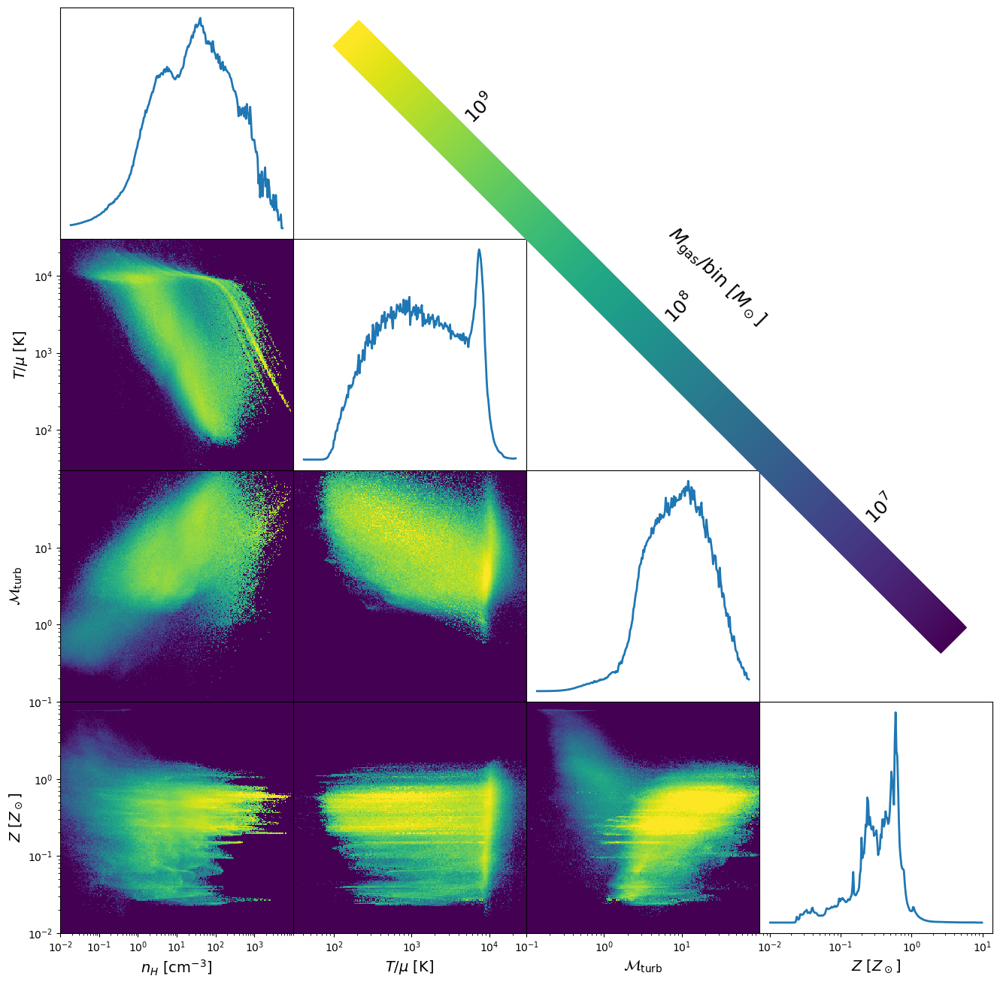

In [8]:
fig, axs = plt.subplots(figsize=(16, 16), nrows=4, ncols=4)
plt.subplots_adjust(wspace=1e-3, hspace=1e-3)

for i in range(4):
    for j in range(4):
        ax = axs[i, j]
        ax.set_xscale('log')
        if i > j:
            ax.set_yscale('log')
            im = ax.pcolormesh(bin1_list[i, j], bin2_list[i, j], np.log10(hist_list[i, j]+const.small).T, vmin=6.5, vmax=9.5)
        elif i < j:
            ax.set_axis_off()
        elif i == j:
            ax.plot(bin1d_list[i], hist1d_list[i], lw=2)
        if i < 3: ax.set_xticks([]); ax.tick_params(axis='x', which='minor', bottom=False)
        if j > 0 or (i==0 and j==0): ax.set_yticks([]); ax.tick_params(axis='y', which='minor', left=False)
        
axs[3, 0].set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
axs[3, 1].set_xlabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
axs[3, 2].set_xlabel(r'$\mathcal{M}_{\rm turb}$', fontsize=14)
axs[3, 3].set_xlabel(r'$Z$ [$Z_\odot$]', fontsize=14)
axs[1, 0].set_ylabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
axs[2, 0].set_ylabel(r'$\mathcal{M}_{\rm turb}$', fontsize=14)
axs[3, 0].set_ylabel(r'$Z$ [$Z_\odot$]', fontsize=14)

num_color = 256
cmap = plt.colormaps["viridis"](np.linspace(0, 1, num_color))
for i in range(num_color):    
    fig.patches.extend([plt.Rectangle((0.85-0.5*i/num_color, 0.35+0.5*i/num_color), 0.01, 0.03, angle=-45, color=cmap[i], transform=fig.transFigure, figure=fig)])
for i, label in enumerate([7, 8, 9]):
    plt.annotate(r'$10^%d$'%label, (0.80-(2*i+1)/12, 0.30+(2*i+1)/12), xycoords="figure fraction", rotation=45, fontsize=18)
plt.annotate(r'$M_{\rm gas}/{\rm bin}$ [$M_\odot$]', (0.55, 0.55), xycoords="figure fraction", rotation=-45, fontsize=18)
    

In [3]:
sim_dir = move_to_sim_dir(9, 'fiducial')
data = SimpleNamespace(**np.load('starcat/data.npz'))
data.SFR = data.starmass_hist1d

Moving to directory '/home/za9132/scratch/romain/round9/fiducial'.


Text(0.55, 0.55, '$M_{\\rm star}/{\\rm bin}$ [$M_\\odot$]')

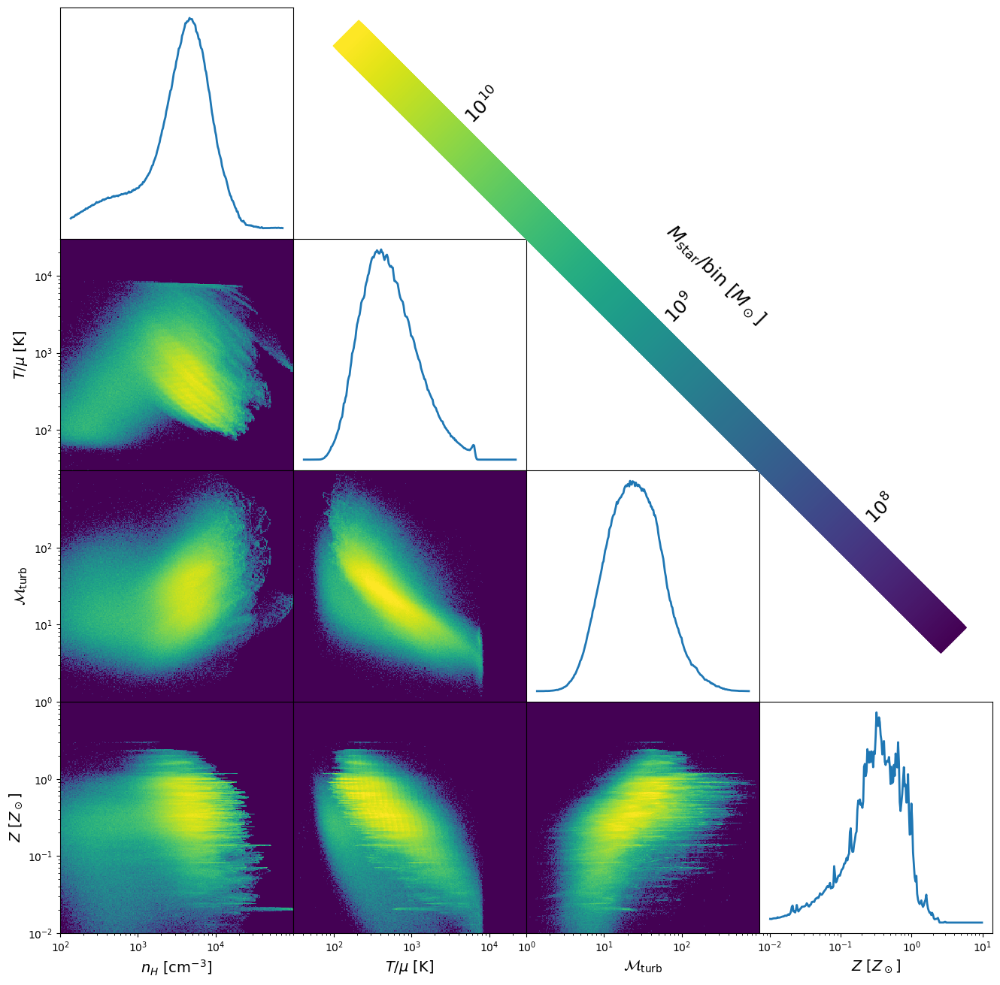

In [4]:
fig, axs = plt.subplots(figsize=(16, 16), nrows=4, ncols=4)
plt.subplots_adjust(wspace=1e-3, hspace=1e-3)

for i in range(4):
    for j in range(4):
        ax = axs[i, j]
        ax.set_xscale('log')
        if i > j: ax.set_yscale('log')
        if i < j: ax.set_axis_off()
        if i < 3: ax.set_xticks([]); ax.tick_params(axis='x', which='minor', bottom=False)
        if j > 0 or (i==0 and j==0): ax.set_yticks([]); ax.tick_params(axis='y', which='minor', left=False)

vmin, vmax = 7.5, 10.5
axs[1, 0].pcolormesh(data.nH2d, data.temp2d, np.log10(data.nH_temp_hist2d/const.M_sol+const.small).T, vmin=vmin, vmax=vmax)
axs[2, 0].pcolormesh(data.nH2d, data.mach_turb2d, np.log10(data.nH_mach_turb_hist2d/const.M_sol+const.small).T, vmin=vmin, vmax=vmax)
axs[3, 0].pcolormesh(data.nH2d, data.metallicity2d/const.Z_sol, np.log10(data.nH_metallicity_hist2d/const.M_sol+const.small).T, vmin=vmin, vmax=vmax)
axs[2, 1].pcolormesh(data.temp2d, data.mach_turb2d, np.log10(data.temp_mach_turb_hist2d/const.M_sol+const.small).T, vmin=vmin, vmax=vmax)
axs[3, 1].pcolormesh(data.temp2d, data.metallicity2d/const.Z_sol, np.log10(data.temp_metallicity_hist2d/const.M_sol+const.small).T, vmin=vmin, vmax=vmax)
axs[3, 2].pcolormesh(data.mach_turb2d, data.metallicity2d/const.Z_sol, np.log10(data.mach_turb_metallicity_hist2d/const.M_sol+const.small).T, vmin=vmin, vmax=vmax)

axs[0, 0].plot(data.nH1d, data.nH_hist1d, lw=2)
axs[1, 1].plot(data.temp1d, data.temp_hist1d, lw=2)
axs[2, 2].plot(data.mach_turb1d, data.mach_turb_hist1d, lw=2)
axs[3, 3].plot(data.metallicity1d/const.Z_sol, data.metallicity_hist1d, lw=2)

axs[3, 0].set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
axs[3, 1].set_xlabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
axs[3, 2].set_xlabel(r'$\mathcal{M}_{\rm turb}$', fontsize=14)
axs[3, 3].set_xlabel(r'$Z$ [$Z_\odot$]', fontsize=14)
axs[1, 0].set_ylabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
axs[2, 0].set_ylabel(r'$\mathcal{M}_{\rm turb}$', fontsize=14)
axs[3, 0].set_ylabel(r'$Z$ [$Z_\odot$]', fontsize=14)

num_color = 256
cmap = plt.colormaps["viridis"](np.linspace(0, 1, num_color))
for i in range(num_color):    
    fig.patches.extend([plt.Rectangle((0.85-0.5*i/num_color, 0.35+0.5*i/num_color), 0.01, 0.03, angle=-45, color=cmap[i], transform=fig.transFigure, figure=fig)])
for i, label in enumerate([8, 9, 10]):
    plt.annotate(r'$10^{%d}$'%label, (0.80-(2*i+1)/12, 0.30+(2*i+1)/12), xycoords="figure fraction", rotation=45, fontsize=18)
plt.annotate(r'$M_{\rm star}/{\rm bin}$ [$M_\odot$]', (0.55, 0.55), xycoords="figure fraction", rotation=-45, fontsize=18)
    



Moving to directory '/home/za9132/scratch/romain/round9/mstar0p2'.
Moving to directory '/home/za9132/scratch/romain/round9/fiducial'.
Moving to directory '/home/za9132/scratch/romain/round9/mstar5p0'.
Moving to directory '/home/za9132/scratch/romain/round12/nophot'.
Moving to directory '/home/za9132/scratch/romain/round11/mstar0p2'.
Moving to directory '/home/za9132/scratch/romain/round11/mstar1p0'.
Moving to directory '/home/za9132/scratch/romain/round11/mstar5p0'.


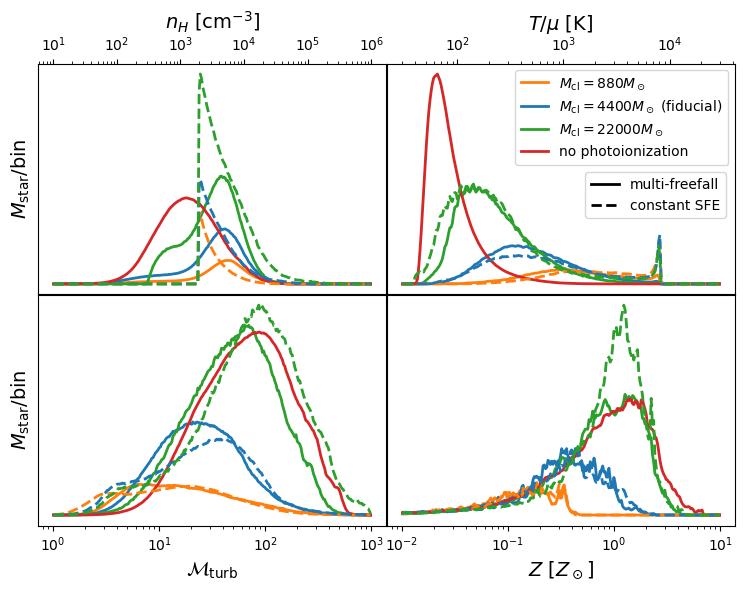

In [3]:
fig, axs = plt.subplots(figsize=(9, 6), nrows=2, ncols=2)
plt.subplots_adjust(wspace=1e-3, hspace=1e-3)

for j in range(2):
    for i in range(2):
        ax = axs[j, i]
        ax.set_xscale('log')
        if i==0: ax.set_ylabel(r'$M_{\rm star}/{\rm bin}$', fontsize=14)
        ax.set_yticks([])
        if j==0: 
            ax.xaxis.tick_top()
            ax.xaxis.set_label_position('top')
        if i==1:
            ax.yaxis.tick_right()
            ax.yaxis.set_label_position('right')

sim_list = [(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")]
color_list = ["C1", "C0", "C2", "C3", "C1", "C0", "C2"] 
linestyle_list = ["-"]*4+["--"]*3
label_list = [r"$M_{\rm cl} = 880 M_\odot$", r"$M_{\rm cl} = 4400 M_\odot$ (fiducial)", r"$M_{\rm cl} = 22000 M_\odot$", "no photoionization"]
    
for i in range(len(sim_list)):
    
    sim_round, sim_name = sim_list[i]
    sim_dir = move_to_sim_dir(sim_round, sim_name)
    data = SimpleNamespace(**np.load('starcat/data.npz'))

    color, linestyle = color_list[i], linestyle_list[i]
    axs[0, 0].plot(data.nH1d, data.nH_hist1d/1e10/const.M_sol, lw=2, color=color, linestyle=linestyle)
    axs[0, 1].plot(data.temp1d, data.temp_hist1d/1e10/const.M_sol, lw=2, color=color, linestyle=linestyle)
    axs[1, 0].plot(data.mach_turb1d, data.mach_turb_hist1d/1e10/const.M_sol, lw=2, color=color, linestyle=linestyle)
    axs[1, 1].plot(data.metallicity1d/const.Z_sol, data.metallicity_hist1d/1e10/const.M_sol, lw=2, color=color, linestyle=linestyle)
            
axs[0, 0].set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
axs[0, 1].set_xlabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
axs[1, 0].set_xlabel(r'$\mathcal{M}_{\rm turb}$', fontsize=14)
axs[1, 1].set_xlabel(r'$Z$ [$Z_\odot$]', fontsize=14)

color_lines = [Line2D([0], [0], color=color, lw=2, linestyle='-') for color in color_list]
linestyle_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]
legend1 = axs[0, 1].legend(color_lines, label_list, fontsize=10, loc=1)
legend2 = axs[0, 1].legend(linestyle_lines, ['multi-freefall', 'constant SFE'], fontsize=10, loc=(0.57, 0.33))
axs[0, 1].add_artist(legend1)

#save_fig('mstar_fbk')


Moving to directory '/home/za9132/scratch/romain/round9/mstar0p2'.
Moving to directory '/home/za9132/scratch/romain/round9/fiducial'.
Moving to directory '/home/za9132/scratch/romain/round9/mstar5p0'.
Moving to directory '/home/za9132/scratch/romain/round12/nophot'.
Moving to directory '/home/za9132/scratch/romain/round11/mstar0p2'.
Moving to directory '/home/za9132/scratch/romain/round11/mstar1p0'.
Moving to directory '/home/za9132/scratch/romain/round11/mstar5p0'.


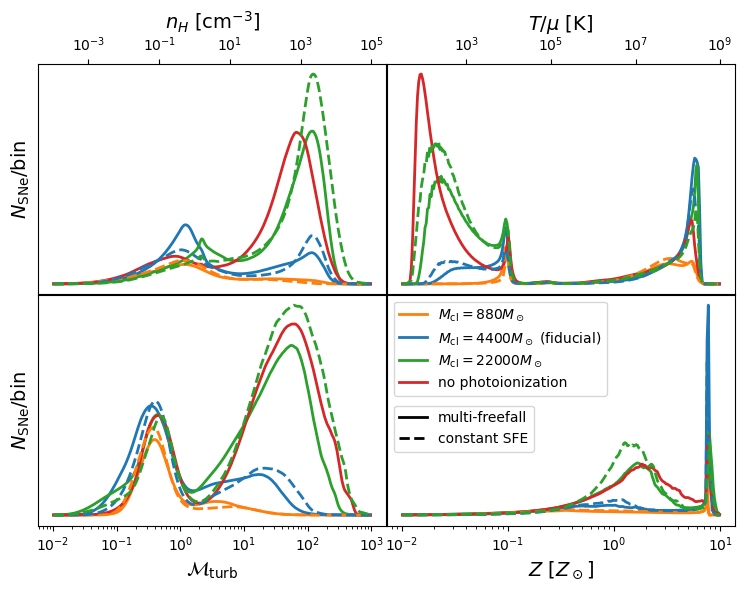

In [4]:
fig, axs = plt.subplots(figsize=(9, 6), nrows=2, ncols=2)
plt.subplots_adjust(wspace=1e-3, hspace=1e-3)

for j in range(2):
    for i in range(2):
        ax = axs[j, i]
        ax.set_xscale('log')
        if i==0: ax.set_ylabel(r'$N_{\rm SNe}/{\rm bin}$', fontsize=14)
        ax.set_yticks([])
        if j==0: 
            ax.xaxis.tick_top()
            ax.xaxis.set_label_position('top')
        if i==1:
            ax.yaxis.tick_right()
            ax.yaxis.set_label_position('right')

sim_list = [(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")]
color_list = ["C1", "C0", "C2", "C3", "C1", "C0", "C2"] 
linestyle_list = ["-"]*4+["--"]*3
label_list = [r"$M_{\rm cl} = 880 M_\odot$", r"$M_{\rm cl} = 4400 M_\odot$ (fiducial)", r"$M_{\rm cl} = 22000 M_\odot$", "no photoionization"]
    
for i in range(len(sim_list)):
    
    sim_round, sim_name = sim_list[i]
    sim_dir = move_to_sim_dir(sim_round, sim_name)
    data = SimpleNamespace(**np.load('starcat/data.npz'))

    color, linestyle = color_list[i], linestyle_list[i]
    axs[0, 0].plot(data.nH1d_death, data.nH_hist1d_death/1e8, lw=2, color=color, linestyle=linestyle)
    axs[0, 1].plot(data.temp1d_death, data.temp_hist1d_death/1e8, lw=2, color=color, linestyle=linestyle)
    axs[1, 0].plot(data.mach_turb1d_death, data.mach_turb_hist1d_death/1e8, lw=2, color=color, linestyle=linestyle)
    axs[1, 1].plot(data.metallicity1d_death/const.Z_sol, data.metallicity_hist1d_death/1e8, lw=2, color=color, linestyle=linestyle)
            
axs[0, 0].set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
axs[0, 1].set_xlabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
axs[1, 0].set_xlabel(r'$\mathcal{M}_{\rm turb}$', fontsize=14)
axs[1, 1].set_xlabel(r'$Z$ [$Z_\odot$]', fontsize=14)

color_lines = [Line2D([0], [0], color=color, lw=2, linestyle='-') for color in color_list]
linestyle_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]
legend1 = axs[1, 1].legend(color_lines, label_list, fontsize=10, loc=2)
legend2 = axs[1, 1].legend(linestyle_lines, ['multi-freefall', 'constant SFE'], fontsize=10, loc=(0.02, 0.32))
axs[1, 1].add_artist(legend1)

#save_fig('nsne_fbk')


Moving to directory '/home/za9132/scratch/romain/round9/bturb0p3'.
Moving to directory '/home/za9132/scratch/romain/round9/bturbfunc'.
Moving to directory '/home/za9132/scratch/romain/round9/fiducial'.
Moving to directory '/home/za9132/scratch/romain/round9/bturbfunc'.


Text(0, 0.5, '$M_{\\rm star}/{\\rm bin}$')

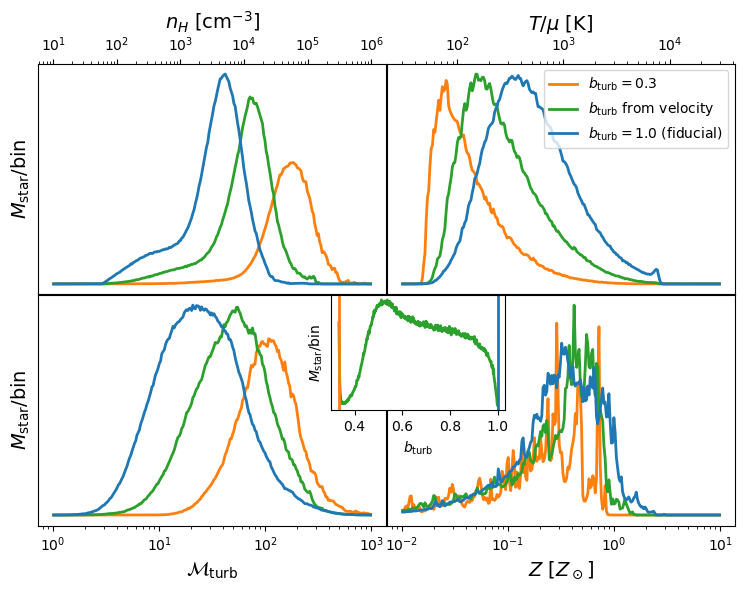

In [5]:
fig, axs = plt.subplots(figsize=(9, 6), nrows=2, ncols=2)
plt.subplots_adjust(wspace=1e-3, hspace=1e-3)

for j in range(2):
    for i in range(2):
        ax = axs[j, i]
        ax.set_xscale('log')
        if i==0: ax.set_ylabel(r'$M_{\rm star}/{\rm bin}$', fontsize=14)
        ax.set_yticks([])
        if j==0: 
            ax.xaxis.tick_top()
            ax.xaxis.set_label_position('top')
        if i==1:
            ax.yaxis.tick_right()
            ax.yaxis.set_label_position('right')

sim_list = [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]
color_list = ["C1", "C2", "C0"] 
linestyle_list = ["-"]*3
label_list = [r"$b_{\rm turb} = 0.3$", r"$b_{\rm turb}$ from velocity", r"$b_{\rm turb} = 1.0$ (fiducial)"]
   
for i in range(len(sim_list)):
    
    sim_round, sim_name = sim_list[i]
    sim_dir = move_to_sim_dir(sim_round, sim_name)
    data = SimpleNamespace(**np.load('starcat/data.npz'))

    color, linestyle = color_list[i], linestyle_list[i]
    axs[0, 0].plot(data.nH1d, data.nH_hist1d/1e10/const.M_sol, lw=2, color=color, linestyle=linestyle)
    axs[0, 1].plot(data.temp1d, data.temp_hist1d/1e10/const.M_sol, lw=2, color=color, linestyle=linestyle)
    axs[1, 0].plot(data.mach_turb1d, data.mach_turb_hist1d/1e10/const.M_sol, lw=2, color=color, linestyle=linestyle)
    axs[1, 1].plot(data.metallicity1d/const.Z_sol, data.metallicity_hist1d/1e10/const.M_sol, lw=2, color=color, linestyle=linestyle)
            
axs[0, 0].set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
axs[0, 1].set_xlabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
axs[1, 0].set_xlabel(r'$\mathcal{M}_{\rm turb}$', fontsize=14)
axs[1, 1].set_xlabel(r'$Z$ [$Z_\odot$]', fontsize=14)

color_lines = [Line2D([0], [0], color=color, lw=2, linestyle='-') for color in color_list]
axs[0, 1].legend(color_lines, label_list, fontsize=10, loc=1)

sim_dir = move_to_sim_dir(9, "bturbfunc")
data = SimpleNamespace(**np.load('starcat/data.npz'))
axin = axs[1, 1].inset_axes([-0.16, 0.5, 0.5, 0.5], yticks=[])
axin.plot(data.b_turb1d, data.b_turb_hist1d/1e10/const.M_sol, lw=2, color='C2')
axin.axvline(x=1., color='C0', lw=2)
axin.axvline(x=1/3, color='C1', lw=2)
axin.set_xlabel(r"$b_{\rm turb}$")
axin.set_ylabel(r'$M_{\rm star}/{\rm bin}$')

#save_fig('mstar_turb')


Moving to directory '/home/za9132/scratch/romain/round9/bturb0p3'.
Moving to directory '/home/za9132/scratch/romain/round9/bturbfunc'.
Moving to directory '/home/za9132/scratch/romain/round9/fiducial'.


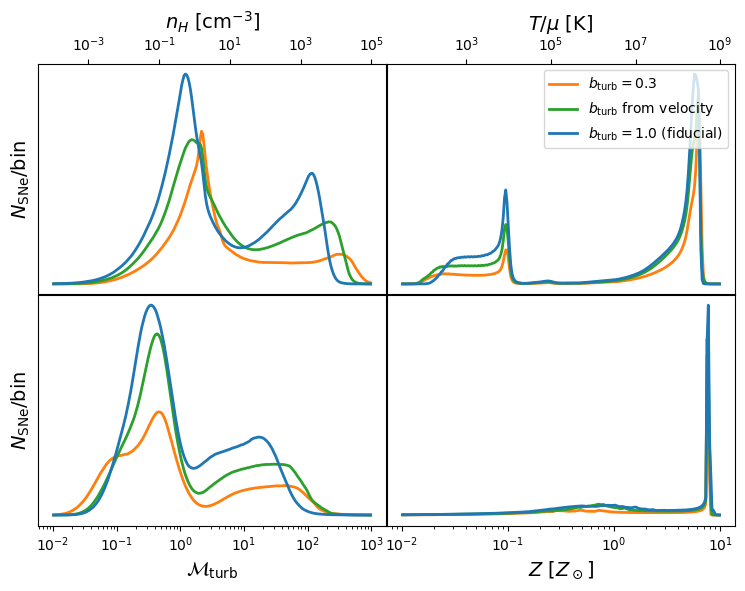

In [6]:
fig, axs = plt.subplots(figsize=(9, 6), nrows=2, ncols=2)
plt.subplots_adjust(wspace=1e-3, hspace=1e-3)

for j in range(2):
    for i in range(2):
        ax = axs[j, i]
        ax.set_xscale('log')
        if i==0: ax.set_ylabel(r'$N_{\rm SNe}/{\rm bin}$', fontsize=14)
        ax.set_yticks([])
        if j==0: 
            ax.xaxis.tick_top()
            ax.xaxis.set_label_position('top')
        if i==1:
            ax.yaxis.tick_right()
            ax.yaxis.set_label_position('right')

sim_list = [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]
color_list = ["C1", "C2", "C0"] 
linestyle_list = ["-"]*3
label_list = [r"$b_{\rm turb} = 0.3$", r"$b_{\rm turb}$ from velocity", r"$b_{\rm turb} = 1.0$ (fiducial)"]
   
for i in range(len(sim_list)):
    
    sim_round, sim_name = sim_list[i]
    sim_dir = move_to_sim_dir(sim_round, sim_name)
    data = SimpleNamespace(**np.load('starcat/data.npz'))

    color, linestyle = color_list[i], linestyle_list[i]
    axs[0, 0].plot(data.nH1d_death, data.nH_hist1d_death/1e8, lw=2, color=color, linestyle=linestyle)
    axs[0, 1].plot(data.temp1d_death, data.temp_hist1d_death/1e8, lw=2, color=color, linestyle=linestyle)
    axs[1, 0].plot(data.mach_turb1d_death, data.mach_turb_hist1d_death/1e8, lw=2, color=color, linestyle=linestyle)
    axs[1, 1].plot(data.metallicity1d_death/const.Z_sol, data.metallicity_hist1d_death/1e8, lw=2, color=color, linestyle=linestyle)
            
axs[0, 0].set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
axs[0, 1].set_xlabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
axs[1, 0].set_xlabel(r'$\mathcal{M}_{\rm turb}$', fontsize=14)
axs[1, 1].set_xlabel(r'$Z$ [$Z_\odot$]', fontsize=14)

color_lines = [Line2D([0], [0], color=color, lw=2, linestyle='-') for color in color_list]
axs[0, 1].legend(color_lines, label_list, fontsize=10, loc=1)

#save_fig('nsne_turb')


In [ ]:
sim_list = [(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")]
npz_list = ["data_d47_l1_b5.npz", "data_d52_l1_b5.npz", "data_d45_l1_b5.npz", "data_d53_l1_b5.npz", "data_d51_l1_b5.npz", "data_d51_l1_b5.npz", "data_d49_l1_b5.npz"]

nsim = len(sim_list)
num = 128

scale1d_list = np.zeros((nsim, num))
psd1d_list = np.zeros((nsim, num))

for i in range(nsim):
    
    sim_round, sim_name = sim_list[i]
    sim = Sim(sim_round, sim_name, npz_list[i])
    
    # compute wavenumber array
    freq = fftshift(fftfreq(int(sim.N), d=sim.dx))
    kx = freq.reshape(sim.N, 1, 1)
    ky = freq.reshape(1, sim.N, 1)
    kz = freq.reshape(1, 1, sim.N)
    k = np.sqrt(kx**2 + ky**2 + kz**2)
    
    # compute window function
    blackman3d = blackman(sim.N)[:, None, None] * blackman(sim.N)[None, :, None] * blackman(sim.N)[None, None, :]
    blackman3d /= np.sum(blackman3d)
    
    # compute the PSD
    n_H = const.X_cosmo * sim.density / const.m_H
    psd = fftshift(np.abs(fftn(n_H * blackman3d))**2)
    scale1d_list[i], psd1d_list[i] = calc_hist1d(1/k, weight=psd, do_log=True, vmin=(10*const.pc), vmax=(1000*const.pc), nbin=num)
    
np.savez('/home/za9132/analysis/fft', scale1d_list=scale1d_list, psd1d_list=psd1d_list)


In [7]:
data = np.load('/home/za9132/analysis/fft.npz')
scale1d_list = data['scale1d_list']
psd1d_list = data['psd1d_list']


(10, 1000)

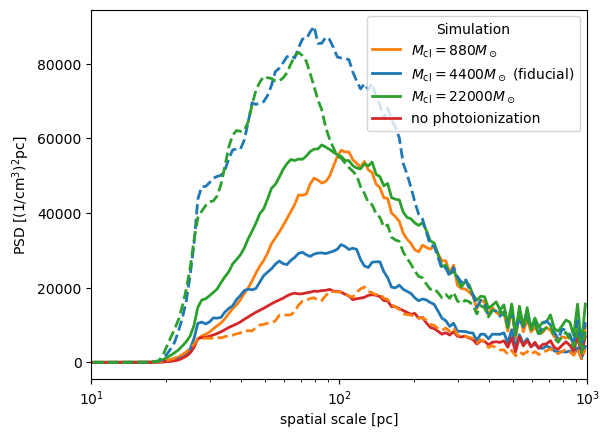

In [8]:
sim_list = [(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")]
label_list = [r"$M_{\rm cl} = 880 M_\odot$", r"$M_{\rm cl} = 4400 M_\odot$ (fiducial)", r"$M_{\rm cl} = 22000 M_\odot$", "no photoionization", None, None, None]
color_list = ["C1", "C0", "C2", "C3", "C1", "C0", "C2"]
linestyle_list = ['-']*4+['--']*3
nsim = len(sim_list)

for i in range(len(sim_list)):
    
    label = label_list[i]
    color = color_list[i]
    linestyle = linestyle_list[i]
    plt.plot(scale1d_list[i]/const.pc, psd1d_list[i], lw=2, color=color, linestyle=linestyle, label=label)

plt.xscale('log')
plt.xlabel('spatial scale [pc]')
plt.ylabel(r'PSD [${\rm (1/cm^3)^2 pc}$]')
plt.legend(title="Simulation", fontsize=10)
plt.xlim(10, 1000)


In [2]:
sim_list = [(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")]
npz_list = ["data_d47_l1_b5.npz", "data_d52_l1_b5.npz", "data_d45_l1_b5.npz", "data_d53_l1_b5.npz", "data_d51_l1_b5.npz", "data_d51_l1_b5.npz", "data_d49_l1_b5.npz"]
bound_list = [(1e-2, 1e4), (3e1, 3e4), (1e-1, 1e2), (1e-2*const.Z_sol, 1e1*const.Z_sol), (1/3, 1)]
do_log_list = [True, True, True, True, False]

nsim = len(sim_list)
nvar = 4
num = 256

bin_list = np.zeros((nsim, nvar, num))
hist_list = np.zeros((nsim, nvar, num))

for i in range(nsim):
    sim_round, sim_name = sim_list[i]
    sim = Sim(sim_round, sim_name, npz_list[i])
    var_list = [sim.n_H, sim.temp, sim.mach_turb, sim.metallicity]
    for j in range(nvar):
        bin_list[i, j], hist_list[i, j] = calc_hist1d(var_list[j], bound_list[j][0], bound_list[j][1], weight=(sim.density*sim.dV/const.M_sol), nbin=num)
    
np.savez('/home/za9132/analysis/gas_pdf1d_fbk', bin_list=bin_list, hist_list=hist_list)
    

Moving to directory '/home/za9132/scratch/romain/round9/mstar0p2'.
Moving to directory '/home/za9132/scratch/romain/round9/fiducial'.
Moving to directory '/home/za9132/scratch/romain/round9/mstar5p0'.
Moving to directory '/home/za9132/scratch/romain/round12/nophot'.
Moving to directory '/home/za9132/scratch/romain/round11/mstar0p2'.
Moving to directory '/home/za9132/scratch/romain/round11/mstar1p0'.
Moving to directory '/home/za9132/scratch/romain/round11/mstar5p0'.


In [ ]:
data = np.load('/home/za9132/analysis/gas_pdf1d_fbk.npz')
bin_list = data['bin_list']
hist_list = data['hist_list']


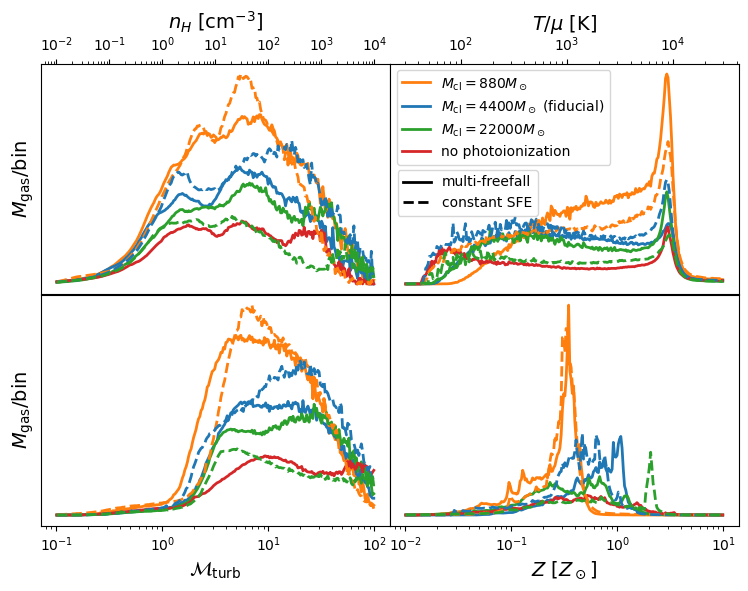

In [3]:
fig, axs = plt.subplots(figsize=(9, 6), nrows=2, ncols=2)
plt.subplots_adjust(wspace=1e-3, hspace=1e-3)

for j in range(2):
    for i in range(2):
        ax = axs[j, i]
        ax.set_xscale('log')
        if i==0: ax.set_ylabel(r'$M_{\rm gas}/{\rm bin}$', fontsize=14)
        ax.set_yticks([])
        if i==1:
            ax.yaxis.tick_right()
            ax.yaxis.set_label_position('right') 
        if j==0: 
            ax.xaxis.tick_top()
            ax.xaxis.set_label_position('top') 

sim_list = [(9, "mstar0p2"), (9, "fiducial"), (9, "mstar5p0"), (12, "nophot"), (11, "mstar0p2"), (11, "mstar1p0"), (11, "mstar5p0")]
color_list = ["C1", "C0", "C2", "C3", "C1", "C0", "C2"] 
linestyle_list = ["-"]*4+["--"]*3
label_list = [r"$M_{\rm cl} = 880 M_\odot$", r"$M_{\rm cl} = 4400 M_\odot$ (fiducial)", r"$M_{\rm cl} = 22000 M_\odot$", "no photoionization"]
nsim = len(sim_list)
    
for i in range(nsim):

    color, linestyle = color_list[i], linestyle_list[i]
    axs[0, 0].plot(bin_list[i, 0], hist_list[i, 0]/1e9, lw=2, color=color, linestyle=linestyle)
    axs[0, 1].plot(bin_list[i, 1], hist_list[i, 1]/1e9, lw=2, color=color, linestyle=linestyle)
    axs[1, 0].plot(bin_list[i, 2], hist_list[i, 2]/1e9, lw=2, color=color, linestyle=linestyle)
    axs[1, 1].plot(bin_list[i, 3]/const.Z_sol, hist_list[i, 3]/1e9, lw=2, color=color, linestyle=linestyle)
        
axs[0, 0].set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
axs[0, 1].set_xlabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
axs[1, 0].set_xlabel(r'$\mathcal{M}_{\rm turb}$', fontsize=14)
axs[1, 1].set_xlabel(r'$Z$ [$Z_\odot$]', fontsize=14)

color_lines = [Line2D([0], [0], color=color, lw=2, linestyle='-') for color in color_list]
linestyle_lines = [Line2D([0], [0], color='black', lw=2, linestyle='-'), Line2D([0], [0], color='black', lw=2, linestyle='--')]
legend1 = axs[0, 1].legend(color_lines, label_list, fontsize=10, loc=2)
legend2 = axs[0, 1].legend(linestyle_lines, ['multi-freefall', 'constant SFE'], fontsize=10, loc=(0.022, 0.34))
axs[0, 1].add_artist(legend1)

#save_fig('mgas_fbk')


In [4]:
sim_list = [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]
npz_list = ["data_d45_l1_b5.npz", "data_d47_l1_b5.npz", "data_d52_l1_b5.npz"]
bound_list = [(1e-2, 1e4), (3e1, 3e4), (1e-1, 1e2), (1e-2*const.Z_sol, 1e1*const.Z_sol), (1/3, 1)]

nsim = len(sim_list)
nvar = 5
num = 256

bin_list = np.zeros((nsim, nvar, num))
hist_list = np.zeros((nsim, nvar, num))

for i in range(nsim):
    sim_round, sim_name = sim_list[i]
    sim = Sim(sim_round, sim_name, npz_list[i])
    var_list = [sim.n_H, sim.temp, sim.mach_turb, sim.metallicity, sim.b_turb]
    for j in range(nvar):
        do_log = False if j==4 else True
        bin_list[i, j], hist_list[i, j] = calc_hist1d(var_list[j], bound_list[j][0], bound_list[j][1], weight=(sim.density*sim.dV/const.M_sol), nbin=num, do_log=do_log) 

np.savez('/home/za9132/analysis/gas_pdf1d_turb', bin_list=bin_list, hist_list=hist_list)


Moving to directory '/home/za9132/scratch/romain/round9/bturb0p3'.
Moving to directory '/home/za9132/scratch/romain/round9/bturbfunc'.
Moving to directory '/home/za9132/scratch/romain/round9/fiducial'.


In [5]:
data = np.load('/home/za9132/analysis/gas_pdf1d_turb.npz')
bin_list = data['bin_list']
hist_list = data['hist_list']


Text(0, 0.5, '$M_{\\rm gas}/{\\rm bin}$')

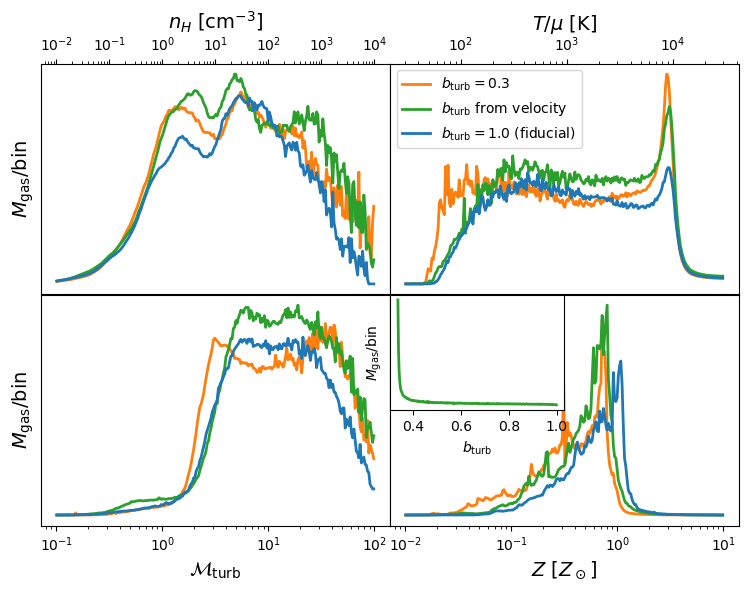

In [6]:
fig, axs = plt.subplots(figsize=(9, 6), nrows=2, ncols=2)
plt.subplots_adjust(wspace=1e-3, hspace=1e-3)

for j in range(2):
    for i in range(2):
        ax = axs[j, i]
        ax.set_xscale('log')
        if i==0: ax.set_ylabel(r'$M_{\rm gas}/{\rm bin}$', fontsize=14)
        ax.set_yticks([])
        if i==1:
            ax.yaxis.tick_right()
            ax.yaxis.set_label_position('right') 
        if j==0: 
            ax.xaxis.tick_top()
            ax.xaxis.set_label_position('top') 
axin = axs[1, 1].inset_axes([0., 0.5, 0.5, 0.5], yticks=[])

sim_list = [(9, "bturb0p3"), (9, "bturbfunc"), (9, "fiducial")]
color_list = ["C1", "C2", "C0"] 
linestyle_list = ["-"]*3
label_list = [r"$b_{\rm turb} = 0.3$", r"$b_{\rm turb}$ from velocity", r"$b_{\rm turb} = 1.0$ (fiducial)"]
nsim = len(sim_list)
    
for i in range(nsim):

    color, linestyle = color_list[i], linestyle_list[i]
    axs[0, 0].plot(bin_list[i, 0], hist_list[i, 0]/1e9, lw=2, color=color, linestyle=linestyle)
    axs[0, 1].plot(bin_list[i, 1], hist_list[i, 1]/1e9, lw=2, color=color, linestyle=linestyle)
    axs[1, 0].plot(bin_list[i, 2], hist_list[i, 2]/1e9, lw=2, color=color, linestyle=linestyle)
    axs[1, 1].plot(bin_list[i, 3]/const.Z_sol, hist_list[i, 3]/1e9, lw=2, color=color, linestyle=linestyle)
    
    if i==1: axin.plot(bin_list[i, 4], hist_list[i, 4]/1e9, lw=2, color=color)
        
axs[0, 0].set_xlabel(r'$n_H$ [${\rm cm^{-3}}$]', fontsize=14)
axs[0, 1].set_xlabel(r'$T/\mu$ [${\rm K}$]', fontsize=14)
axs[1, 0].set_xlabel(r'$\mathcal{M}_{\rm turb}$', fontsize=14)
axs[1, 1].set_xlabel(r'$Z$ [$Z_\odot$]', fontsize=14)

color_lines = [Line2D([0], [0], color=color, lw=2, linestyle='-') for color in color_list]
axs[0, 1].legend(color_lines, label_list, fontsize=10)

axin.set_xlabel(r"$b_{\rm turb}$")
axin.set_ylabel(r'$M_{\rm gas}/{\rm bin}$')

#save_fig('mgas_turb')
